In [1]:
library(ggplot2)
library(reshape2)
library(gridExtra)
library(ggplot2)
library(tidyverse)
library(gridExtra)
library(GGally)
library(plotly)
library(corrplot)
library(reshape2)
library(FactoMineR) 
library(factoextra)
library(glmnet) 
library(ggfortify)
library(pROC)
library(ROCR)
library(RColorBrewer)
library(mapview)
library(leaflet)
library(viridis)


── Attaching core tidyverse packages ──────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ lubridate 1.9.3     ✔ tibble    3.2.1
✔ purrr     1.0.2     ✔ tidyr     1.3.1
── Conflicts ────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::combine() masks gridExtra::combine()
✖ dplyr::filter()  masks stats::filter()
✖ dplyr::lag()     masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attachement du package : 'plotly'


L'objet suivant est masqué depuis 'package:ggplot2':

    last_plot


L'objet suivant est masqué depuis 'package:stats':

    filter


L'objet suivant est masqué depuis 'package:graphics':

    layout


corrplot 0.92 loaded

Welcome! Want to learn more?

In [3]:
# direct loading from stored data on PLMlab
load('data/velib.RData')
summary(velib)
# alternative: load the data from package funFEM, where you have more information (help page)

         Length Class      Mode     
data      181   data.frame list     
position    2   data.frame list     
dates     181   -none-     character
bonus    1189   -none-     numeric  
names    1189   -none-     character

In [4]:
# data preparation
loading = as.matrix(velib$data)
colnames(loading) = 1:ncol(loading)
rownames(loading) = velib$names

stations = 1:nrow(loading)
coord = velib$position[stations,]
coord$bonus = velib$bonus[stations]

# select exactly 7 days of data (we remove the first 13 dates)
dates = 14:181
loading = loading[stations, dates]
colnames(loading) = 1:length(dates)

head(loading)
head(coord)

,1,2,3,4,5,6,7,8,9,10,⋯,159,160,161,162,163,164,165,166,167,168
EURYALE DEHAYNIN,0.03846154,0.03846154,0.07692308,0.03846154,0.03846154,0.03846154,0.03846154,0.03846154,0.10714286,0.00000000,⋯,0.29629630,0.11111111,0.1111111,0.14814815,0.30769231,0.07692308,0.11538462,0.07692308,0.1538462,0.1538462
LEMERCIER,0.47826087,0.47826087,0.47826087,0.43478261,0.43478261,0.43478261,0.43478261,0.43478261,0.26086957,0.04347826,⋯,0.04347826,0.00000000,0.2173913,0.13043478,0.04545455,0.17391304,0.17391304,0.17391304,0.2608696,0.3913043
MEZIERES RENNES,0.21818182,0.14545455,0.12727273,0.10909091,0.10909091,0.10909091,0.09090909,0.09090909,0.05454545,0.10909091,⋯,0.25925926,0.25925926,0.2037037,0.12962963,0.14814815,0.29629630,0.31481481,0.37037037,0.3703704,0.4074074
FARMAN,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,1.00000000,1.00000000,1.00000000,⋯,1.00000000,1.00000000,0.9047619,0.85714286,0.85714286,0.85714286,0.76190476,0.76190476,0.7619048,0.7619048
QUAI DE LA RAPEE,0.92753623,0.81159420,0.73913043,0.72463768,0.72463768,0.72463768,0.72463768,0.72463768,0.75362319,0.97101449,⋯,0.22727273,0.45454545,0.5909091,0.83333333,1.00000000,0.81818182,0.63636364,0.71212121,0.6212121,0.5757576
CHOISY POINT D'IVRY,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.08333333,0.00000000,⋯,0.34782609,0.08695652,0.1153846,0.08695652,0.13043478,0.08695652,0.08695652,0.43478261,0.3913043,0.5217391


,longitude,latitude,bonus
,<dbl>,<dbl>,<dbl>
19117,2.377389,48.88630,0
17111,2.317591,48.89002,0
6103,2.330447,48.85030,0
15042,2.271396,48.83373,0
12003,2.366897,48.84589,0
13038,2.363335,48.82191,0


ℹ Google's Terms of Service: <https://mapsplatform.google.com>
  Stadia Maps' Terms of Service: <https://stadiamaps.com/terms-of-service/>
  OpenStreetMap's Tile Usage Policy: <https://operations.osmfoundation.org/policies/tiles/>
ℹ Please cite ggmap if you use it! Use `citation("ggmap")` for details.

Attachement du package : 'ggmap'


L'objet suivant est masqué depuis 'package:plotly':

    wind


ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



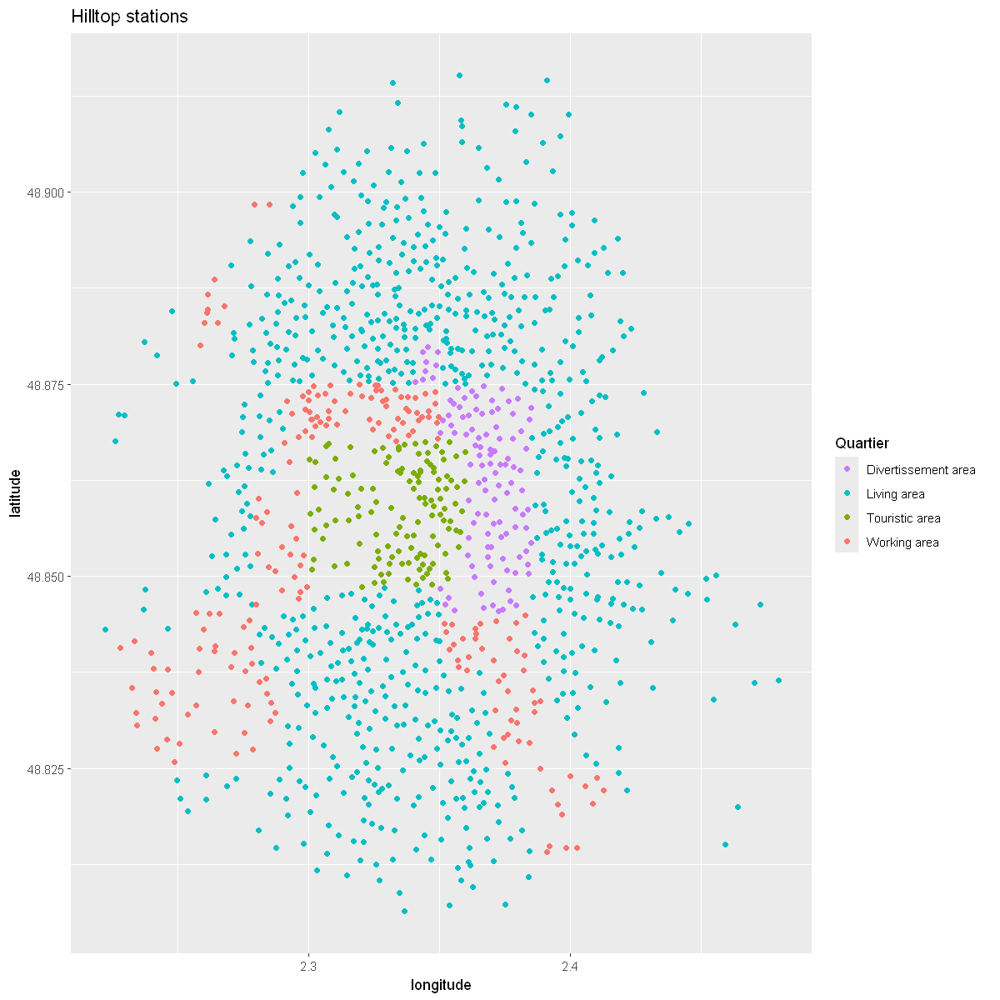

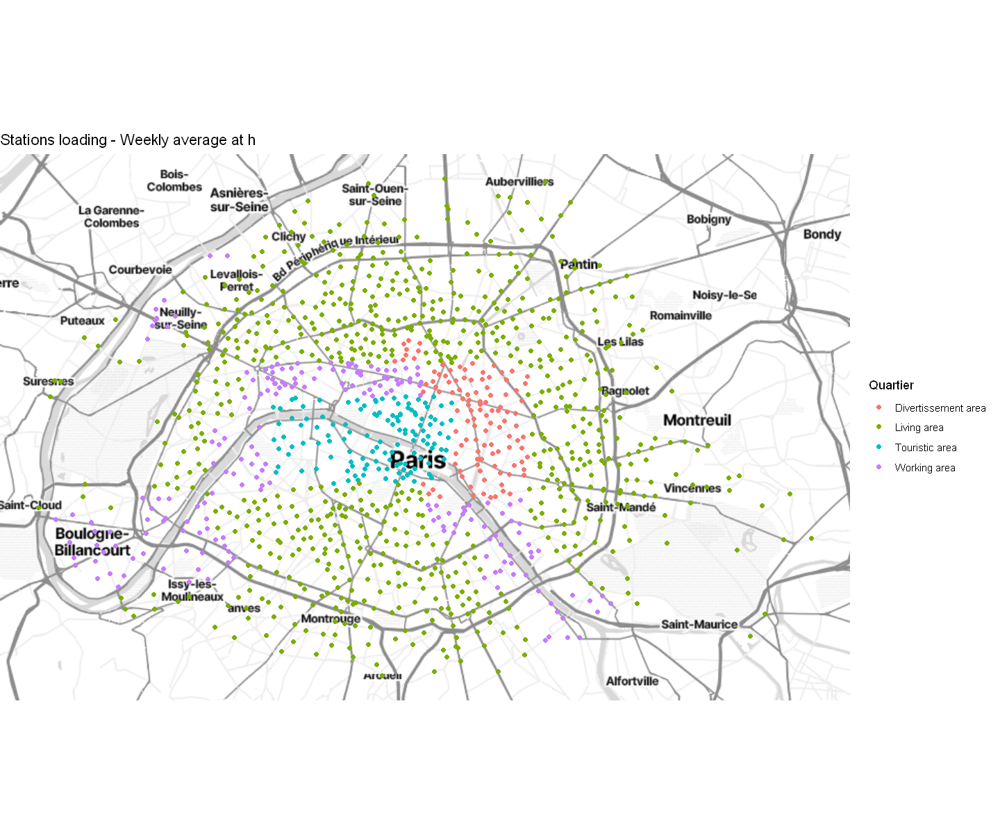

In [5]:
library(ggmap)
coord$Quartier <- ifelse(between(coord$latitude, 48.8, 48.125) & between(coord$longitude, 2.3, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8, 48.8125) & between(coord$longitude, 2.35, 2.4), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.2, 2.3), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.3, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.35, 2.388), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.388, 2.415), "Working area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.415, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.2, 2.25), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.25, 2.29), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.29, 2.37), "Living area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.37, 2.39), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.39, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8425) & between(coord$longitude, 2.2, 2.25), "Working area",
                  ifelse(between(coord$latitude, 48.8425, 48.85) & between(coord$longitude, 2.2, 2.25), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.25, 2.28), "Working area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.28, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.35, 2.385), "Working area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.25, 2.28), "Living area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.28, 2.3), "Working area",
                  ifelse(between(coord$latitude, 48.8485, 48.8675) & between(coord$longitude, 2.3, 2.36), "Touristic area",
                  ifelse(between(coord$latitude, 48.86, 48.8675) & between(coord$longitude, 2.36, 2.37), "Divertissement area",
                  ifelse(between(coord$latitude, 48.86, 48.8625) & between(coord$longitude, 2.37, 2.39), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8455, 48.86) & between(coord$longitude, 2.35, 2.385), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.2, 2.29), "Living area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.29, 2.35), "Working area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.35, 2.385), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.88) & between(coord$longitude, 2.2, 2.3), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.88) & between(coord$longitude, 2.34, 2.35), "Divertissement area",
                  ifelse(between(coord$latitude, 48.88, 48.89) & between(coord$longitude, 2.25, 2.27), "Working area",
                  ifelse(between(coord$latitude, 48.898, 48.9) & between(coord$longitude, 2.27, 2.29), "Working area",
                  ifelse(between(coord$latitude, 48.875, 48.885) & between(coord$longitude, 2.3, 2.34), "Living area",
                  ifelse(between(coord$latitude, 48.88, 48.885) & between(coord$longitude, 2.34, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.885) & between(coord$longitude, 2.35, 2.5), "Living area",    
                  ifelse(between(coord$latitude, 48.885, 49) & between(coord$longitude, 2.29, 2.32), "Living area","Living area")))))))))))))))))))))))))))))))))))))
options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(coord, aes(x=longitude, y=latitude, color=Quartier)) + 
    geom_point() +
    scale_color_hue(direction = -1) +
    labs(title = 'Hilltop stations')
# --- #
options(repr.plot.width = 12, repr.plot.height = 10)

qmplot(data=coord, longitude, latitude, color=Quartier) +
    labs(title = paste('Stations loading - Weekly average at','h'))


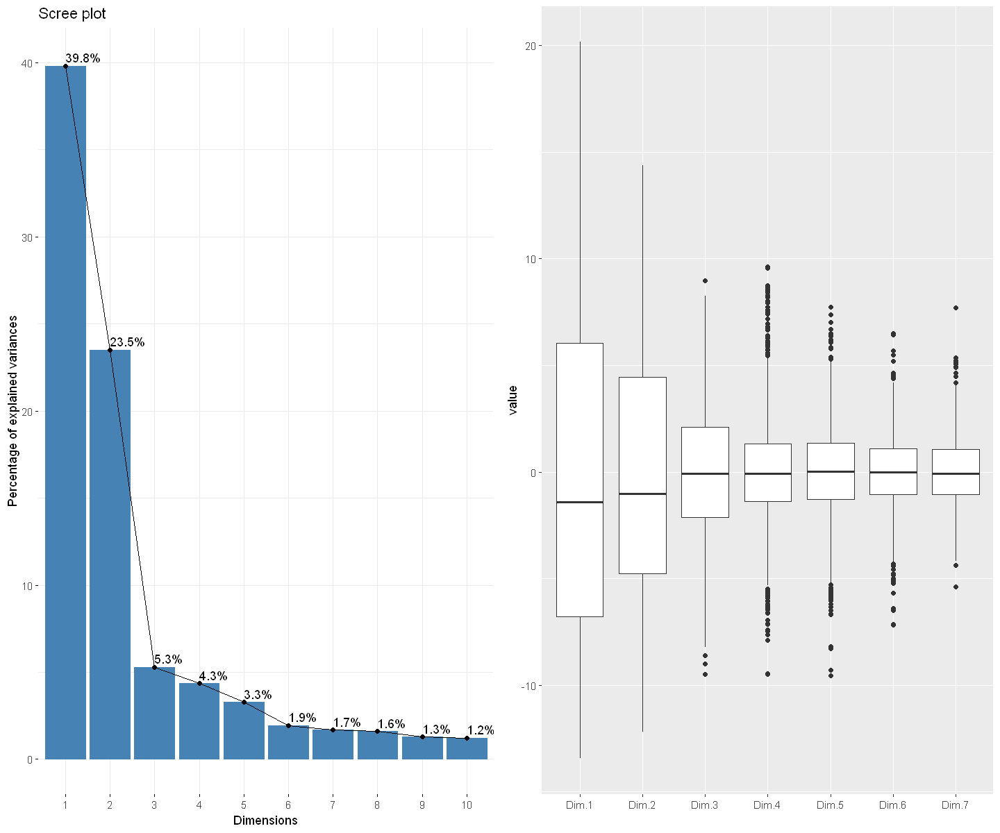

In [6]:
### ACP
loading <- as.data.frame(loading)
loading$Hill <- as.factor(coord$bonus)
loading$Quartier <- ifelse(between(coord$latitude, 48.8, 48.125) & between(coord$longitude, 2.3, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8, 48.8125) & between(coord$longitude, 2.35, 2.4), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.2, 2.3), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.3, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.35, 2.388), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.388, 2.415), "Working area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.415, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.2, 2.25), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.25, 2.29), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.29, 2.37), "Living area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.37, 2.39), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.39, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8425) & between(coord$longitude, 2.2, 2.25), "Working area",
                  ifelse(between(coord$latitude, 48.8425, 48.85) & between(coord$longitude, 2.2, 2.25), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.25, 2.28), "Working area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.28, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.35, 2.385), "Working area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.25, 2.28), "Living area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.28, 2.3), "Working area",
                  ifelse(between(coord$latitude, 48.8485, 48.8675) & between(coord$longitude, 2.3, 2.36), "Touristic area",
                  ifelse(between(coord$latitude, 48.86, 48.8675) & between(coord$longitude, 2.36, 2.37), "Divertissement area",
                  ifelse(between(coord$latitude, 48.86, 48.8625) & between(coord$longitude, 2.37, 2.39), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8455, 48.86) & between(coord$longitude, 2.35, 2.385), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.2, 2.29), "Living area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.29, 2.35), "Working area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.35, 2.385), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.88) & between(coord$longitude, 2.2, 2.3), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.88) & between(coord$longitude, 2.34, 2.35), "Divertissement area",
                  ifelse(between(coord$latitude, 48.88, 48.89) & between(coord$longitude, 2.25, 2.27), "Working area",
                  ifelse(between(coord$latitude, 48.898, 48.9) & between(coord$longitude, 2.27, 2.29), "Working area",
                  ifelse(between(coord$latitude, 48.875, 48.885) & between(coord$longitude, 2.3, 2.34), "Living area",
                  ifelse(between(coord$latitude, 48.88, 48.885) & between(coord$longitude, 2.34, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.885) & between(coord$longitude, 2.35, 2.5), "Living area",    
                  ifelse(between(coord$latitude, 48.885, 49) & between(coord$longitude, 2.29, 2.32), "Living area","Living area")))))))))))))))))))))))))))))))))))))
loading$Quartier <- as.factor(loading$Quartier)
library(FactoMineR)
acp <- PCA(loading, scale.unit = TRUE,
           graph = FALSE, quali.sup=c(169,170), ncp = 7)
# Décroissance des valeurs propres
library(factoextra)
g1<-fviz_eig(acp, addlabels = TRUE, ylim = c(0, 40))
library(reshape2)
g2<-ggplot(melt(acp$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

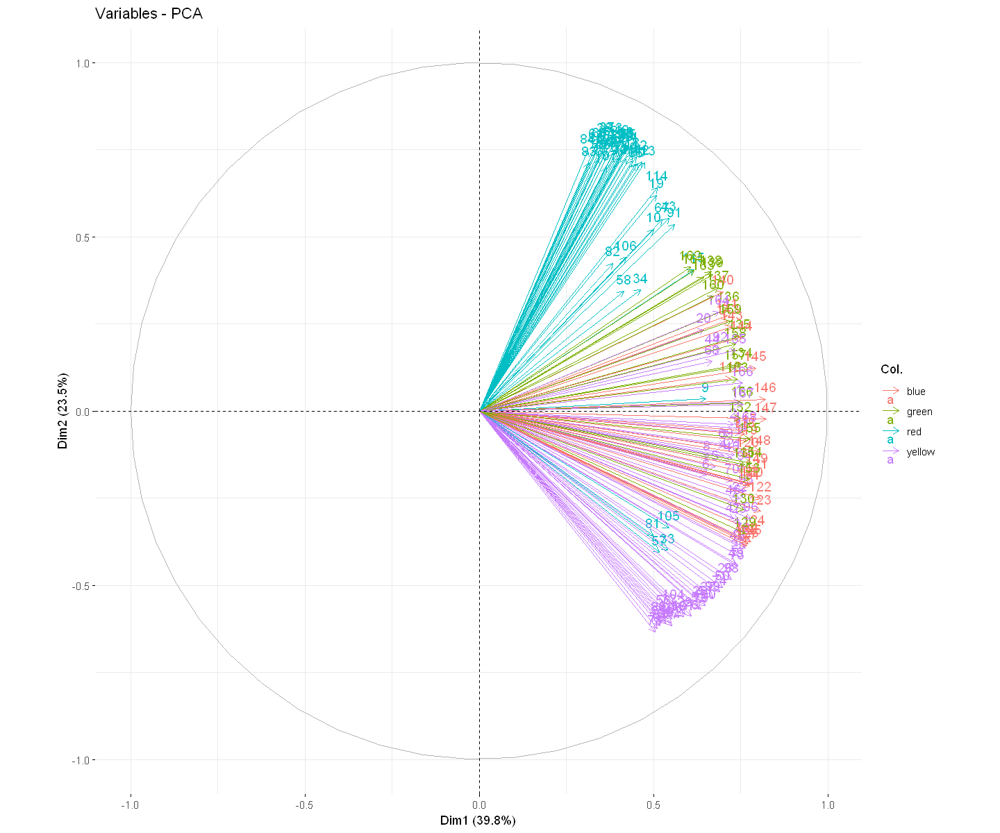

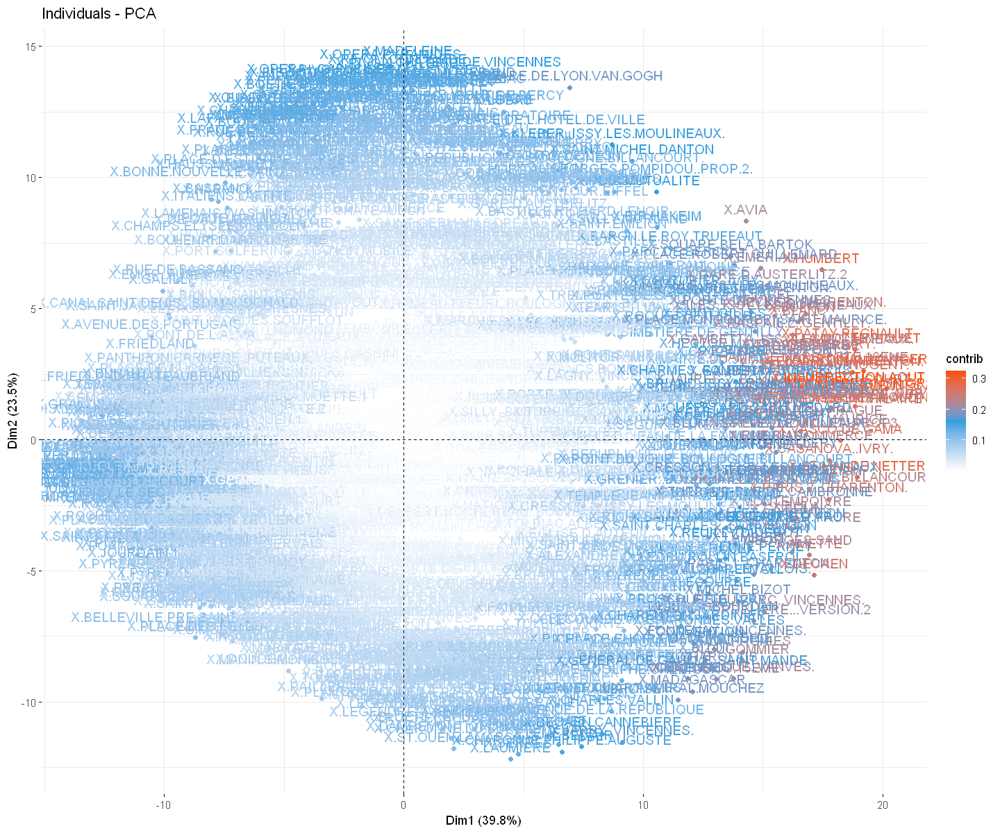

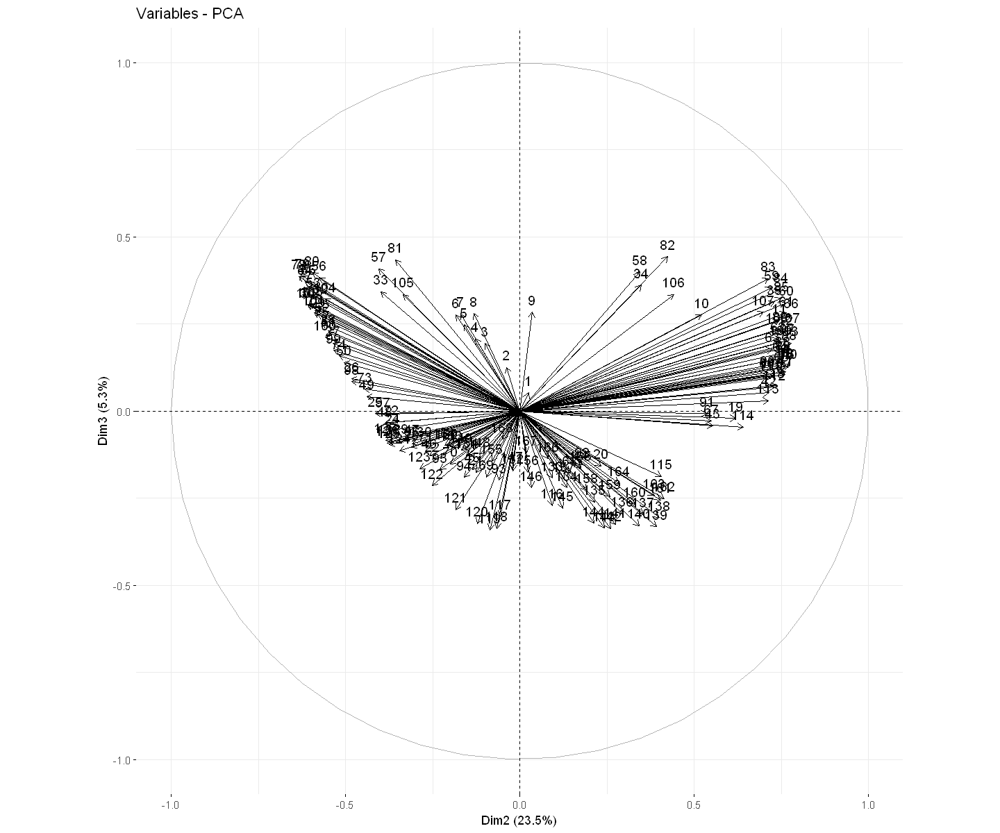

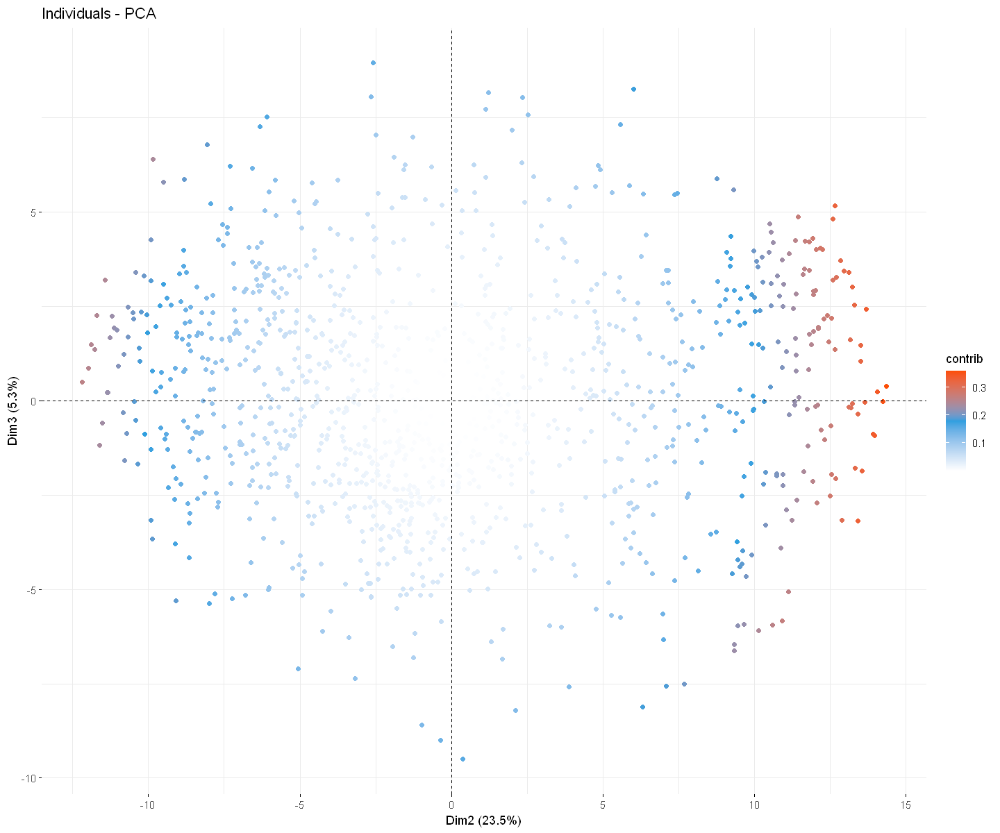

In [8]:
col.var <- rep("blue", 168)
col.var[1:8] <- "yellow"
col.var[20:32] <- "yellow"
col.var[9:19] <- "red"
col.var[33:43] <- "red"
col.var[44:56] <- "yellow"
col.var[57:67] <- "red"
col.var[68:80] <- "yellow"
col.var[81:91] <- "red"
col.var[92:104] <- "yellow"
col.var[105:115] <- "red"
col.var[129:139] <- "green"
col.var[153:163] <- "green"
col.var[164:168] <- "yellow"
col.var[116:128] <- "blue"
col.var[140:152] <- "blue"
fviz_pca_var(acp, col.var = col.var)
fviz_pca_ind(acp,col.ind="contrib",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ))
fviz_pca_var(acp,axes=c(2,3))
fviz_pca_ind(acp,col.ind="contrib",label="none",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ),axes=c(2,3))

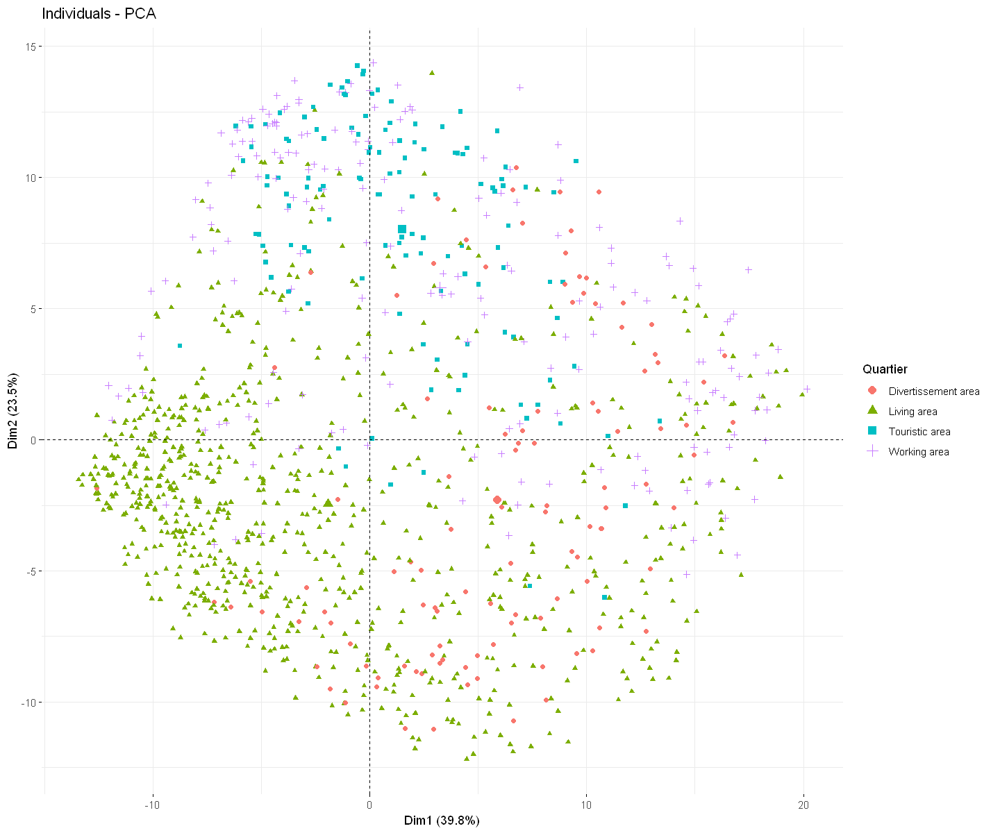

In [7]:
fviz_pca_ind(acp, label="none", habillage=170)

In [8]:
minuit_am <- rowMeans(loading[,c(1,25,49,73,97,121,145)])
une_am <- rowMeans(loading[,c(2,26,50,74,98,122,146)])
deux_am <- rowMeans(loading[,c(3,27,51,75,99,123,147)])
trois_am <- rowMeans(loading[,c(4,28,52,76,100,124,148)])
quatre_am <- rowMeans(loading[,c(5,29,53,77,101,125,149)])
cinq_am <- rowMeans(loading[,c(6,30,54,78,102,126,150)])
six_am <- rowMeans(loading[,c(7,31,55,79,103,127,151)])
sept_am <- rowMeans(loading[,c(8,32,56,80,104,128,152)])
huit_am <- rowMeans(loading[,c(9,33,57,81,105,129,153)])
neuf_am <- rowMeans(loading[,c(10,34,58,82,106,130,154)])
dix_am <- rowMeans(loading[,c(11,35,59,83,107,131,155)])
onze_am <- rowMeans(loading[,c(12,36,60,84,108,132,156)])
minuit_pm <- rowMeans(loading[,c(13,37,61,85,109,133,157)])
une_pm <- rowMeans(loading[,c(14,38,62,86,110,134,158)])
deux_pm <- rowMeans(loading[,c(15,39,63,87,111,135,159)])
trois_pm <- rowMeans(loading[,c(16,40,64,88,112,136,160)])
quatre_pm <- rowMeans(loading[,c(17,41,65,89,113,137,161)])
cinq_pm <- rowMeans(loading[,c(18,42,66,90,114,138,162)])
six_pm <- rowMeans(loading[,c(19,43,67,91,115,139,163)])
sept_pm <- rowMeans(loading[,c(20,44,68,92,116,140,164)])
huit_pm <- rowMeans(loading[,c(21,45,69,93,117,141,165)])
neuf_pm <- rowMeans(loading[,c(22,46,70,94,118,142,166)])
dix_pm <- rowMeans(loading[,c(23,47,71,95,119,143,167)])
onze_pm <- rowMeans(loading[,c(24,48,72,96,120,144,168)])
df1 <- data.frame(Minuit = minuit_am, "une h" = une_am, "2h" = deux_am, "3h" = trois_am, "4h" = quatre_am, "5h" = cinq_am, "6h" = six_am, "7h" = sept_am, "8h" = huit_am, "9h" = neuf_am
                 , "10h" = dix_am, "11h" = onze_am, "12h" = minuit_pm, "13h" = une_pm, "14h" = deux_pm, "15h" = trois_pm, "16h" = quatre_pm, "17h" = cinq_pm, "18h" = six_pm, 
                 "19h" = sept_pm, "20h" = huit_pm, "21h" = neuf_pm, "22h" = dix_pm, "23h" = onze_pm)

colnames(df1) <- list("0h", "1h", "2h","3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h")
df1$Station <- velib$names
df1$Hill <- as.factor(coord$bonus)

df1$Quartier <- ifelse(between(coord$latitude, 48.8, 48.125) & between(coord$longitude, 2.3, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8, 48.8125) & between(coord$longitude, 2.35, 2.4), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.2, 2.3), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.3, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.35, 2.388), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.388, 2.415), "Working area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.415, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.2, 2.25), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.25, 2.29), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.29, 2.37), "Living area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.37, 2.39), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.39, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8425) & between(coord$longitude, 2.2, 2.25), "Working area",
                  ifelse(between(coord$latitude, 48.8425, 48.85) & between(coord$longitude, 2.2, 2.25), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.25, 2.28), "Working area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.28, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.35, 2.385), "Working area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.25, 2.28), "Living area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.28, 2.3), "Working area",
                  ifelse(between(coord$latitude, 48.8485, 48.8675) & between(coord$longitude, 2.3, 2.36), "Touristic area",
                  ifelse(between(coord$latitude, 48.86, 48.8675) & between(coord$longitude, 2.36, 2.37), "Divertissement area",
                  ifelse(between(coord$latitude, 48.86, 48.8625) & between(coord$longitude, 2.37, 2.39), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8455, 48.86) & between(coord$longitude, 2.35, 2.385), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.2, 2.29), "Living area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.29, 2.35), "Working area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.35, 2.385), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.88) & between(coord$longitude, 2.2, 2.3), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.88) & between(coord$longitude, 2.34, 2.35), "Divertissement area",
                  ifelse(between(coord$latitude, 48.88, 48.89) & between(coord$longitude, 2.25, 2.27), "Working area",
                  ifelse(between(coord$latitude, 48.898, 48.9) & between(coord$longitude, 2.27, 2.29), "Working area",
                  ifelse(between(coord$latitude, 48.875, 48.885) & between(coord$longitude, 2.3, 2.34), "Living area",
                  ifelse(between(coord$latitude, 48.88, 48.885) & between(coord$longitude, 2.34, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.885) & between(coord$longitude, 2.35, 2.5), "Living area",    
                  ifelse(between(coord$latitude, 48.885, 49) & between(coord$longitude, 2.29, 2.32), "Living area","Living area")))))))))))))))))))))))))))))))))))))
df1$Quartier <- as.factor(df1$Quartier)
df1$Station <- as.factor(df1$Station)
head(df1)

,0h,1h,2h,3h,4h,5h,6h,7h,8h,9h,⋯,17h,18h,19h,20h,21h,22h,23h,Station,Hill,Quartier
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>
X.EURYALE.DEHAYNIN,0.3174749,0.3316472,0.3639746,0.3839903,0.3951393,0.4000523,0.4106343,0.3843683,0.3996599,0.1249055,⋯,0.06216931,0.1724519,0.2515408,0.5242311,0.5019187,0.5754550,0.5119629,EURYALE DEHAYNIN,0,Living area
X.LEMERCIER,0.8385093,0.8260870,0.8074534,0.8198758,0.8260870,0.8260870,0.8260870,0.8136646,0.6956522,0.2298137,⋯,0.12422360,0.1431395,0.4409938,0.7204969,0.7391304,0.7888199,0.8074534,LEMERCIER,0,Living area
X.MEZIERES.RENNES,0.4757743,0.4134847,0.3914403,0.3887948,0.3756635,0.3548842,0.3522868,0.3524311,0.2828659,0.3371813,⋯,0.59124579,0.5814125,0.5651965,0.5287513,0.5691700,0.5728799,0.5572558,MEZIERES RENNES,0,Touristic area
X.FARMAN,0.2312925,0.2380952,0.2312925,0.2517007,0.2517007,0.2517007,0.2517007,0.2811791,0.4565826,0.7823129,⋯,0.63605442,0.2664399,0.2312925,0.2335601,0.2108844,0.2040816,0.1972789,FARMAN,0,Working area
X.QUAI.DE.LA.RAPEE,0.5578916,0.5081458,0.4617051,0.4190691,0.3768585,0.3475134,0.3139657,0.3111874,0.3011764,0.4912834,⋯,0.73575961,0.6653876,0.5577936,0.4690331,0.5199493,0.5043376,0.5094532,QUAI DE LA RAPEE,0,Divertissement area
X.CHOISY.POINT.D.IVRY,0.4001035,0.4653209,0.4593685,0.4831781,0.4764493,0.4945652,0.5007764,0.4169255,0.3276398,0.1669255,⋯,0.26371636,0.1863354,0.4138199,0.3713768,0.4492754,0.4252070,0.4679089,CHOISY POINT D'IVRY,0,Living area


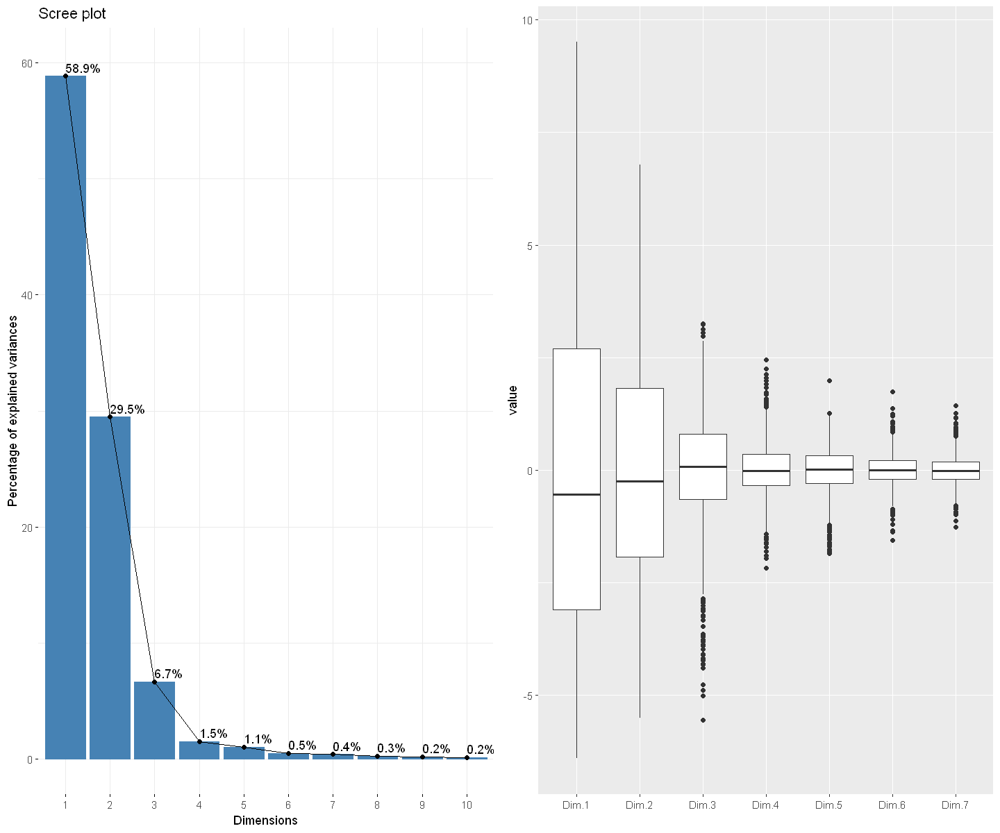

In [9]:
# ACP réduite
acp1 <- PCA(df1, scale.unit = TRUE,
           graph = FALSE, quali.sup = c(25,26,27), ncp = 7)
# Décroissance des valeurs propres
library(factoextra)
g1<-fviz_eig(acp1, addlabels = TRUE, ylim = c(0, 60))
library(reshape2)
g2<-ggplot(melt(acp1$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

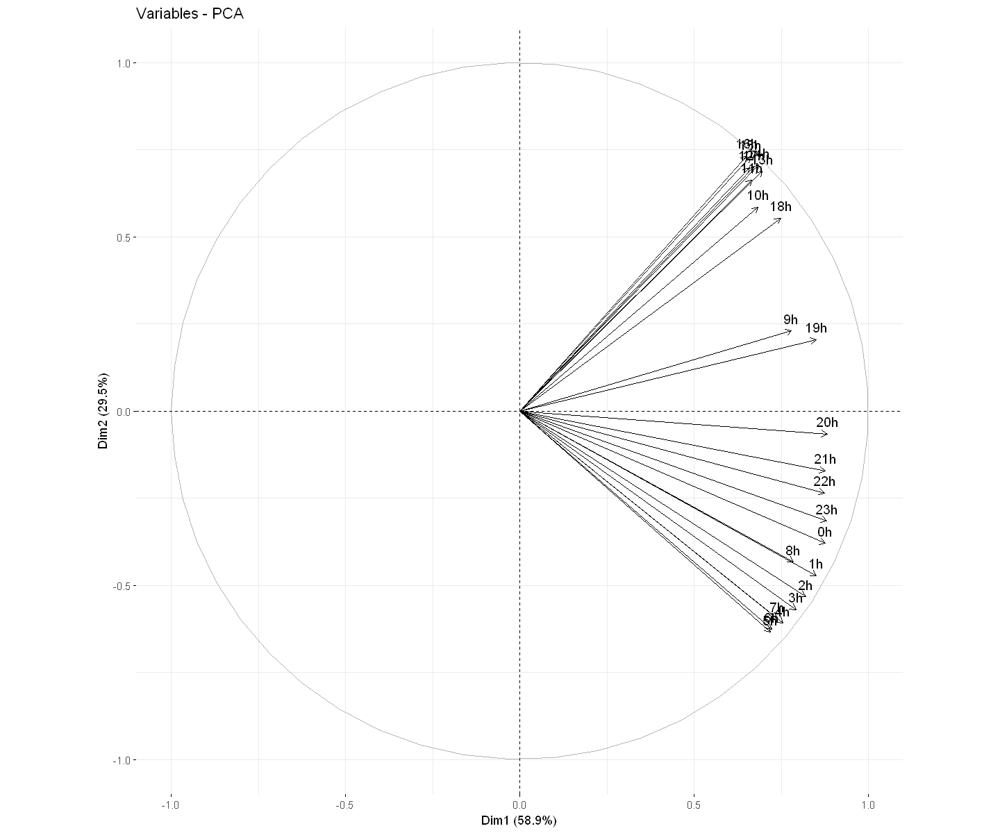

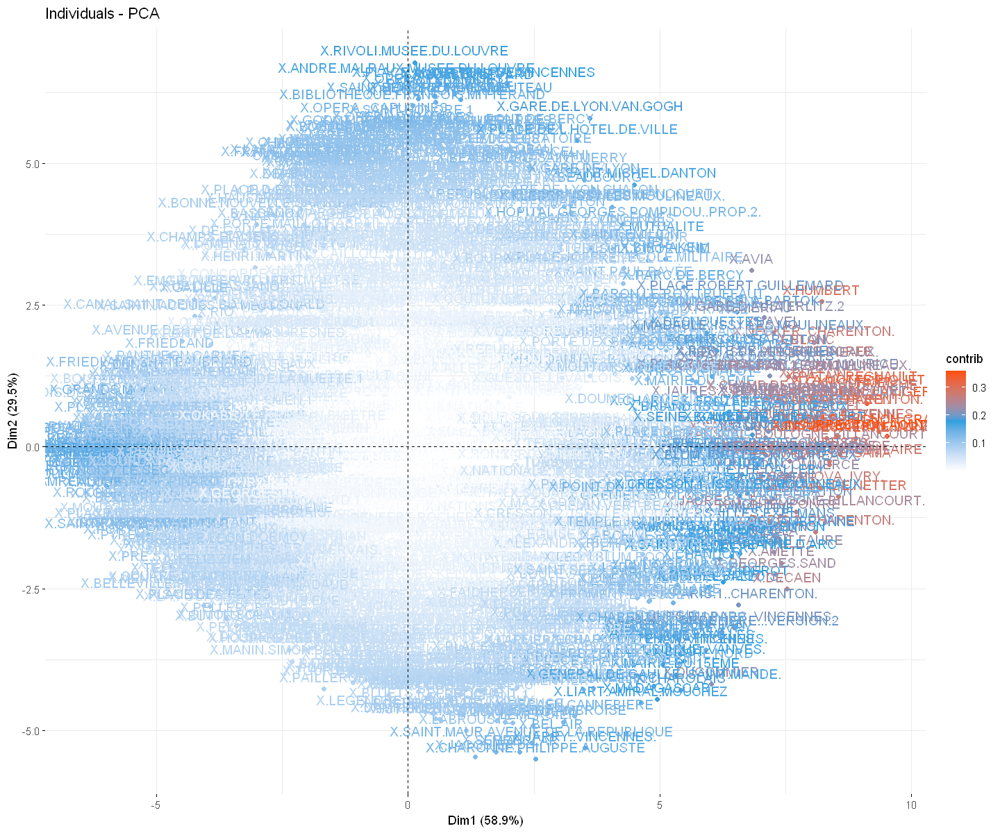

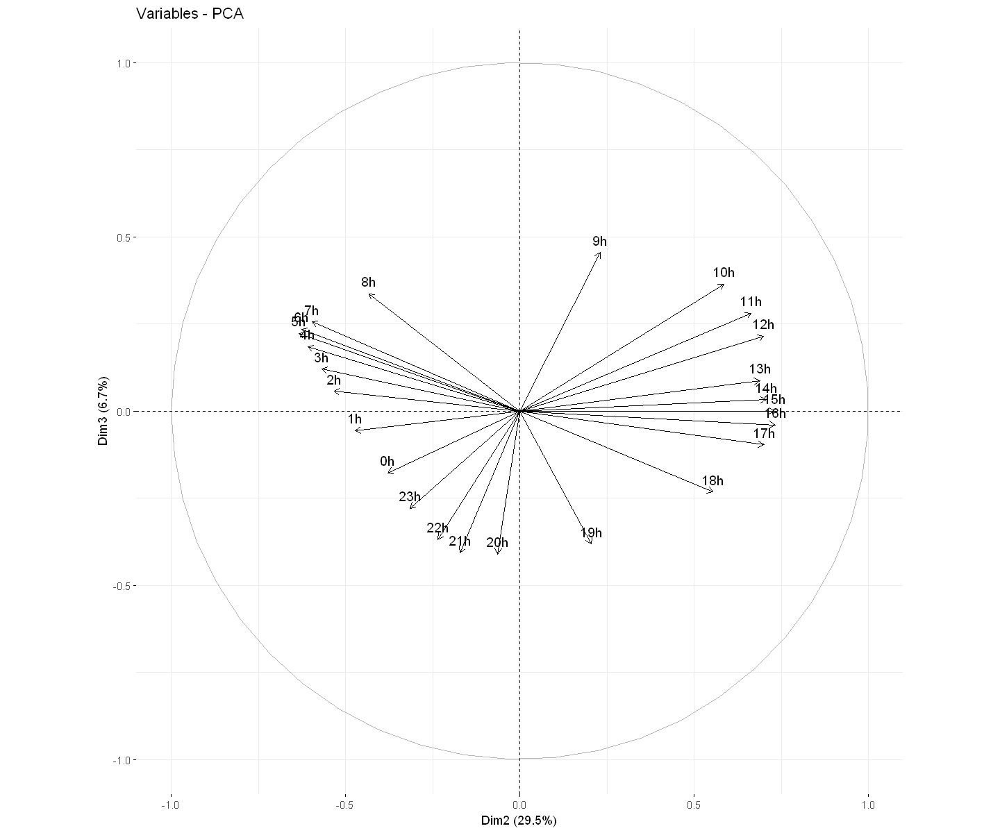

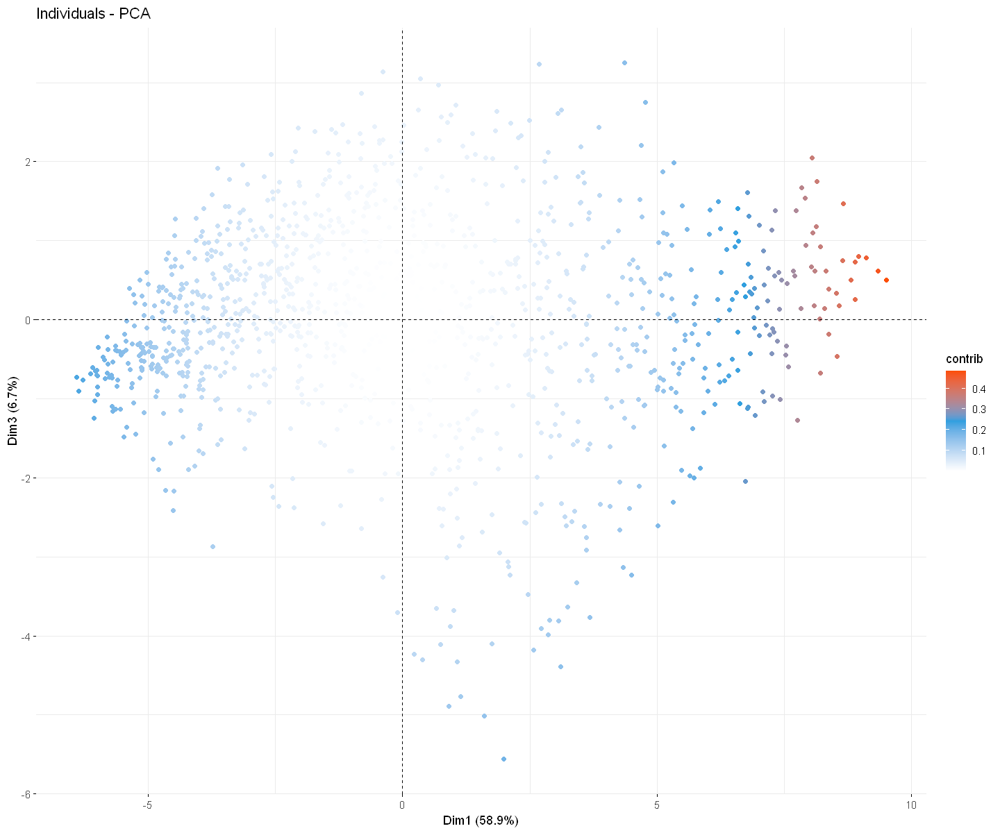

In [10]:
fviz_pca_var(acp1)
fviz_pca_ind(acp1,col.ind="contrib",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ))
fviz_pca_var(acp1,axes=c(2,3))
fviz_pca_ind(acp1,col.ind="contrib",label="none",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ),axes=c(1,3))

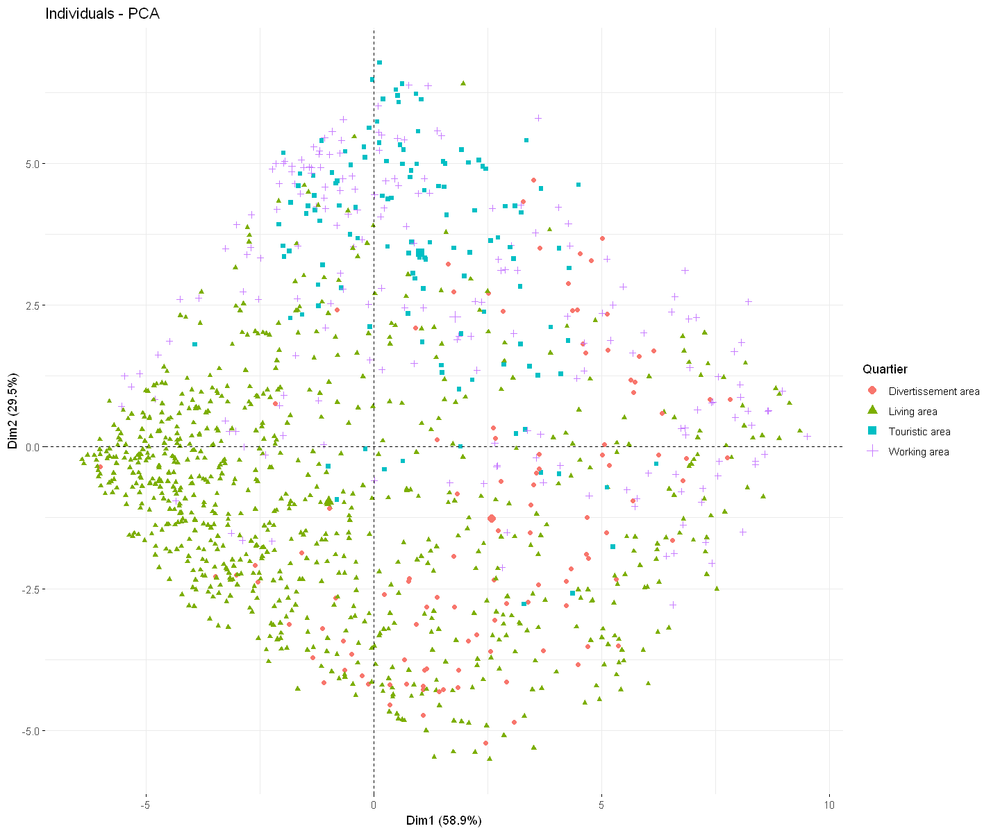

In [11]:
fviz_pca_ind(acp1, label="none", habillage=27)

In [15]:
### C1 : proportionnelle au taux de chargement quotidien  : le poids des heures est le même sur le chargement quotidient : effet 
### d'équilibrage entre les stations pleines la nuit et celles pleines le jour
### C2 : différence jour/nuit. Jour : entre 9h et 19h (inclus)
### difficile de dégager des classes vis à vis de la position de la station
### néanmoins, pleines la nuit = périphérie, pleines le jour = centre ville

In [12]:
lundi <- rowMeans(loading[,c(1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24)])
mardi <- rowMeans(loading[,c(25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48)])
mercredi <- rowMeans(loading[,c(49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72)])
jeudi <- rowMeans(loading[,c(73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96)])
vendredi <- rowMeans(loading[,c(97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120)])
samedi <- rowMeans(loading[,c(121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144)])
dimanche <- rowMeans(loading[,c(145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168)])

df2 <- data.frame(lundi,mardi,mercredi,jeudi,vendredi,samedi,dimanche)

colnames(df2) <- list("Lundi","Mardi","Mercredi","Jeudi","Vendredi","Samedi","Dimanche")
df2$Station <- velib$names
df2$Hill <- as.factor(coord$bonus)

df2$Quartier <- ifelse(between(coord$latitude, 48.8, 48.125) & between(coord$longitude, 2.3, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8, 48.8125) & between(coord$longitude, 2.35, 2.4), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.2, 2.3), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.3, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.35, 2.388), "Living area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.388, 2.415), "Working area",
                  ifelse(between(coord$latitude, 48.8125, 48.825) & between(coord$longitude, 2.415, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.2, 2.25), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.25, 2.29), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.29, 2.37), "Living area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.37, 2.39), "Working area",
                  ifelse(between(coord$latitude, 48.825, 48.8375) & between(coord$longitude, 2.39, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8425) & between(coord$longitude, 2.2, 2.25), "Working area",
                  ifelse(between(coord$latitude, 48.8425, 48.85) & between(coord$longitude, 2.2, 2.25), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.25, 2.28), "Working area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.28, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.35, 2.385), "Working area",
                  ifelse(between(coord$latitude, 48.8375, 48.8455) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.25, 2.28), "Living area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.28, 2.3), "Working area",
                  ifelse(between(coord$latitude, 48.8485, 48.8675) & between(coord$longitude, 2.3, 2.36), "Touristic area",
                  ifelse(between(coord$latitude, 48.86, 48.8675) & between(coord$longitude, 2.36, 2.37), "Divertissement area",
                  ifelse(between(coord$latitude, 48.86, 48.8625) & between(coord$longitude, 2.37, 2.39), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8455, 48.86) & between(coord$longitude, 2.35, 2.385), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8455, 48.8625) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.2, 2.29), "Living area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.29, 2.35), "Working area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.35, 2.385), "Divertissement area",
                  ifelse(between(coord$latitude, 48.8625, 48.875) & between(coord$longitude, 2.385, 2.5), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.88) & between(coord$longitude, 2.2, 2.3), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.88) & between(coord$longitude, 2.34, 2.35), "Divertissement area",
                  ifelse(between(coord$latitude, 48.88, 48.89) & between(coord$longitude, 2.25, 2.27), "Working area",
                  ifelse(between(coord$latitude, 48.898, 48.9) & between(coord$longitude, 2.27, 2.29), "Working area",
                  ifelse(between(coord$latitude, 48.875, 48.885) & between(coord$longitude, 2.3, 2.34), "Living area",
                  ifelse(between(coord$latitude, 48.88, 48.885) & between(coord$longitude, 2.34, 2.35), "Living area",
                  ifelse(between(coord$latitude, 48.875, 48.885) & between(coord$longitude, 2.35, 2.5), "Living area",    
                  ifelse(between(coord$latitude, 48.885, 49) & between(coord$longitude, 2.29, 2.32), "Living area","Living area")))))))))))))))))))))))))))))))))))))
df2$Quartier <- as.factor(df2$Quartier)
df2$Station <- as.factor(df2$Station)

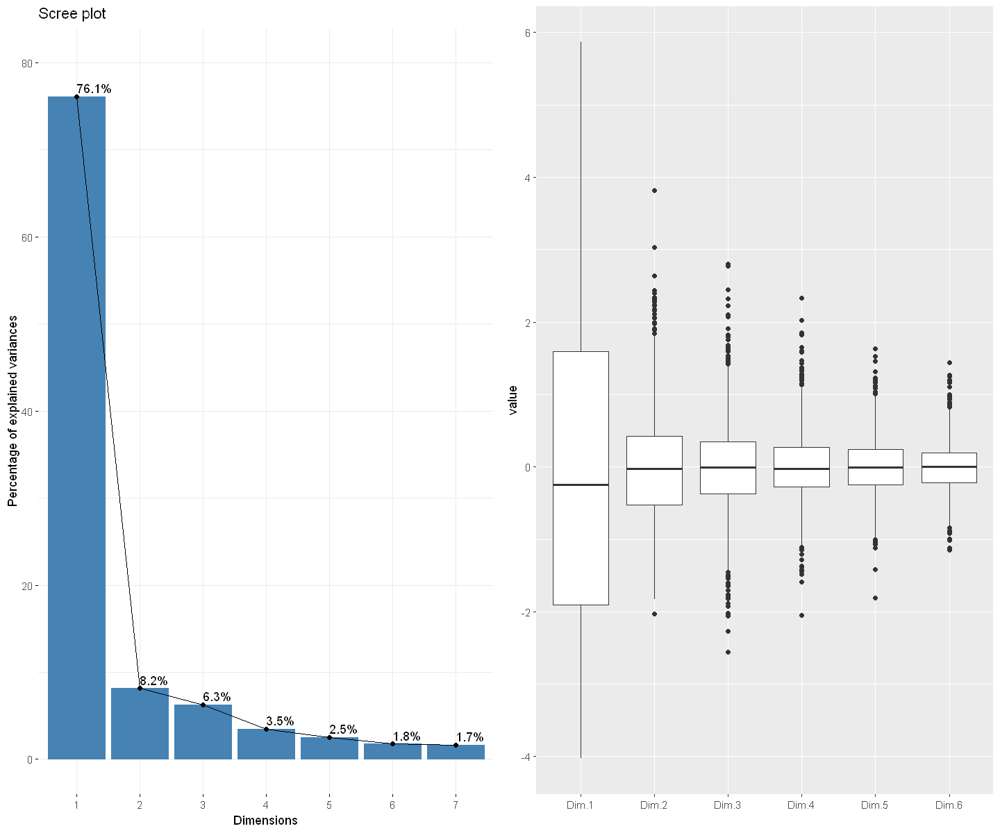

In [13]:
# ACP réduite
acp2 <- PCA(df2, scale.unit = TRUE,
           graph = FALSE, quali.sup = c(8,9,10), ncp = 6)
# Décroissance des valeurs propres
library(factoextra)
g1<-fviz_eig(acp2, addlabels = TRUE, ylim = c(0, 80))
library(reshape2)
g2<-ggplot(melt(acp2$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

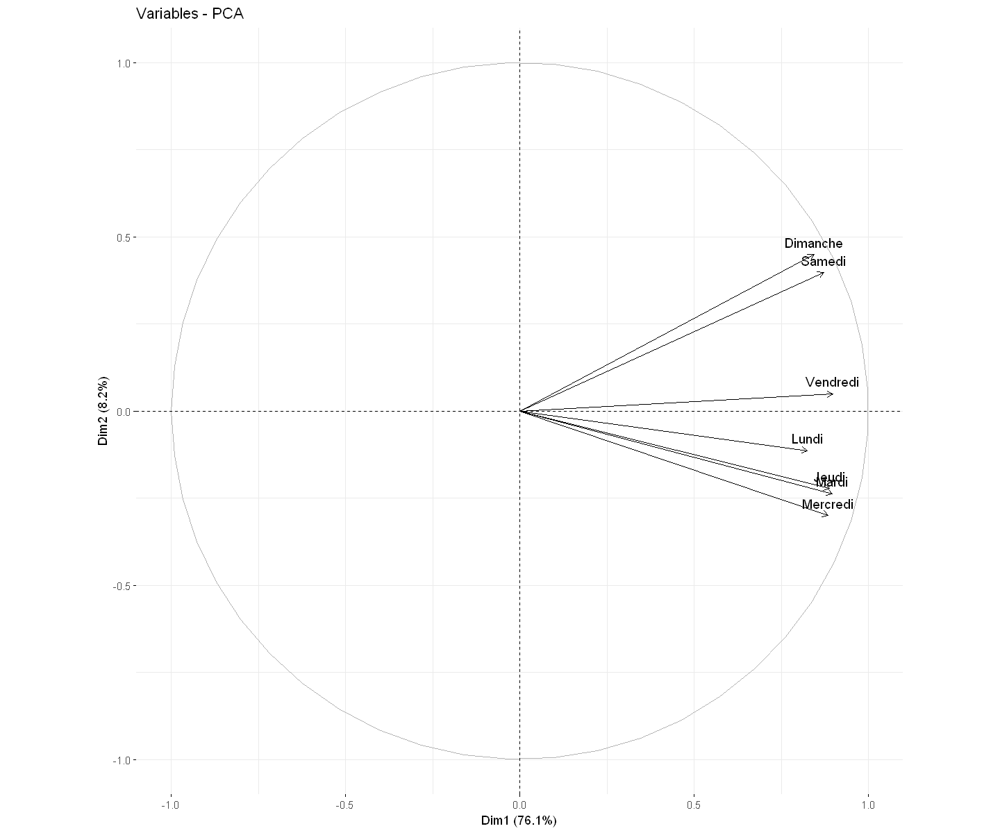

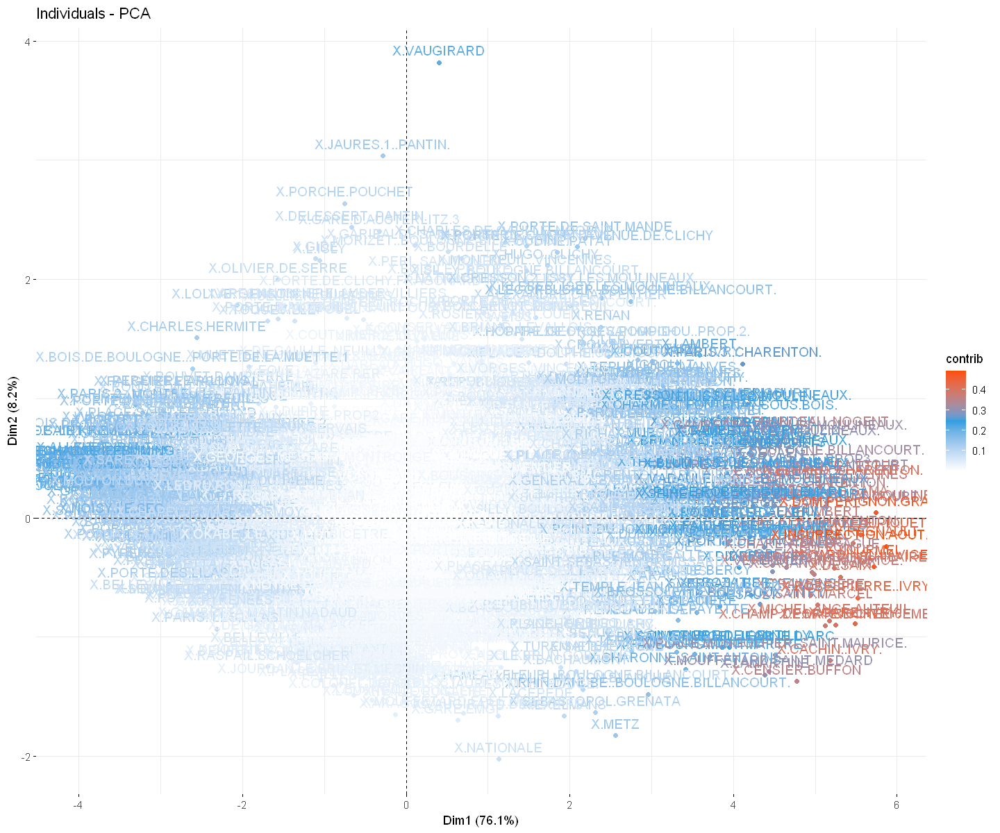

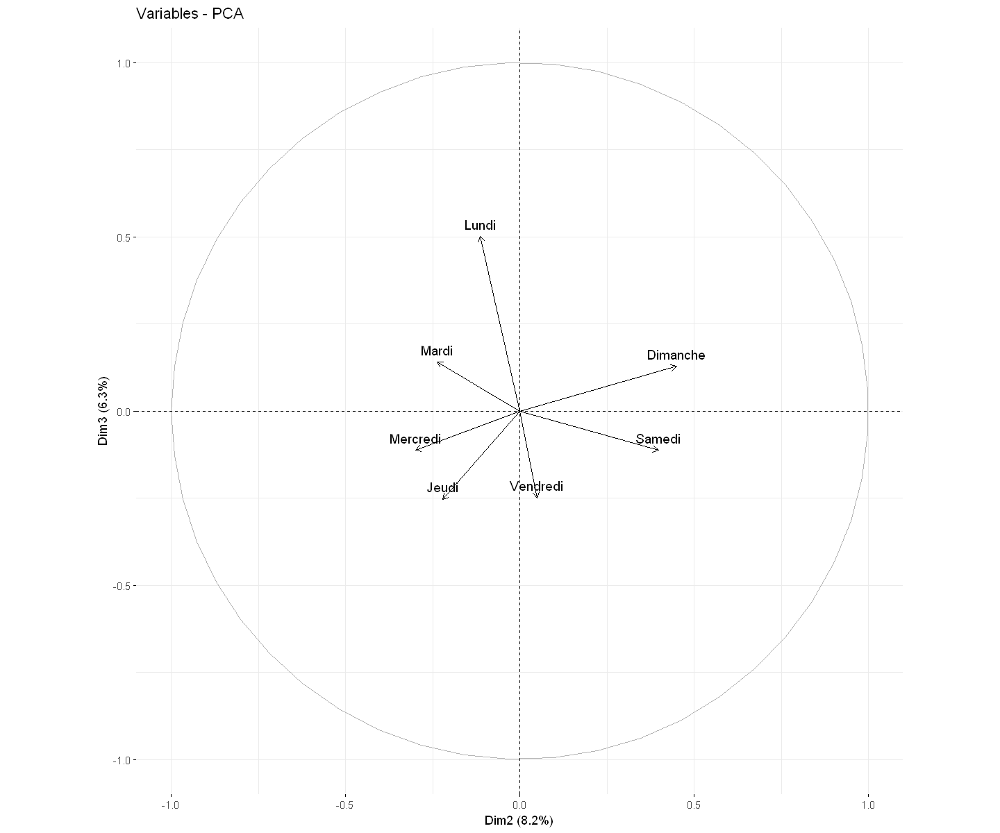

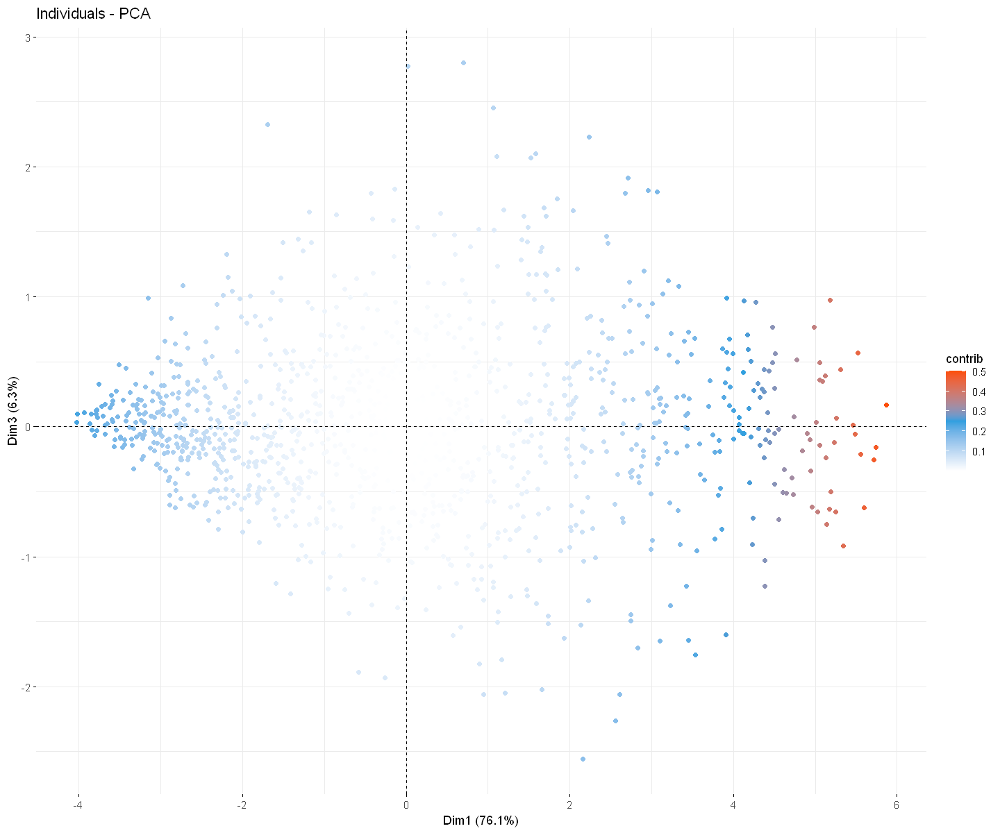

In [14]:
fviz_pca_var(acp2)
fviz_pca_ind(acp2,col.ind="contrib",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ))
fviz_pca_var(acp2,axes=c(2,3))
fviz_pca_ind(acp2,col.ind="contrib",label="none",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ),axes=c(1,3))

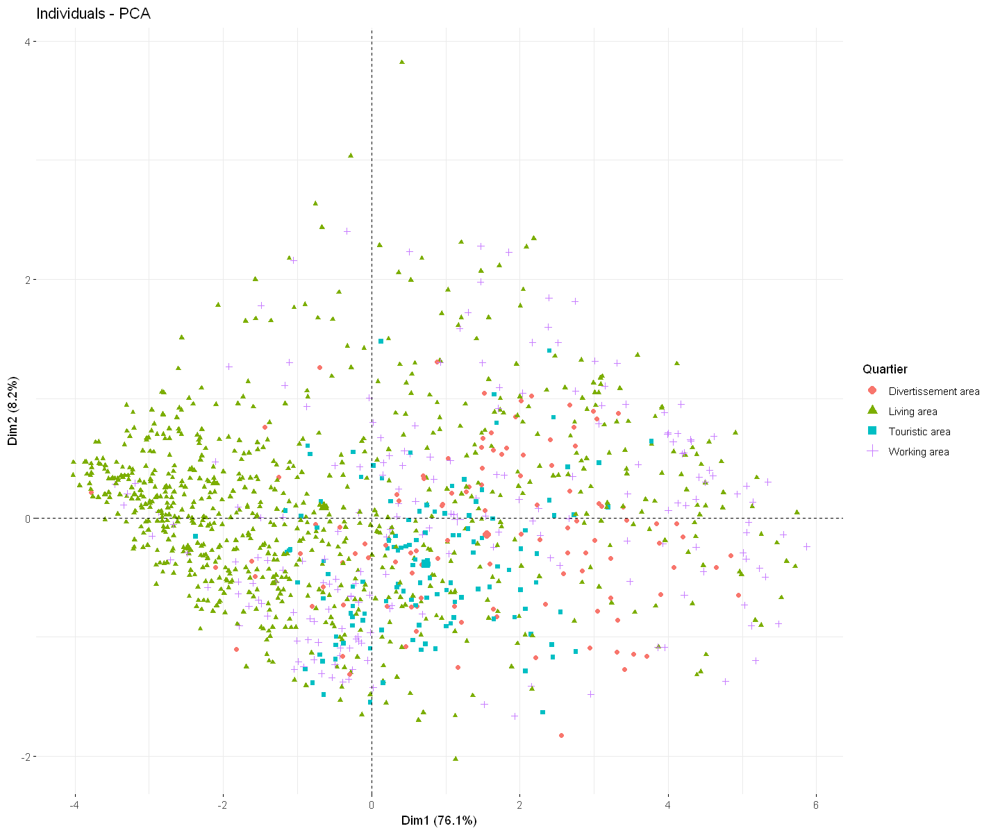

In [15]:
fviz_pca_ind(acp2, label="none", habillage=10)

In [89]:
### C1 : proportionnelle au taux de chargement hebdomadaire : le poids des jours est le même sur le chargement hebdomadaire : effet
### d'équilibrage entre les stations pleines en semaine et celles pleines le week_end.
### C2 : différence semaine/week-end : (vendredi)/samedi/dimanche vs lundi/mardi/mercredi/jeudi/(vendredi)
### difficile de dégager lien entre week-end/semaine et position
### néanmoins, pleines en semaine : centre ville, pleines le week-end : périphérie

In [16]:
library(cluster)

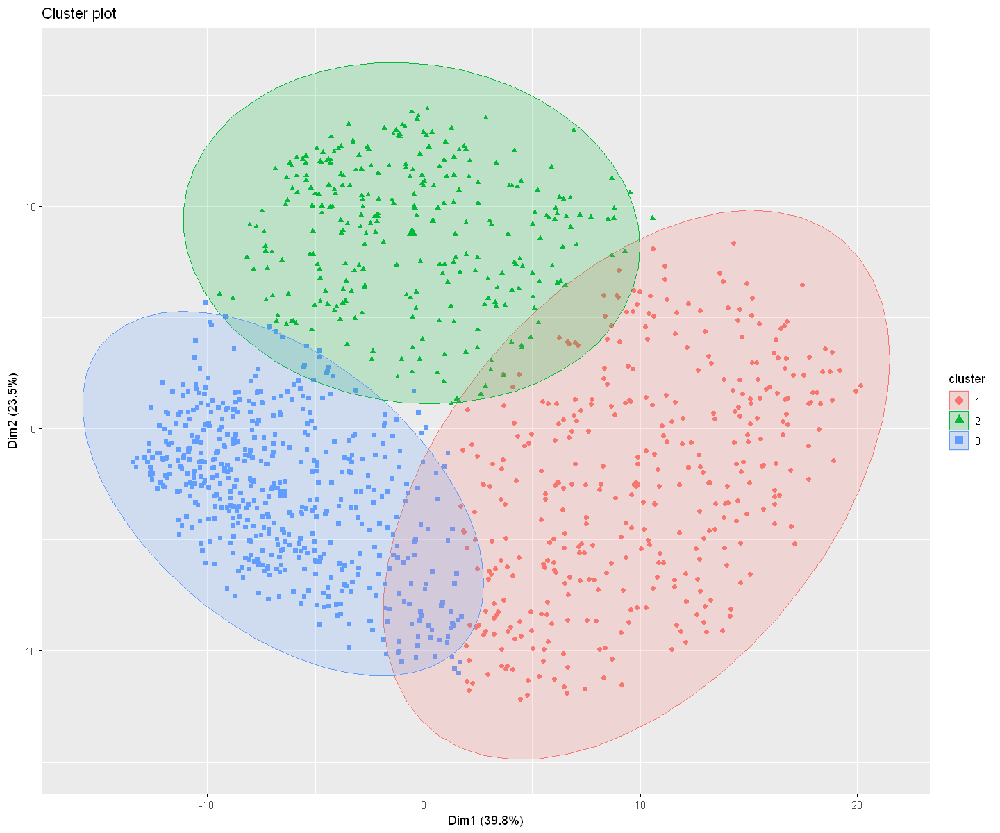

In [17]:
loading2 = loading
loading2[,-c(169,170)] = scale(loading[,-c(169,170)], scale=T, center=T)
reskmeans = kmeans(loading2[,-c(169,170)], centers=3) 

fviz_cluster(reskmeans, data=loading2[,-c(169,170)], ellipse.type="norm", labelsize=8, geom=c("point"))

                     
                        1   2   3
  Divertissement area  76  13  21
  Living area         206  70 485
  Touristic area       19 101   5
  Working area         69 100  24


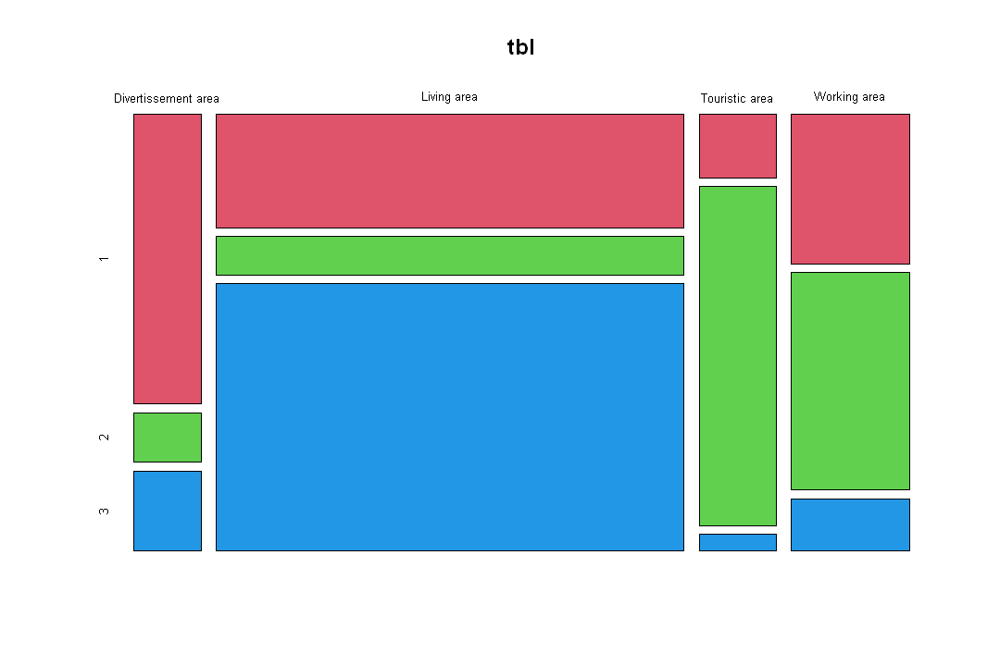

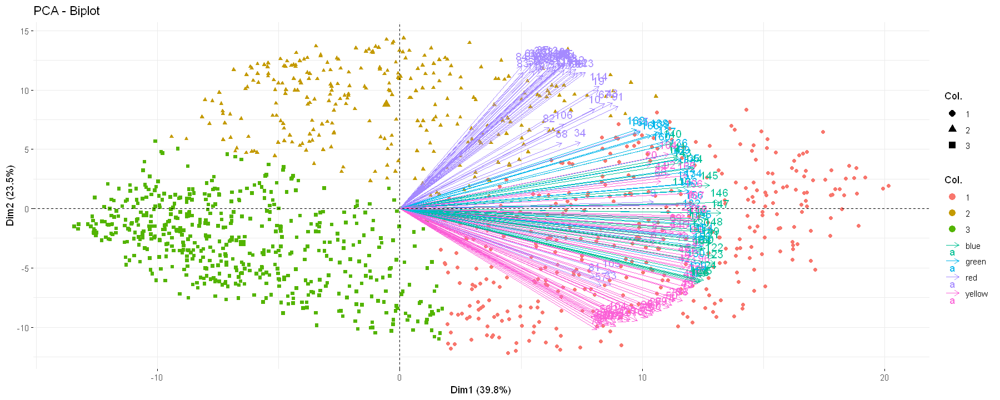

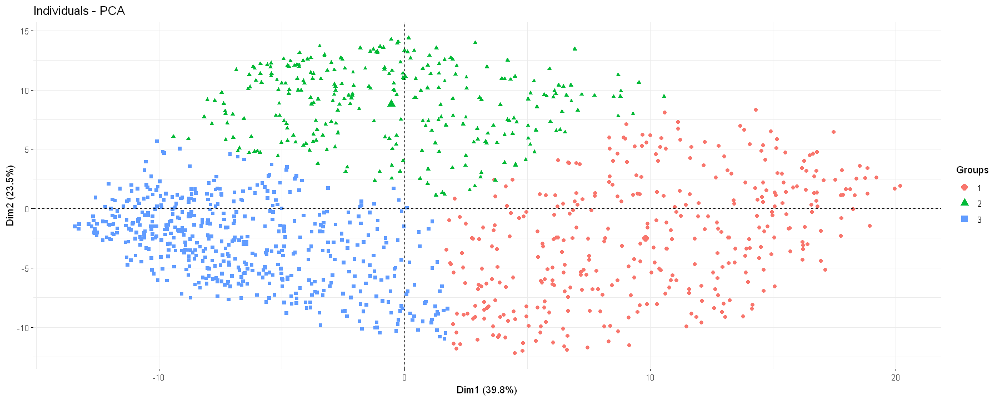

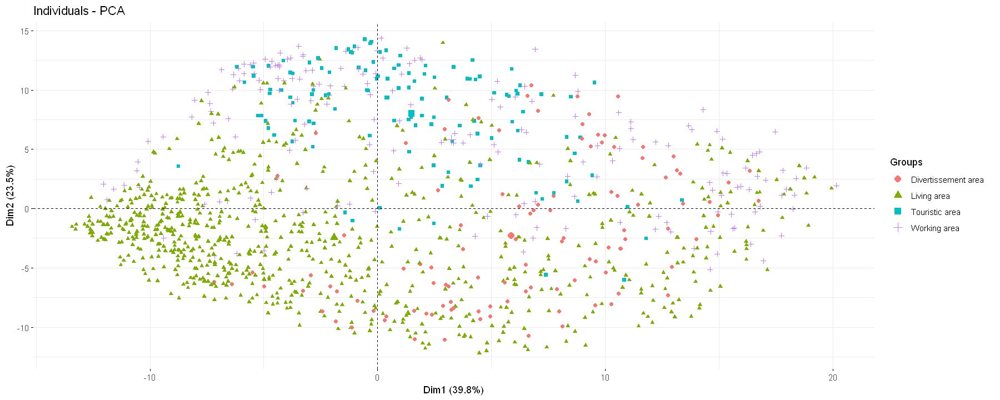

In [18]:
tbl = table(loading2$Quartier, reskmeans$cluster)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:5))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)


fviz_pca(acp, col = col.var, axes=c(1,2), geom = c("point"), col.ind=as.factor(reskmeans$cluster))
fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=as.factor(reskmeans$cluster))
fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=loading2$Quartier)

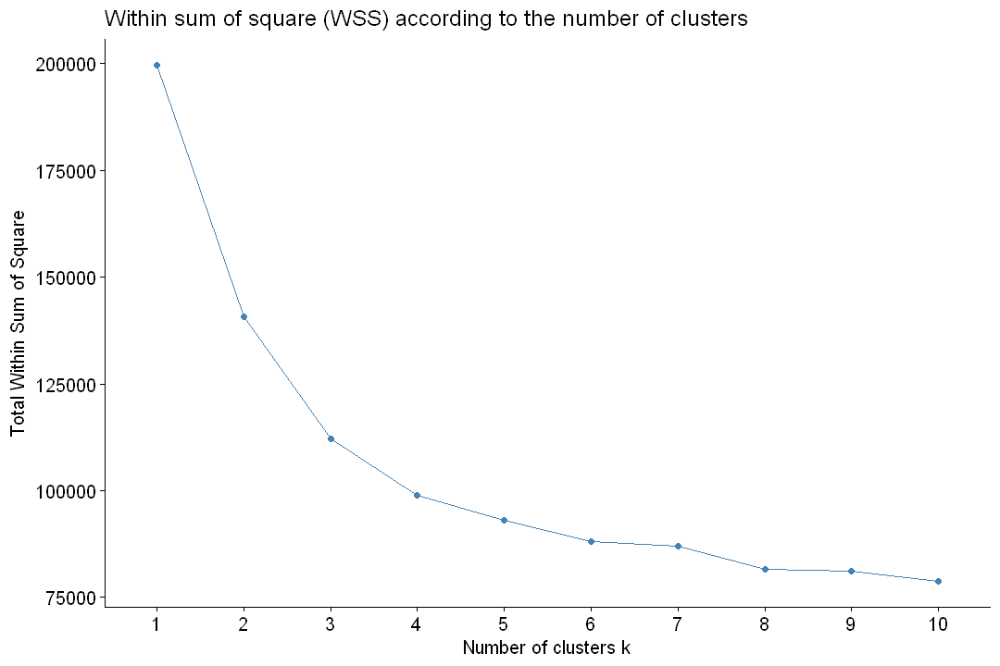

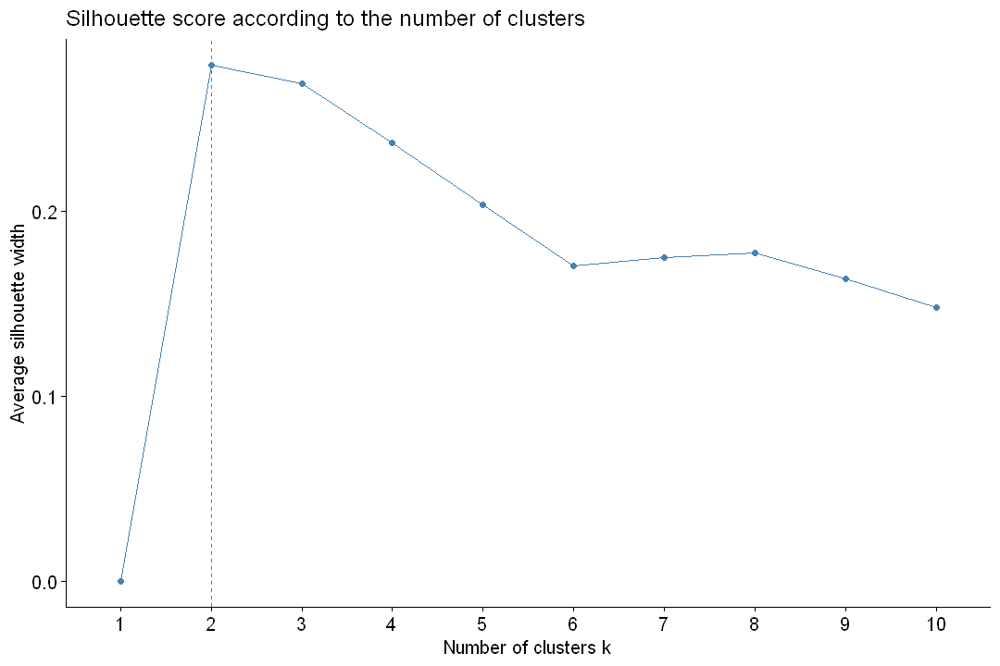

In [19]:

options(repr.plot.width = 9, repr.plot.height = 6)

fviz_nbclust(loading2[,-c(169,170)], FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(loading2[,-c(169,170)], FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")

In [28]:
cluster_palette <- colorFactor(viridis(100, option="D"), domain = unique(reskmeans$cluster))  # Utiliser la palette viridis avec 10 couleurs

leaflet(velib$position) %>% 
  addTiles(urlTemplate = "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png", 
           attribution = 'Map tiles by Carto, under CC BY 3.0. Data by OpenStreetMap, under ODbL.') %>% 
  addCircleMarkers(radius = 3,
                   color = ~cluster_palette(reskmeans$cluster),
                   stroke = FALSE, 
                   fillOpacity = 0.9) %>%
addLegend(position = "bottomright", 
            pal = cluster_palette, 
            values = ~reskmeans$cluster,
            title = "Cluster",
            opacity = 1)

HTML widgets cannot be represented in plain text (need html)

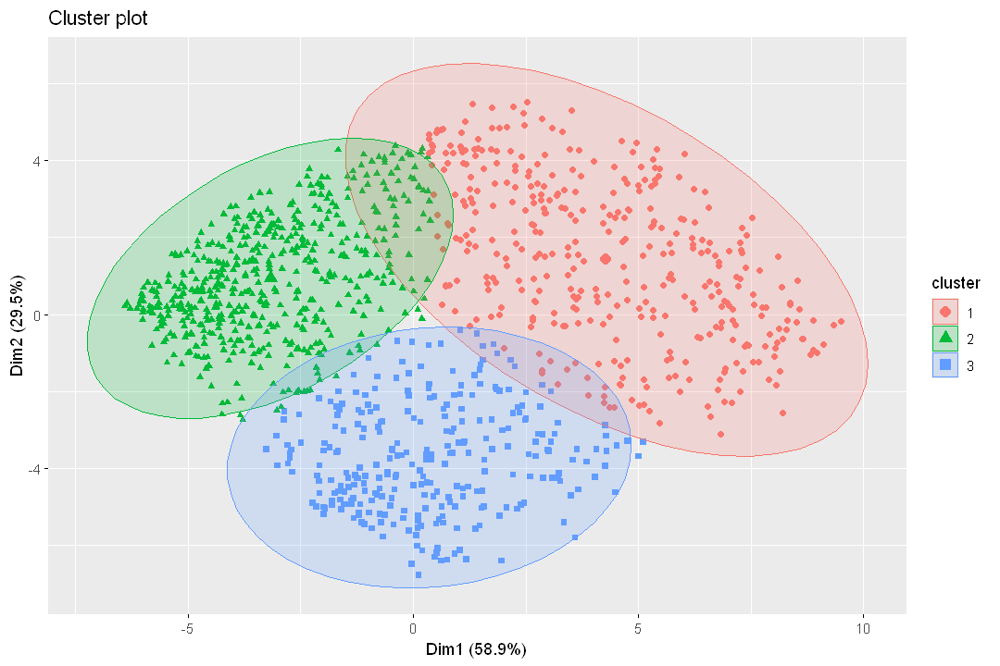

In [29]:
df12 = df1
df12[,-c(25,26,27)] = scale(df1[,-c(25,26,27)], scale=T, center=T)
reskmeans = kmeans(df12[,-c(25,26,27)], centers=3) 

fviz_cluster(reskmeans, data=df12[,-c(25,26,27)], ellipse.type="norm", labelsize=8, geom=c("point"))

                     
                        1   2   3
  Divertissement area  78  19  13
  Living area         210 487  64
  Touristic area       18   5 102
  Working area         68  25 100


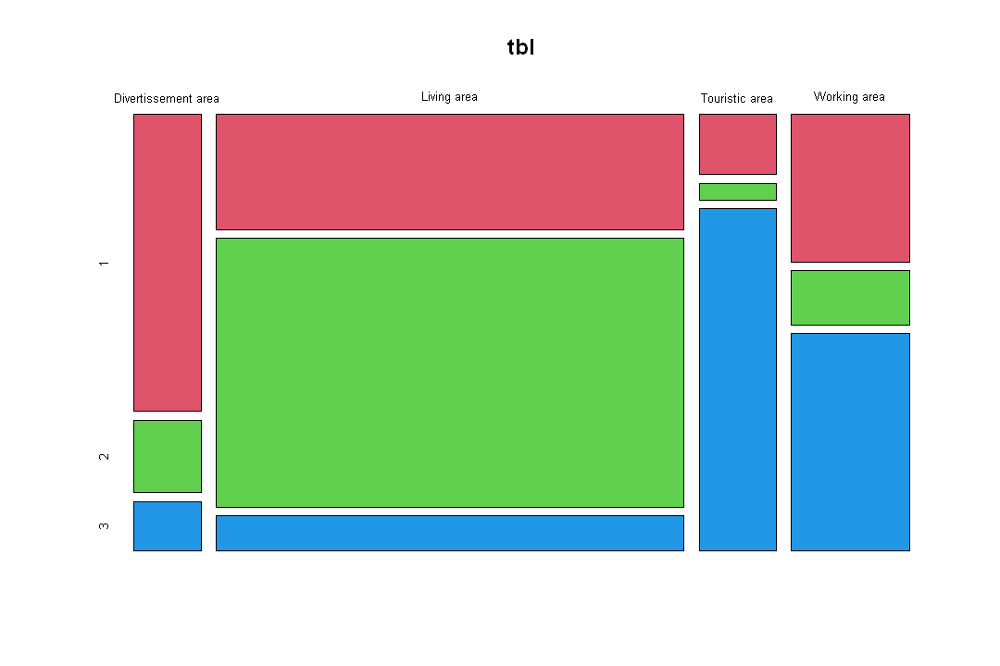

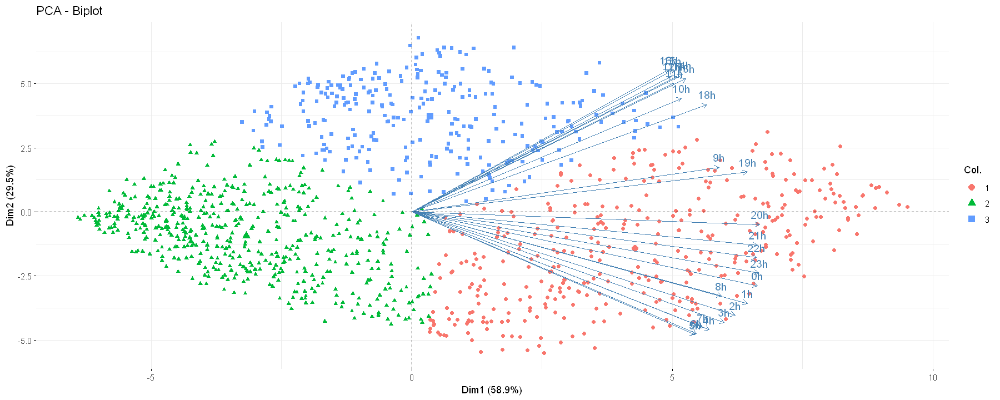

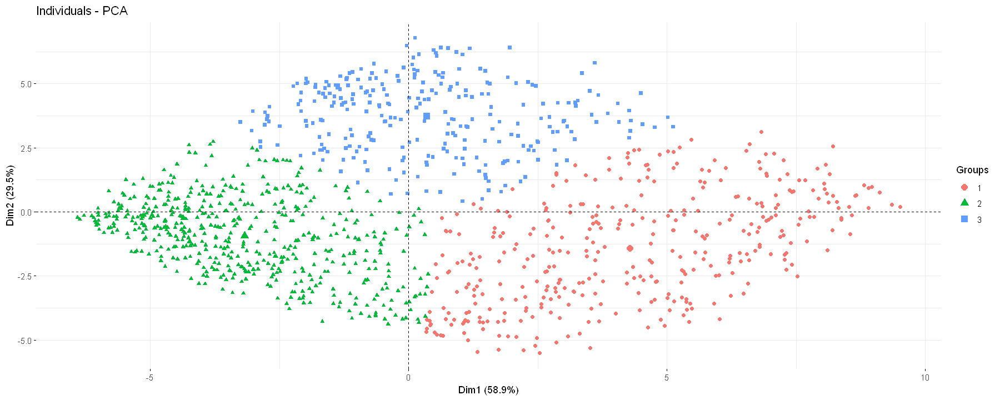

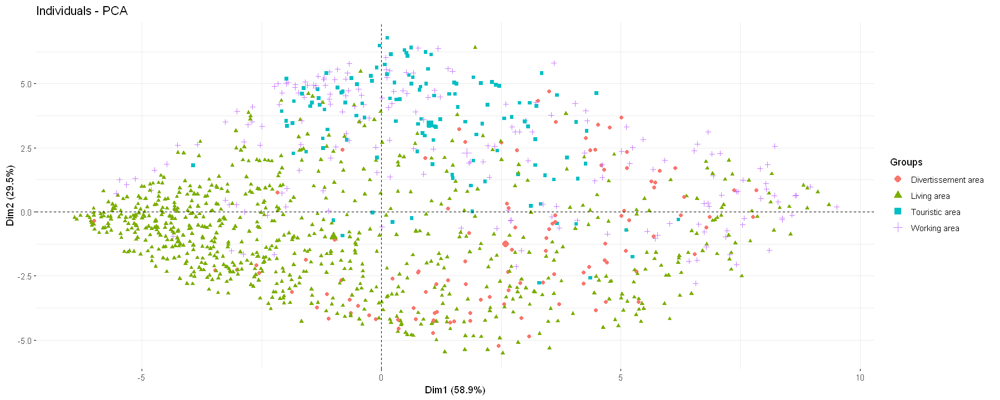

In [30]:
tbl = table(df12$Quartier, reskmeans$cluster)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:4))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)


fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(reskmeans$cluster))
fviz_pca_ind(acp1, axes=c(1,2), geom=c("point"), habillage=as.factor(reskmeans$cluster))
fviz_pca_ind(acp1, axes=c(1,2), geom=c("point"), habillage=df12$Quartier)

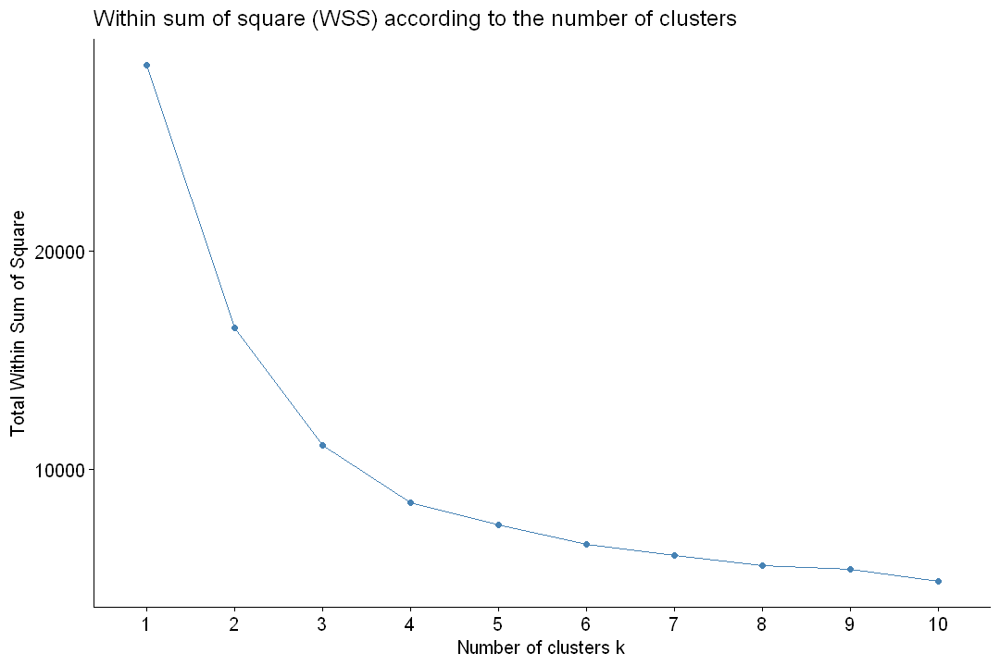

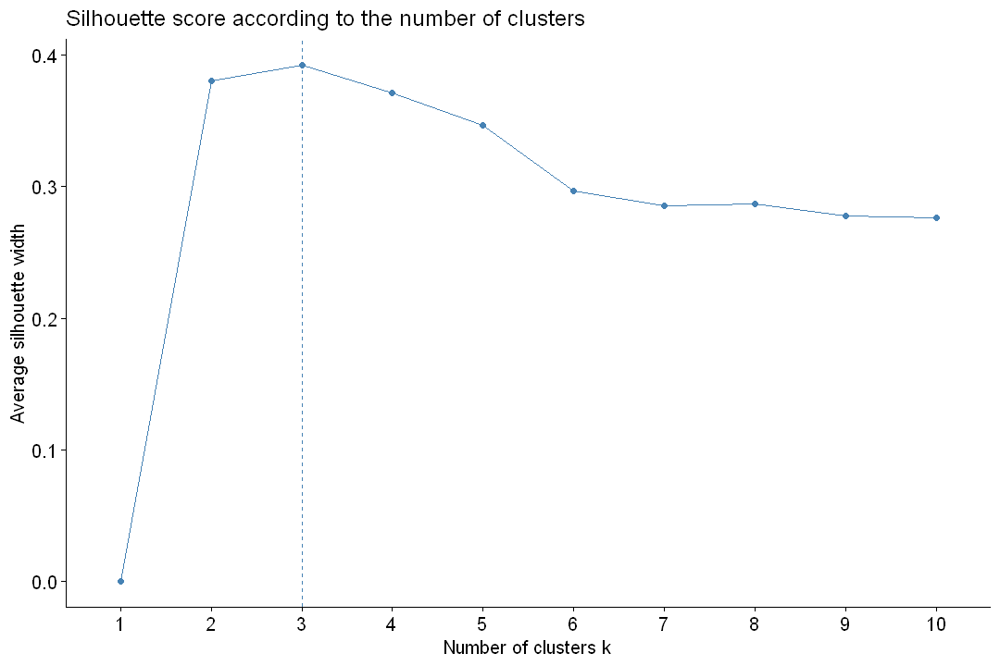

In [31]:

options(repr.plot.width = 9, repr.plot.height = 6)

fviz_nbclust(df12[,-c(25,26,27)], FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(df12[,-c(25,26,27)], FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")

In [43]:
cluster_palette <- colorFactor(viridis(n=3,option="D"), domain = unique(reskmeans$cluster))
leaflet(velib$position) %>% addTiles() %>%
addCircleMarkers(radius=3,
color =  ~cluster_palette(reskmeans$cluster),
stroke = FALSE, fillOpacity = 0.9) %>%
addLegend(position = "bottomright",  # Position de la légende
            pal = cluster_palette,  # Palette de couleurs
            values = ~reskmeans$cluster,  # Valeurs à afficher dans la légende
            title = "Clusters")  # Titre de la légende

### on distingue une tendance en fonction des heures

HTML widgets cannot be represented in plain text (need html)

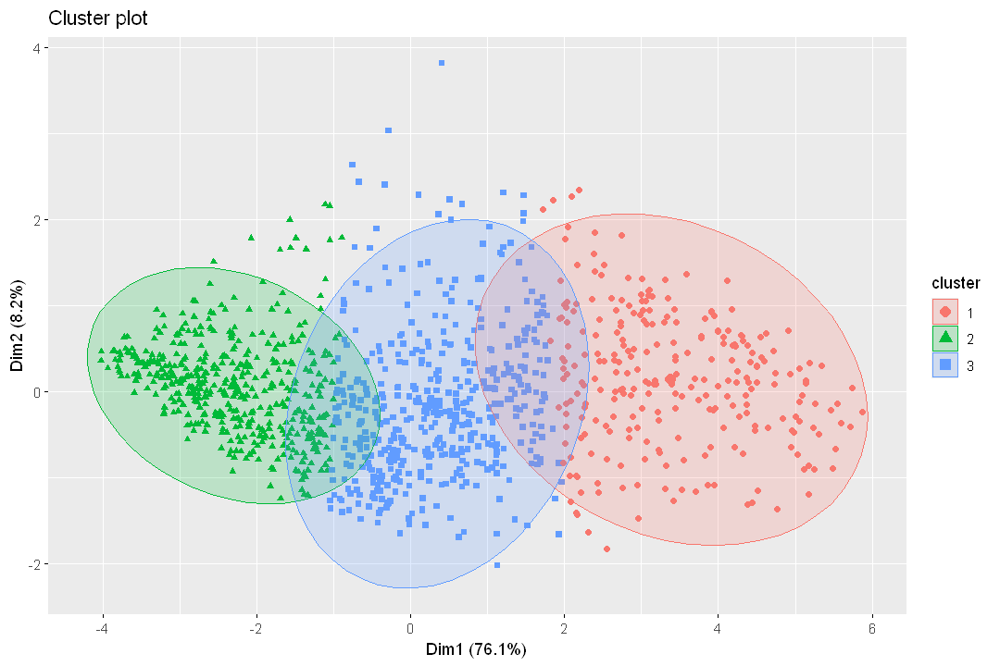

In [44]:
df22 = df2
df22[,-c(8,9,10)] = scale(df2[,-c(8,9,10)], scale=T, center=T)
reskmeans = kmeans(df22[,-c(8,9,10)], centers=3) 
fviz_cluster(reskmeans, data=df22[,-c(8,9,10)], ellipse.type="norm", labelsize=8, geom=c("point"))

                     
                        1   2   3
  Divertissement area  50   7  53
  Living area         120 412 229
  Touristic area       22   5  98
  Working area         70  33  90


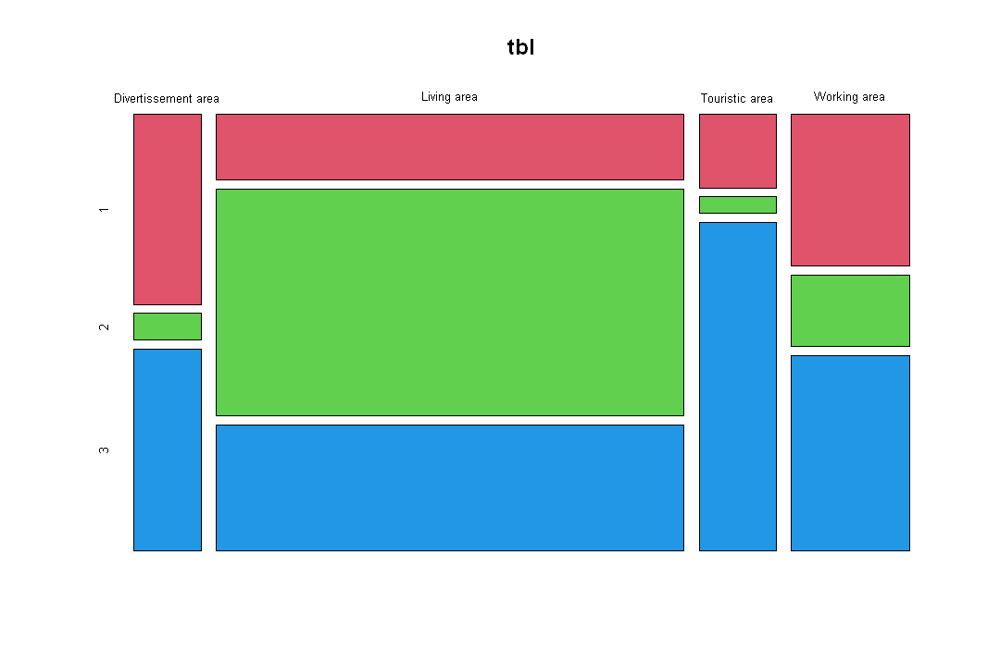

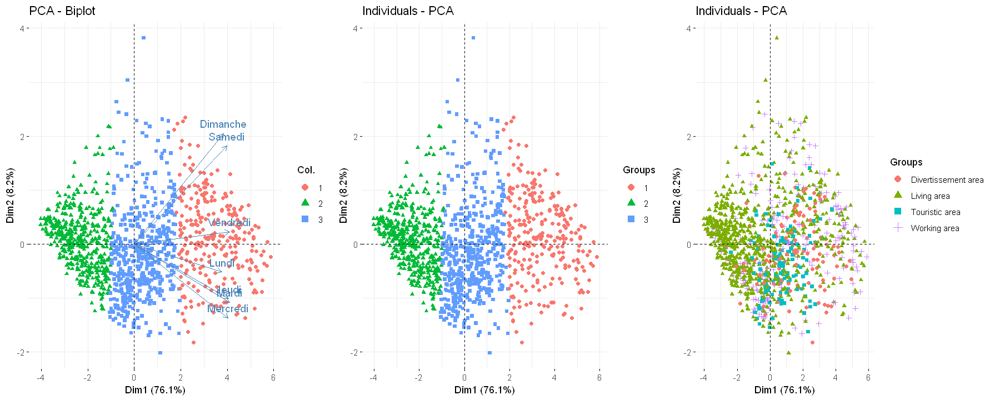

In [47]:
tbl = table(df22$Quartier, reskmeans$cluster)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:4))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp2, axes=c(1,2), geom = c("point"), col.ind=as.factor(reskmeans$cluster)),
    fviz_pca_ind(acp2, axes=c(1,2), geom=c("point"), habillage=as.factor(reskmeans$cluster)),
    fviz_pca_ind(acp2, axes=c(1,2), geom=c("point"), habillage=df22$Quartier),
    ncol=3
)

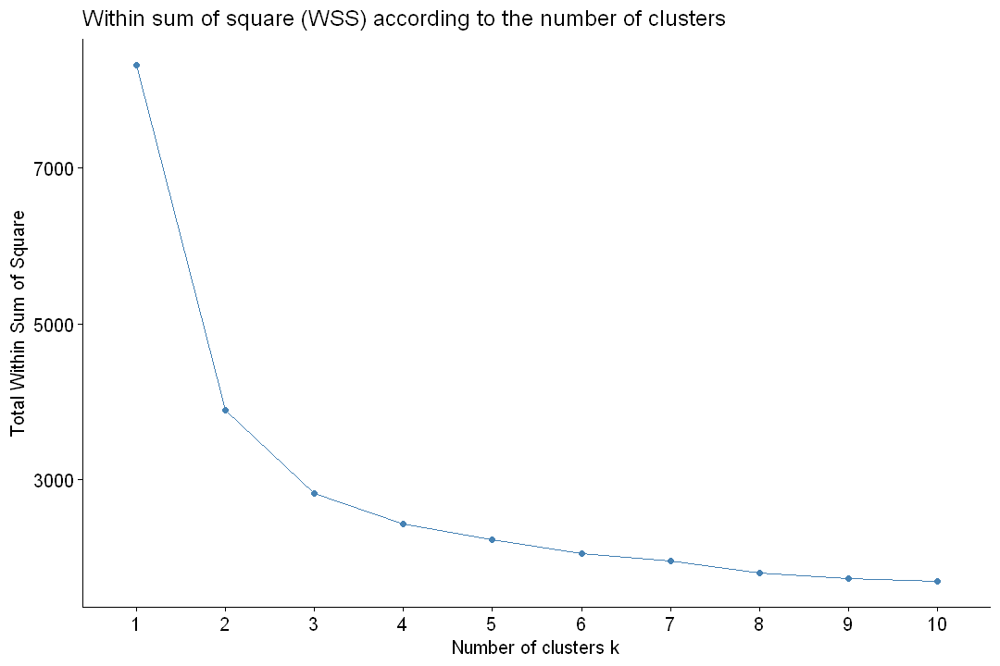

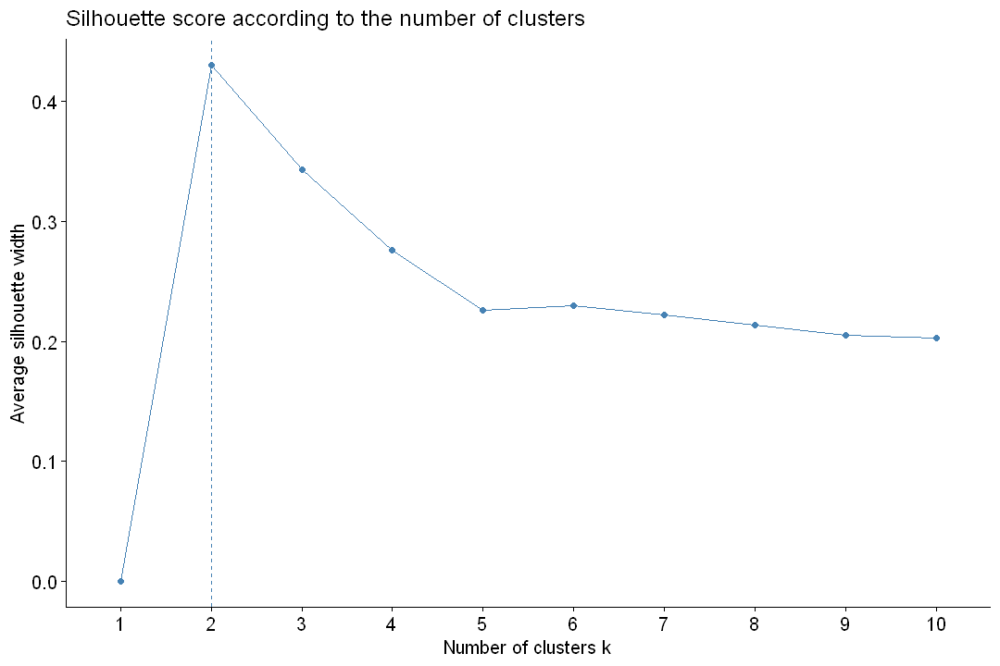

In [48]:
options(repr.plot.width = 9, repr.plot.height = 6)

fviz_nbclust(df22[,-c(8,9,10)], FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(df22[,-c(8,9,10)], FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")

In [49]:
cluster_palette <- colorFactor(viridis(n=3,option="D"), domain = unique(reskmeans$cluster))
leaflet(velib$position) %>% addTiles() %>%
addCircleMarkers(radius=3,
color =  ~cluster_palette(reskmeans$cluster),
stroke = FALSE, fillOpacity = 0.9) %>%
addLegend(position = "bottomright",  # Position de la légende
            pal = cluster_palette,  # Palette de couleurs
            values = ~reskmeans$cluster,  # Valeurs à afficher dans la légende
            title = "Clusters")  # Titre de la légende


### on ne distingue pas de tendance en fonction des jours, mais donne comme le premier kmeans, les stations souvent chargées, moyennement chargées et
### faiblement chargées

HTML widgets cannot be represented in plain text (need html)

In [17]:
install.packages("mclust")
library(mclust)

Installation du package dans 'C:/Users/pauld/AppData/Local/R/win-library/4.3'
(car 'lib' n'est pas spécifié)



le package 'mclust' a été décompressé et les sommes MD5 ont été vérifiées avec succés


Warning message:
"impossible de supprimer l'installation précédente du package 'mclust'"
Warning message in file.copy(savedcopy, lib, recursive = TRUE):
"problème lors de la copie de C:\Users\pauld\AppData\Local\R\win-library\4.3\00LOCK\mclust\libs\x64\mclust.dll vers C:\Users\pauld\AppData\Local\R\win-library\4.3\mclust\libs\x64\mclust.dll: Permission denied"
Warning message:
"'mclust' restauré"



Les packages binaires téléchargés sont dans
	C:\Users\pauld\AppData\Local\Temp\RtmpcBDmjg\downloaded_packages


Package 'mclust' version 6.1
Type 'citation("mclust")' for citing this R package in publications.


Attachement du package : 'mclust'


L'objet suivant est masqué depuis 'package:purrr':

    map




Best BIC values:
            EEE,2     EEE,3       EEE,4
BIC      250227.1 249842.64 249396.8671
BIC diff      0.0   -384.45   -830.2187

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust EEE (ellipsoidal, equal volume, shape and orientation) model with 2
components: 

 log-likelihood    n    df      BIC      ICL
       176566.7 1189 14533 250227.1 250202.4

Clustering table:
  1   2 
636 553 

Warning message:
"`gather_()` was deprecated in tidyr 1.2.0.
ℹ Please use `gather()` instead.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>."


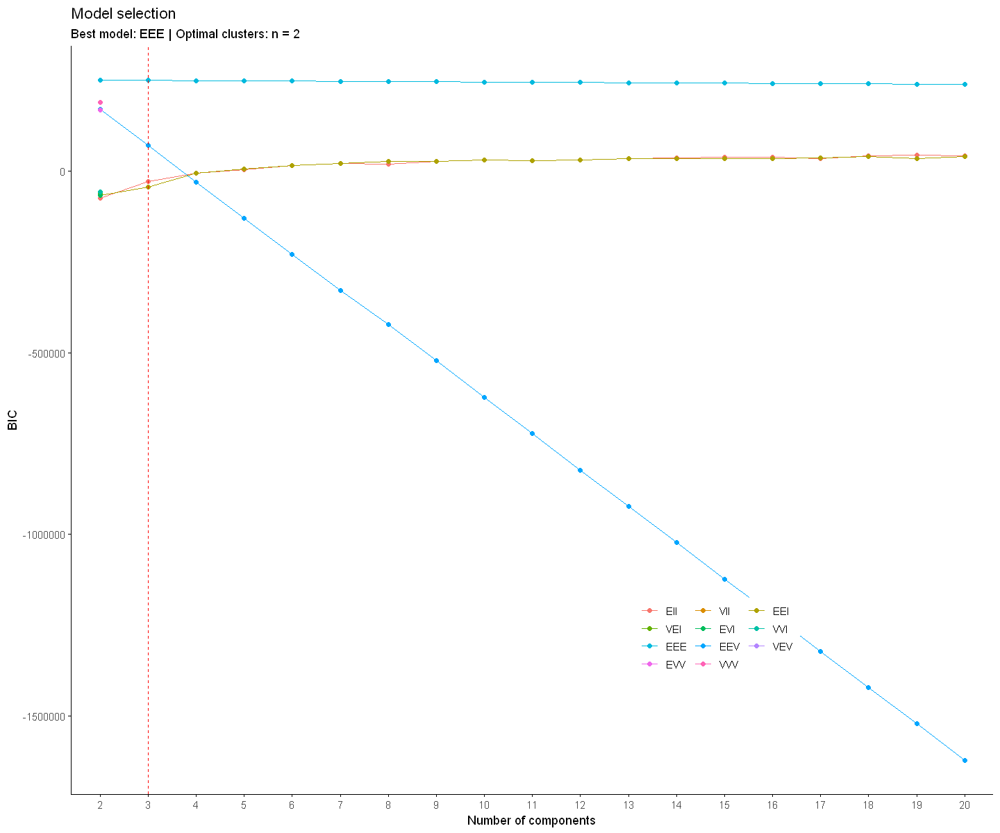

In [21]:
resBICall = mclustBIC(loading[,-c(169,170)], G=2:20)
summary(resBICall)

# --- #

resBICall = Mclust(loading[,-c(169,170)], G=2:20)
summary(resBICall)

:
fviz_mclust(resBICall, what="BIC")

ERROR while rich displaying an object: Error in `geom_boxplot()`:
! Problem while setting up geom aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `check_aesthetics()`:
! Aesthetics must be either length 1 or the same as the data (2).
✖ Fix the following mappings: `colour` and `fill`.

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](ob

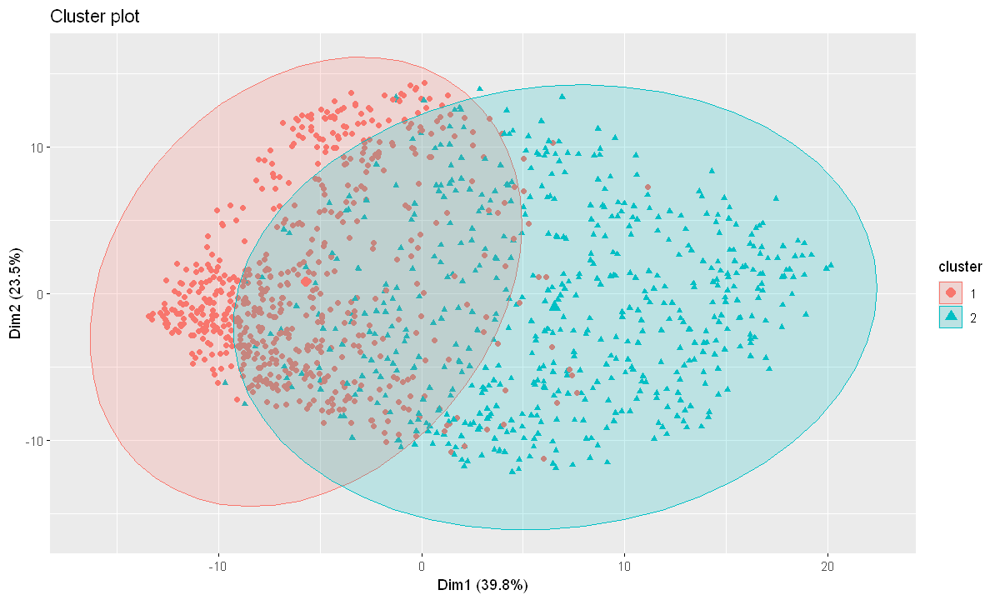

In [25]:
options(repr.plot.width = 10, repr.plot.height = 6)

resBIC = Mclust(loading[,-c(169,170)], G=2, modelNames = "EEE")
fviz_cluster(resBIC, data=loading[,-c(169,170)], ellipse.type="norm", geom="point")

# --- #

aux = data.frame(
    label = paste("Cluster", resBIC$classification, sep=""), 
    proba = apply(resBIC$z, 1, max))

ggplot(aux, aes(x=label, y=proba)) + 
    geom_boxplot(colour=1:2, fill=1:2, alpha=.4)

                     
                        1   2
  Divertissement area   9 101
  Living area         469 292
  Touristic area       60  65
  Working area         98  95


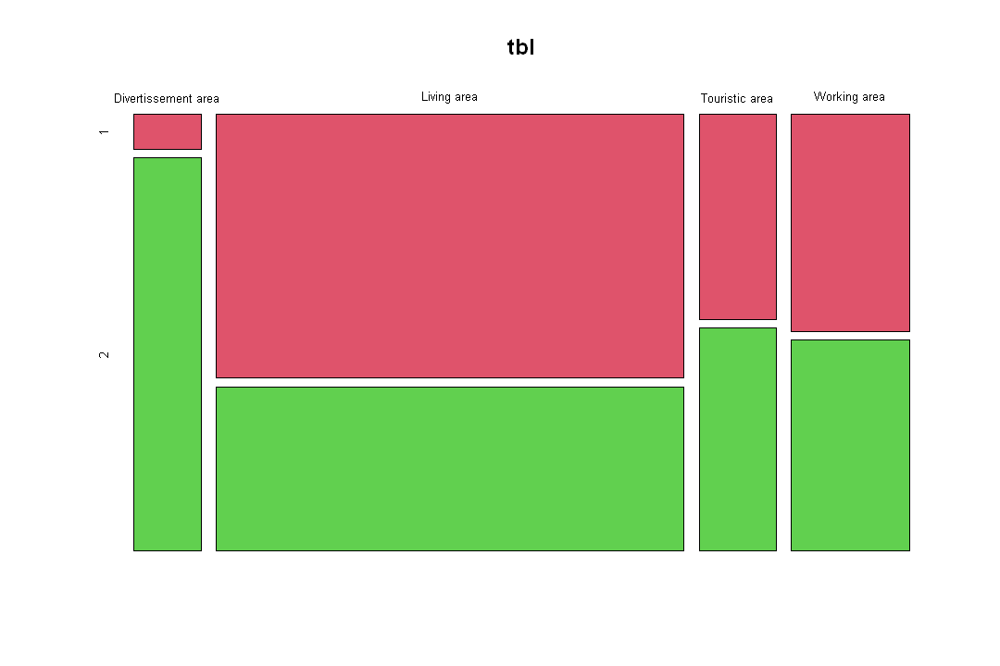

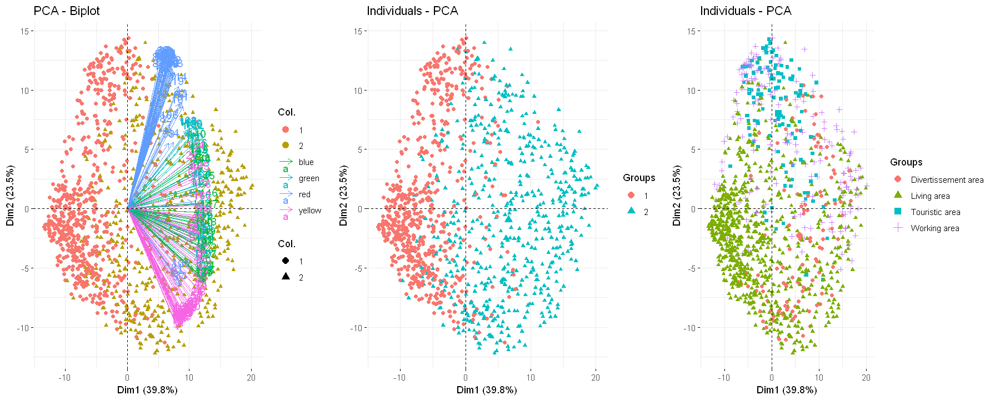

In [26]:
tbl = table(loading$Quartier, resBIC$classification)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:5))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp, col.var = col.var, axes=c(1,2), geom = c("point"), col.ind=as.factor(resBIC$classification)),
    fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=as.factor(resBIC$classification)),
    fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=loading$Quartier),
    ncol=3
)

In [ ]:
cluster_palette <- colorFactor(viridis(n=2,option="D"), domain = unique(resBIC$classification))
leaflet(velib$position) %>% addTiles() %>%
addCircleMarkers(radius=3,
color =  ~cluster_palette(resBIC$classification),
stroke = FALSE, fillOpacity = 0.9) %>%
addLegend(position = "bottomright",  # Position de la légende
            pal = cluster_palette,  # Palette de couleurs
            values = ~resBIC$classification,  # Valeurs à afficher dans la légende
            title = "Clusters")  # Titre de la légende

Best BIC values:
            VVE,8       VVE,9       VVE,6
BIC      84605.56 84575.92732 84544.76628
BIC diff     0.00   -29.62948   -60.79053

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVE (ellipsoidal, equal orientation) model with 8 components: 

 log-likelihood    n  df      BIC      ICL
       44664.25 1189 667 84605.56 84397.01

Clustering table:
  1   2   3   4   5   6   7   8 
162 229 326  65  85 131  90 101 

Warning message:
"`gather_()` was deprecated in tidyr 1.2.0.
ℹ Please use `gather()` instead.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>."


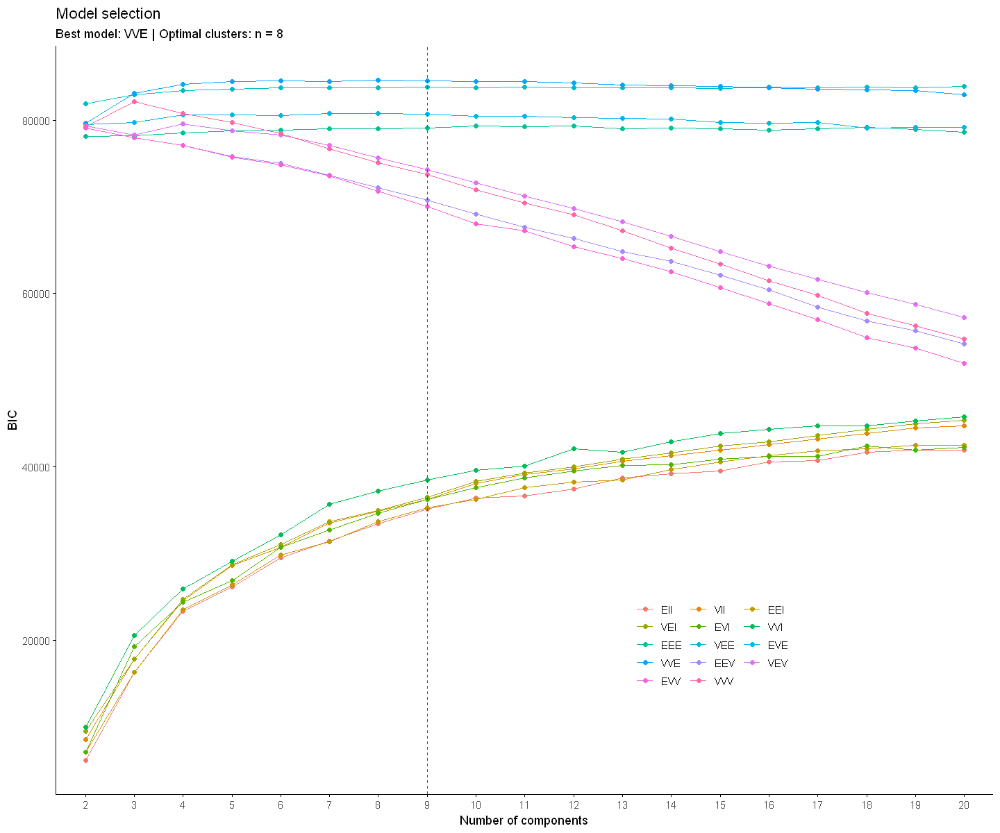

In [18]:
resBICall = mclustBIC(df1[,-c(25,26,27)], G=2:20)
summary(resBICall)

# --- #

resBICall = Mclust(df1[,-c(25,26,27)], G=2:20)
summary(resBICall)


fviz_mclust(resBICall, what="BIC")

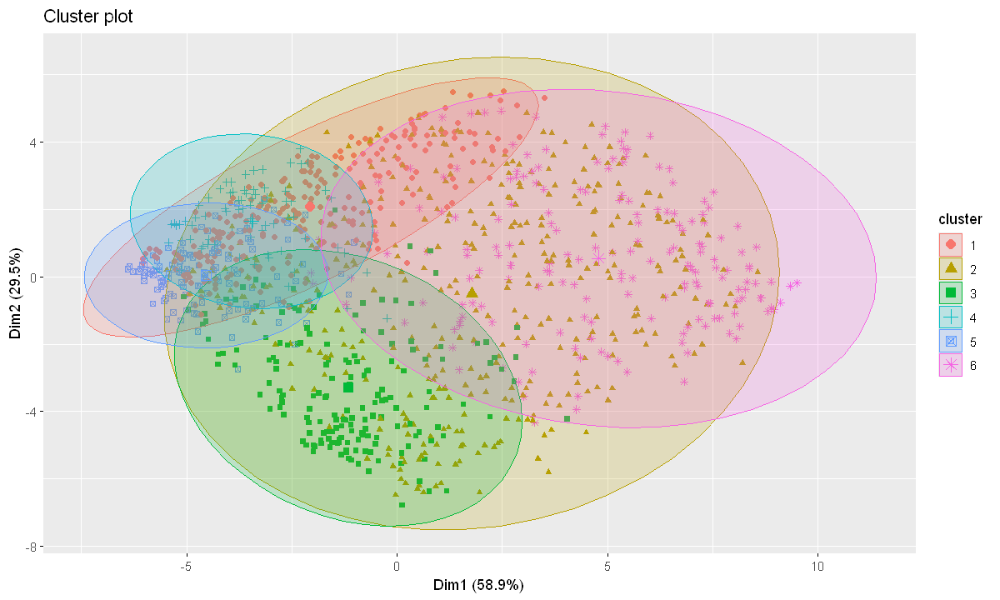

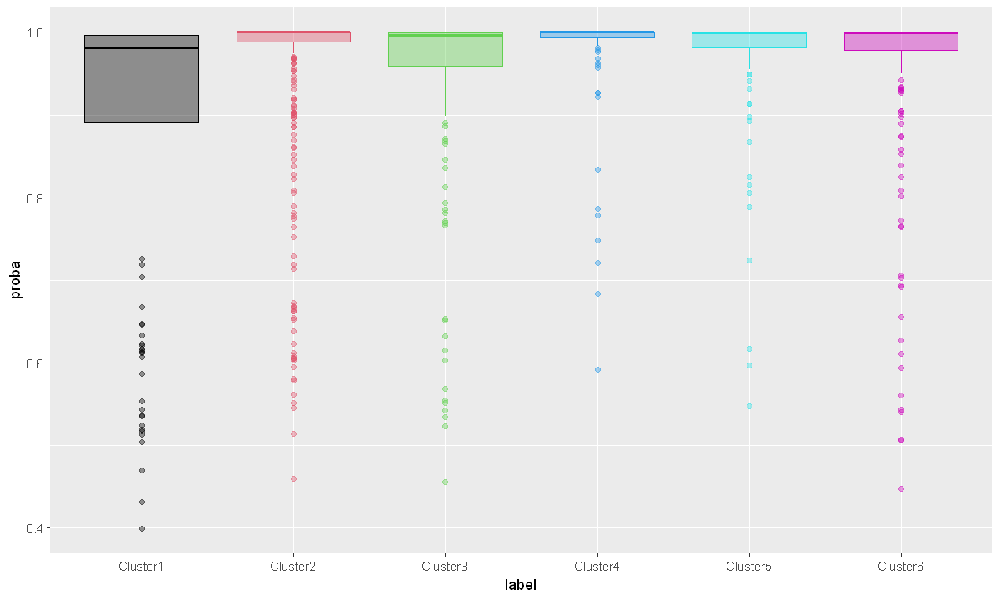

In [47]:
options(repr.plot.width = 10, repr.plot.height = 6)

resBIC = Mclust(df1[,-c(25,26,27)], G=6, modelNames = "VVE")
fviz_cluster(resBIC, data=df1[,-c(25,26,27)], ellipse.type="norm", geom="point")

# --- #

aux = data.frame(
    label = paste("Cluster", resBIC$classification, sep=""), 
    proba = apply(resBIC$z, 1, max))

ggplot(aux, aes(x=label, y=proba)) + 
    geom_boxplot(colour=1:6, fill=1:6, alpha=.4)

                     
                        1   2   3   4   5   6
  Divertissement area  25  77   1   0   1   6
  Living area         223 161  70  77 114 116
  Touristic area        1  86  32   0   1   5
  Working area          5  55  69   2   6  56


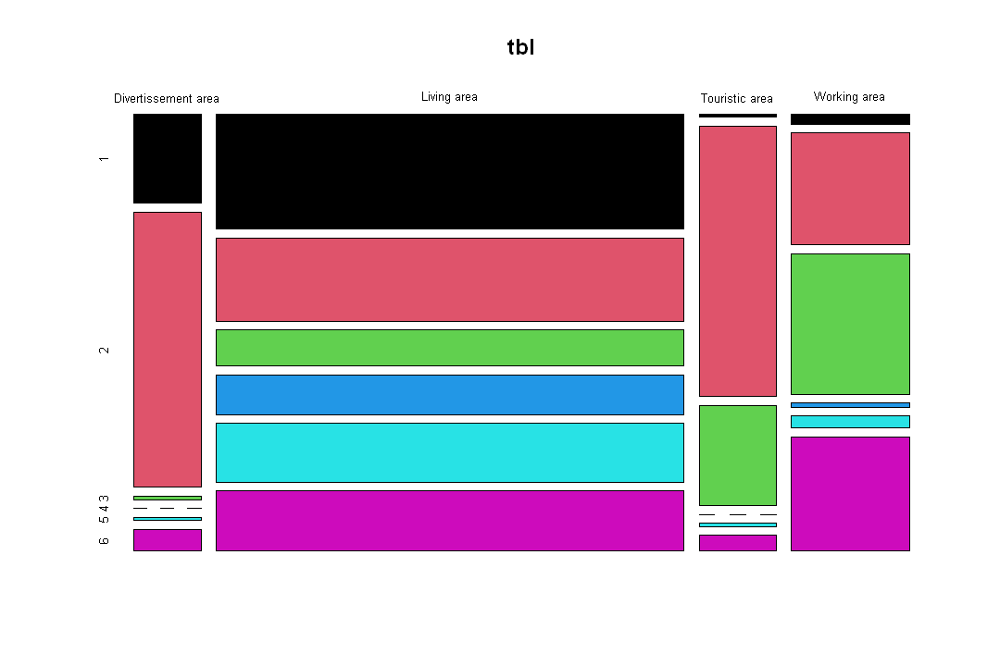

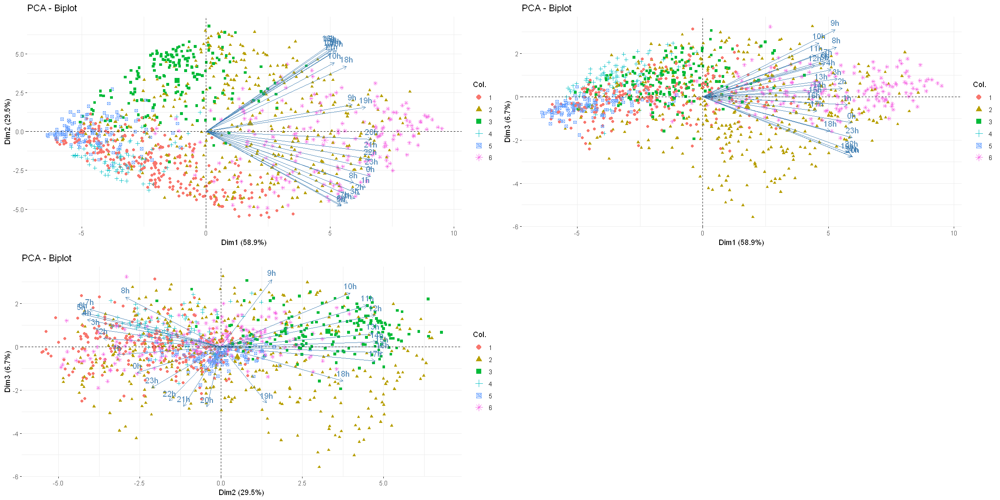

In [55]:
tbl = table(df1$Quartier, resBIC$classification)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(1:7))

# --- #
options(repr.plot.width = 20, repr.plot.height = 10)

grid.arrange(
    fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(resBIC$classification)),
    fviz_pca(acp1, axes=c(1,3), geom=c("point"), col.ind=as.factor(resBIC$classification)),
    fviz_pca(acp1, axes=c(2,3), geom=c("point"), col.ind=as.factor(resBIC$classification)),
    ncol=3
)

In [50]:
cluster_palette <- colorFactor(c("#E41A1C","#377EB8","#4DAF4A","#FF7F00","#984EA3","#FFFF33"), domain = unique(resBIC$classification))  # Utiliser la palette viridis avec 10 couleurs

leaflet(velib$position) %>% 
  addTiles(urlTemplate = "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png", 
           attribution = 'Map tiles by Carto, under CC BY 3.0. Data by OpenStreetMap, under ODbL.') %>% 
  addCircleMarkers(radius = 3,
                   color = ~cluster_palette(resBIC$classification),
                   stroke = FALSE, 
                   fillOpacity = 0.9) %>%
addLegend(position = "bottomright", 
            pal = cluster_palette, 
            values = ~resBIC$classification,
            title = "Cluster",
            opacity = 1)

HTML widgets cannot be represented in plain text (need html)

In [ ]:
### cluster 1 : globalement vides, et plutot pleines la nuit (début de nuit)
### cluster 2 : tout le temps pleines, de jour comme de nuit 
### cluster 3 : globalement vides, et plutot pleines le jour
### cluster 4 : =1, mais pleines en fin de nuit
### cluster 5 : tout le temps vides
### cluster 6 : très pleines la nuit plus soirée

###" TABLEAU :
###          jour    nuit
### plein    2     2,6
### vide     3      1,4       5 : tout le temps vides

Best BIC values:
            VEE,8     VEE,10      VEE,9
BIC      9703.408 9689.34376 9676.24266
BIC diff    0.000  -14.06385  -27.16495

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VEE (ellipsoidal, equal shape and orientation) model with 8 components: 

 log-likelihood    n df      BIC      ICL
       5198.666 1189 98 9703.408 9169.604

Clustering table:
  1   2   3   4   5   6   7   8 
279 119 167 164 186  44  59 171 

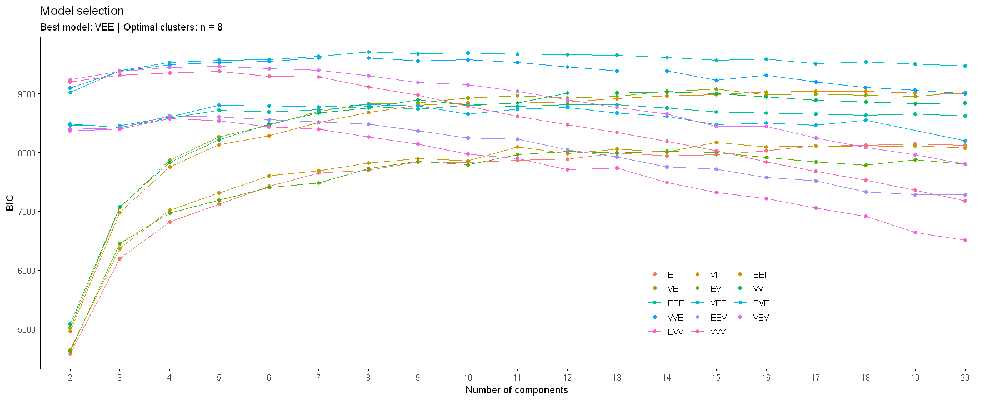

In [33]:
resBICall = mclustBIC(df2[,-c(8,9,10)], G=2:20)
summary(resBICall)

# --- #

resBICall = Mclust(df2[,-c(8,9,10)], G=2:20)
summary(resBICall)


fviz_mclust(resBICall, what="BIC")

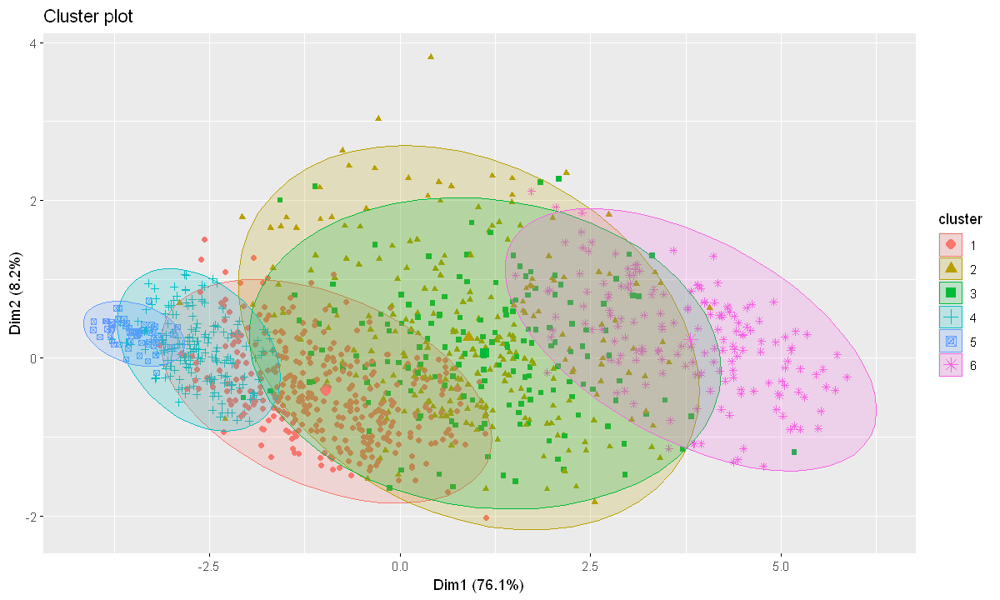

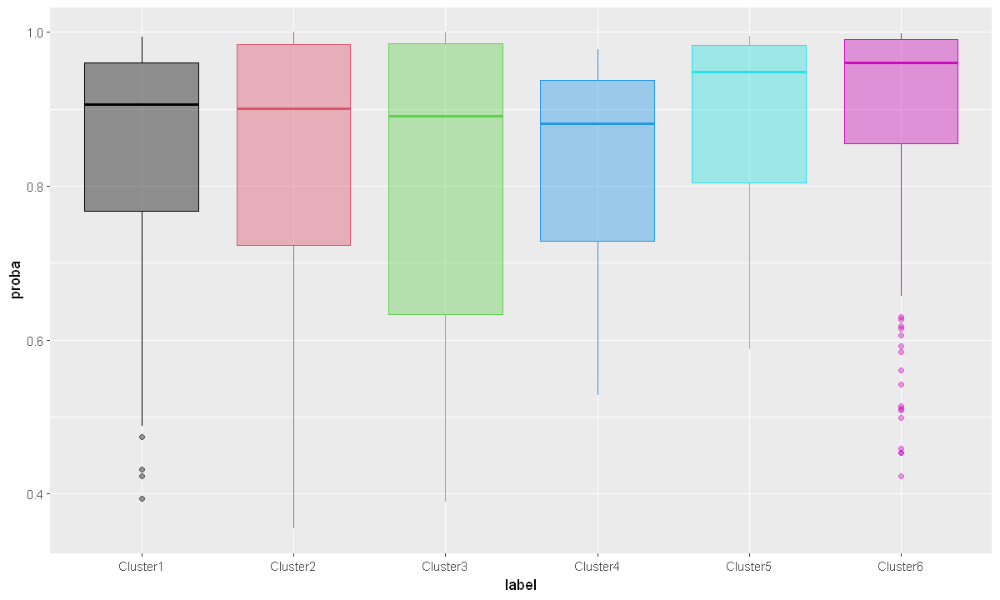

In [57]:
options(repr.plot.width = 10, repr.plot.height = 6)

resBIC = Mclust(df2[,-c(8,9,10)], G=6, modelNames = "VEE")
fviz_cluster(resBIC, data=df2[,-c(8,9,10)], ellipse.type="norm", geom="point")

# --- #

aux = data.frame(
    label = paste("Cluster", resBIC$classification, sep=""), 
    proba = apply(resBIC$z, 1, max))

ggplot(aux, aes(x=label, y=proba)) + 
    geom_boxplot(colour=1:6, fill=1:6, alpha=.4)

                     
                        1   2   3   4   5   6
  Divertissement area  19  54   8   0   1  28
  Living area         235 131  72 182  53  88
  Touristic area       50  38  31   0   0   6
  Working area         58  30  48   7   3  47


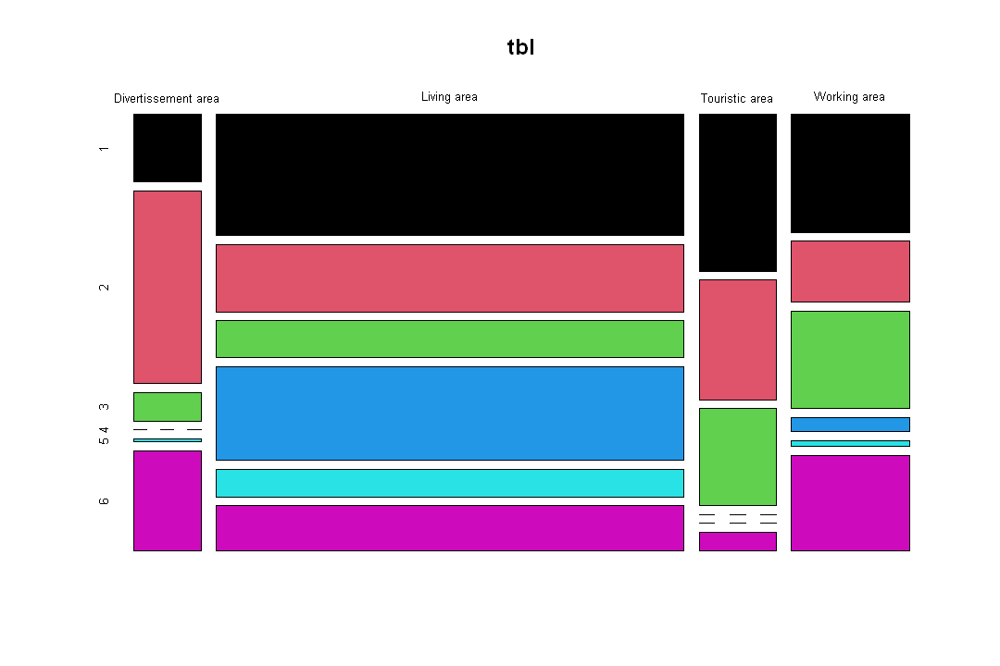

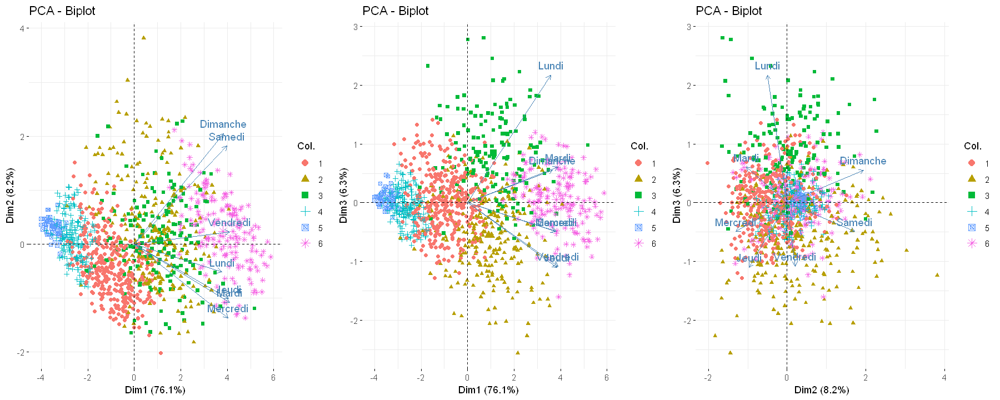

In [58]:
tbl = table(df2$Quartier, resBIC$classification)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(1:7))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp2, axes=c(1,2), geom = c("point"), col.ind=as.factor(resBIC$classification)),
    fviz_pca(acp2, axes=c(1,3), geom=c("point"), col.ind=as.factor(resBIC$classification)),
    fviz_pca(acp2, axes=c(2,3), geom=c("point"), col.ind=as.factor(resBIC$classification)),
    ncol=3
)

In [59]:
cluster_palette <- colorFactor(c("#E41A1C","#377EB8","#4DAF4A","#FF7F00","#984EA3","#FFFF33"), domain = unique(resBIC$classification))  # Utiliser la palette viridis avec 10 couleurs

leaflet(velib$position) %>% 
  addTiles(urlTemplate = "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png", 
           attribution = 'Map tiles by Carto, under CC BY 3.0. Data by OpenStreetMap, under ODbL.') %>% 
  addCircleMarkers(radius = 3,
                   color = ~cluster_palette(resBIC$classification),
                   stroke = FALSE, 
                   fillOpacity = 0.9) %>%
addLegend(position = "bottomright", 
            pal = cluster_palette, 
            values = ~resBIC$classification,
            title = "Cluster",
            opacity = 1)

HTML widgets cannot be represented in plain text (need html)

In [60]:
### cluster 1 : globalement vides, et plutot pleines la semaine
### cluster 2 : moyennes, et plutot pleines le week-end
### cluster 3 : moyennes, et plutot pleines en fin de semaine+début de semaine
### cluster 4 et 5 : tout le temps vides
### cluster 5 : tout le temps vides
### cluster 6 : tout le temps pleines

###" TABLEAU :
###          semaine    week-end
### plein    6             6
### moyen           3       2
### vide     1                       4 et 5 : tout le temps vides

In [21]:
resICLall = mclustICL(loading[,-c(169,170)], G=2:20)
summary(resICLall)

# --- #

resICLall = Mclust(loading[,-c(169,170)], G=2:20)
summary(resICLall)

Best ICL values:
            EEE,2       EEE,3       EEE,4
ICL      250202.4 249815.1523 249370.5341
ICL diff      0.0   -387.2472   -831.8654

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust EEE (ellipsoidal, equal volume, shape and orientation) model with 2
components: 

 log-likelihood    n    df      BIC      ICL
       176566.7 1189 14533 250227.1 250202.4

Clustering table:
  1   2 
636 553 

ERROR: Error in match.arg(what): 'arg' should be one of "classification", "uncertainty", "BIC"


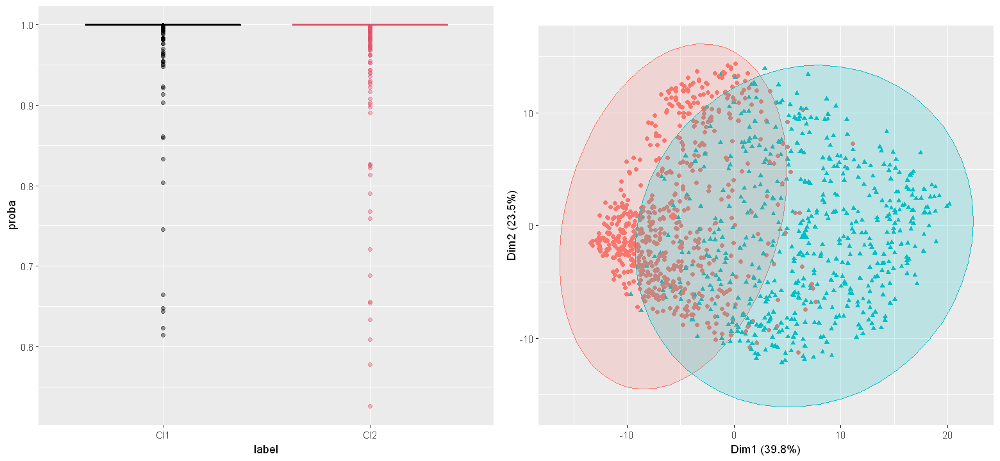

In [24]:
options(repr.plot.width = 13, repr.plot.height = 6)

resICL = Mclust(loading[,-c(169,170)], G=2, modelNames="EEE")

# --- #

aux = data.frame(
    label = paste("Cl", resICL$classification, sep=""), 
    proba = apply(resICL$z, 1, max))

p1 = ggplot(aux, aes(x=label, y=proba)) + geom_boxplot(colour=1:2, fill=1:2, alpha=.4)
p2 = fviz_cluster(resICL, data=loading[,-c(169,170)], ellipse.type="norm", geom="point") +
    ggtitle("") + theme(legend.position = "none")

grid.arrange(p1, p2, ncol = 2)

                     
                        1   2
  Divertissement area   9 101
  Living area         469 292
  Touristic area       60  65
  Working area         98  95


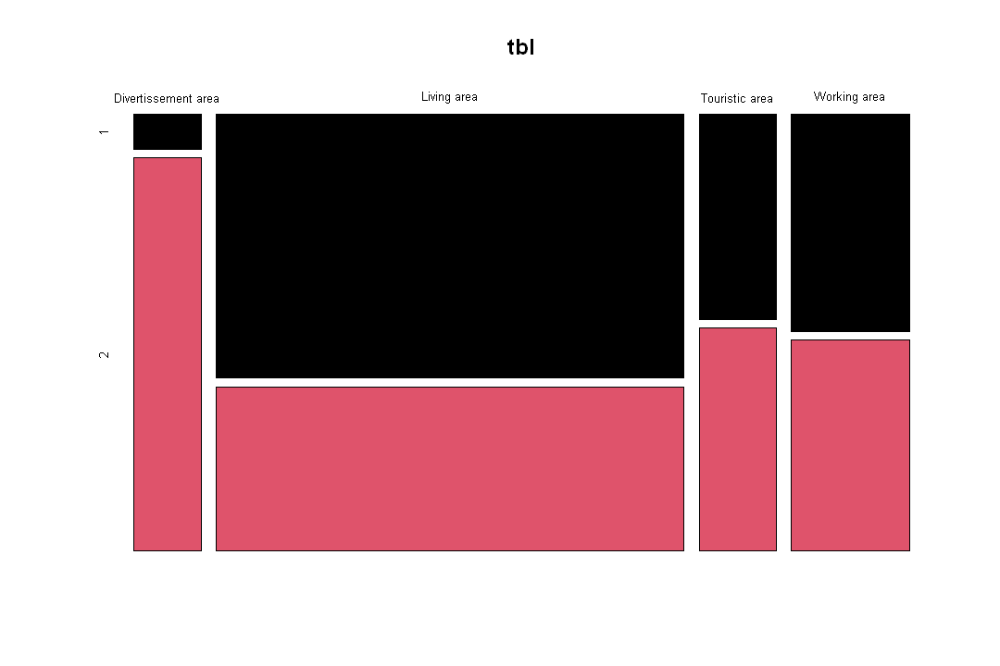

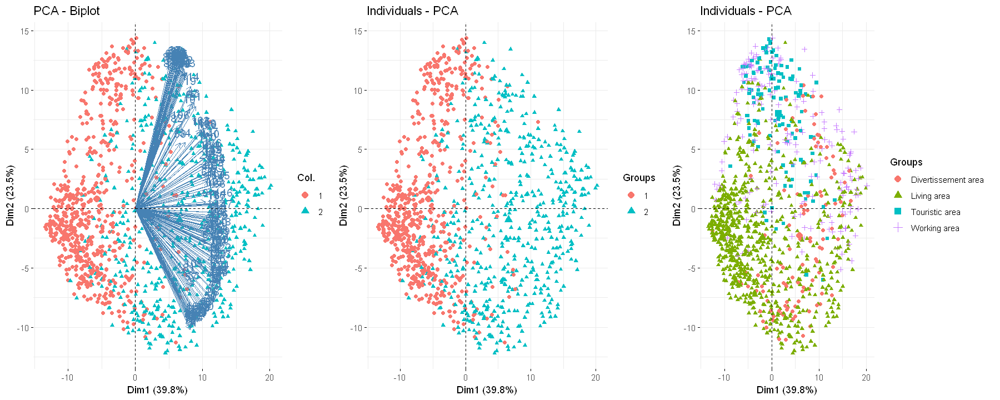

In [25]:
tbl = table(loading$Quartier, resICL$classification)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(1:3))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp, axes=c(1,2), geom = c("point"), col.ind=as.factor(resICL$classification)),
    fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=as.factor(resICL$classification)),
    fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=loading$Quartier),
    ncol=3
)

In [27]:
library(viridis)
cluster_palette <- colorFactor(viridis(n=2,option="D"), domain = unique(resICL$classification))
leaflet(velib$position) %>% addTiles() %>%
addCircleMarkers(radius=3,
color =  ~cluster_palette(resICL$classification),
stroke = FALSE, fillOpacity = 0.9) %>%
addLegend(position = "bottomright",  # Position de la légende
            pal = cluster_palette,  # Palette de couleurs
            values = ~resICL$classification,  # Valeurs à afficher dans la légende
            title = "Clusters")  # Titre de la légende

Le chargement a nécessité le package : viridisLite



HTML widgets cannot be represented in plain text (need html)

In [16]:
resICLall = mclustICL(df1[,-c(25,26,27)], G=2:20)
summary(resICLall)

# --- #


resICLall = Mclust(df1[,-c(25,26,27)], G=2:20)
summary(resICLall)

Best ICL values:
            VVE,8        VVE,6      VVE,9
ICL      84397.01 84394.359182 84339.6187
ICL diff     0.00    -2.648741   -57.3892

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVE (ellipsoidal, equal orientation) model with 8 components: 

 log-likelihood    n  df      BIC      ICL
       44664.25 1189 667 84605.56 84397.01

Clustering table:
  1   2   3   4   5   6   7   8 
162 229 326  65  85 131  90 101 

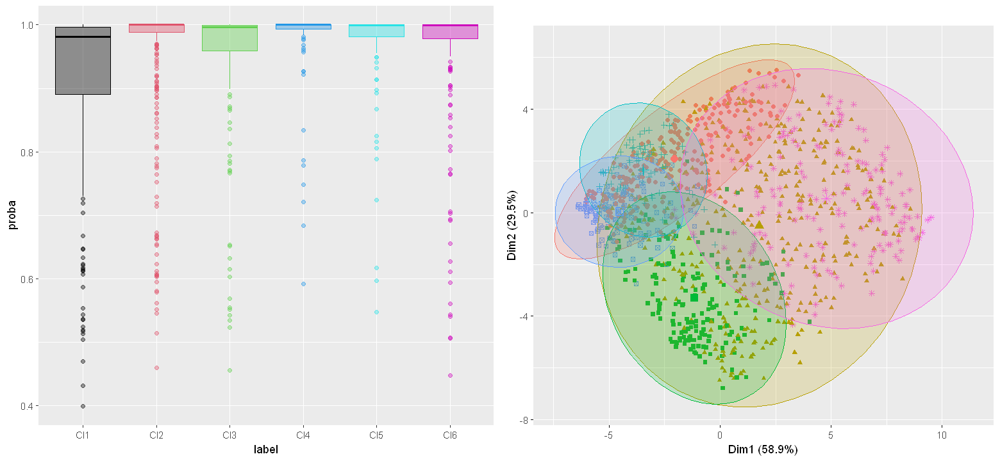

In [19]:
options(repr.plot.width = 13, repr.plot.height = 6)

resICL = Mclust(df1[,-c(25,26,27)], G=6, modelNames="VVE")

# --- #

aux = data.frame(
    label = paste("Cl", resICL$classification, sep=""), 
    proba = apply(resICL$z, 1, max))

p1 = ggplot(aux, aes(x=label, y=proba)) + geom_boxplot(colour=1:6, fill=1:6, alpha=.4)
p2 = fviz_cluster(resICL, data=loading[,-c(169,170)], ellipse.type="norm", geom="point") +
    ggtitle("") + theme(legend.position = "none")

grid.arrange(p1, p2, ncol = 2)

                     
                        1   2   3   4   5   6
  Divertissement area  25  77   1   0   1   6
  Living area         223 161  70  77 114 116
  Touristic area        1  86  32   0   1   5
  Working area          5  55  69   2   6  56


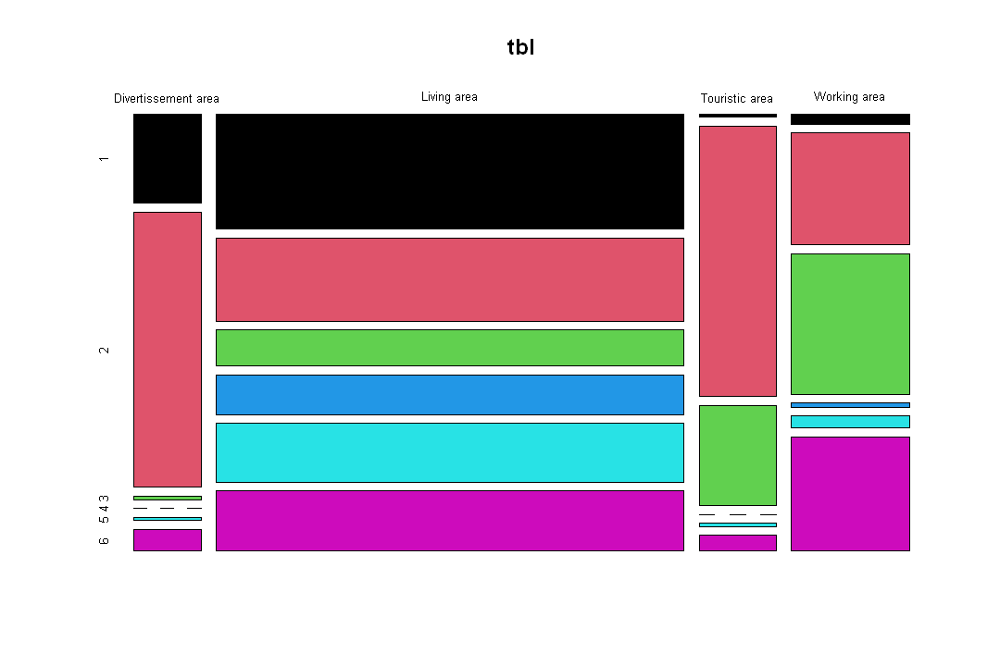

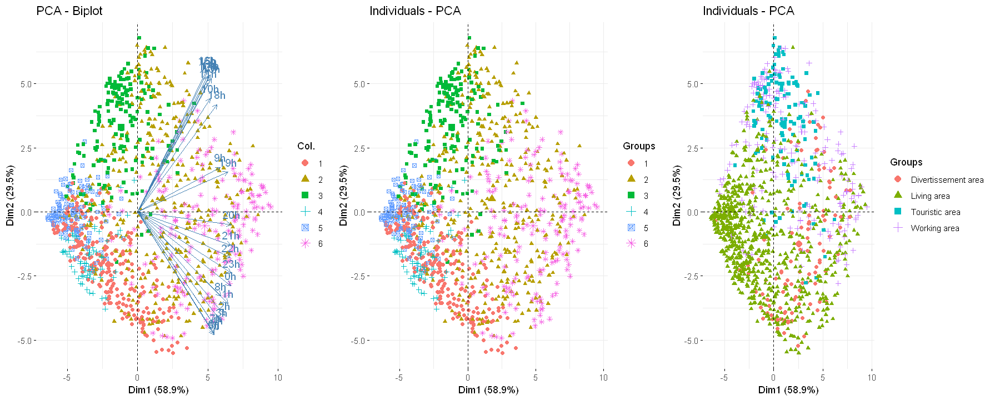

In [20]:
tbl = table(df1$Quartier, resICL$classification)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(1:7))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(resICL$classification)),
    fviz_pca_ind(acp1, axes=c(1,2), geom=c("point"), habillage=as.factor(resICL$classification)),
    fviz_pca_ind(acp1, axes=c(1,2), geom=c("point"), habillage=df1$Quartier),
    ncol=3
)

In [24]:
library(viridis)
cluster_palette <- colorFactor(viridis(n=6,option="D"), domain = unique(resICL$classification))
leaflet(velib$position) %>% addTiles() %>%
addCircleMarkers(radius=3,
color =  ~cluster_palette(resICL$classification),
stroke = FALSE, fillOpacity = 0.9) %>%
addLegend(position = "bottomright",  # Position de la légende
            pal = cluster_palette,  # Palette de couleurs
            values = ~resICL$classification,  # Valeurs à afficher dans la légende
            title = "Clusters")  # Titre de la légende

HTML widgets cannot be represented in plain text (need html)

In [32]:
resICLall = mclustICL(df2[,-c(8,9,10)], G=2:20)
summary(resICLall)

# --- #

resICLall = Mclust(df2[,-c(8,9,10)], G=2:20)
summary(resICLall)

Best ICL values:
            VEV,4      VEV,3      VEE,4
ICL      9226.192 9204.41334 9203.15914
ICL diff    0.000  -21.77817  -23.03236

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VEE (ellipsoidal, equal shape and orientation) model with 8 components: 

 log-likelihood    n df      BIC      ICL
       5198.666 1189 98 9703.408 9169.604

Clustering table:
  1   2   3   4   5   6   7   8 
279 119 167 164 186  44  59 171 

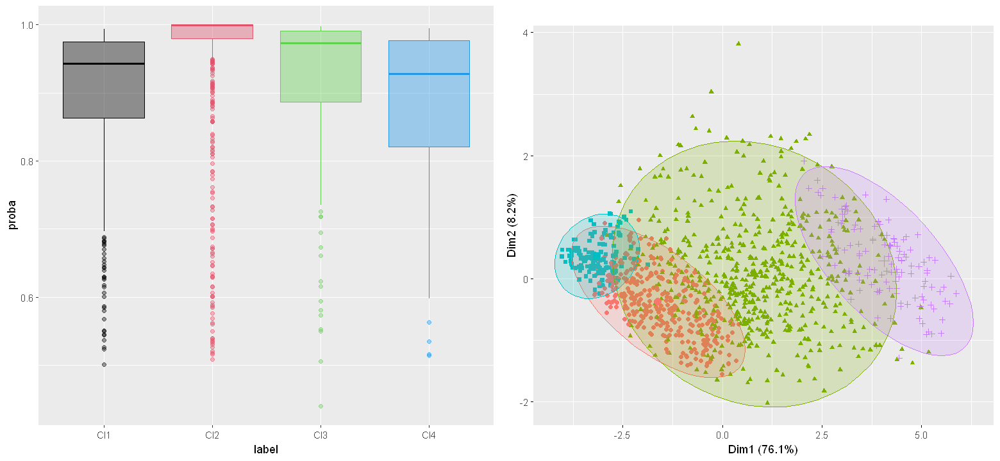

In [33]:
options(repr.plot.width = 13, repr.plot.height = 6)

resICL = Mclust(df2[,-c(8,9,10)], G=4, modelNames="VEV")

# --- #

aux = data.frame(
    label = paste("Cl", resICL$classification, sep=""), 
    proba = apply(resICL$z, 1, max))

p1 = ggplot(aux, aes(x=label, y=proba)) + geom_boxplot(colour=1:4, fill=1:4, alpha=.4)
p2 = fviz_cluster(resICL, data=df2[,-c(8,9,10)], ellipse.type="norm", geom="point") +
    ggtitle("") + theme(legend.position = "none")

grid.arrange(p1, p2, ncol = 2)

                     
                        1   2   3   4
  Divertissement area   7  89   1  13
  Living area         253 311 130  67
  Touristic area       27  94   0   4
  Working area         56  89   5  43


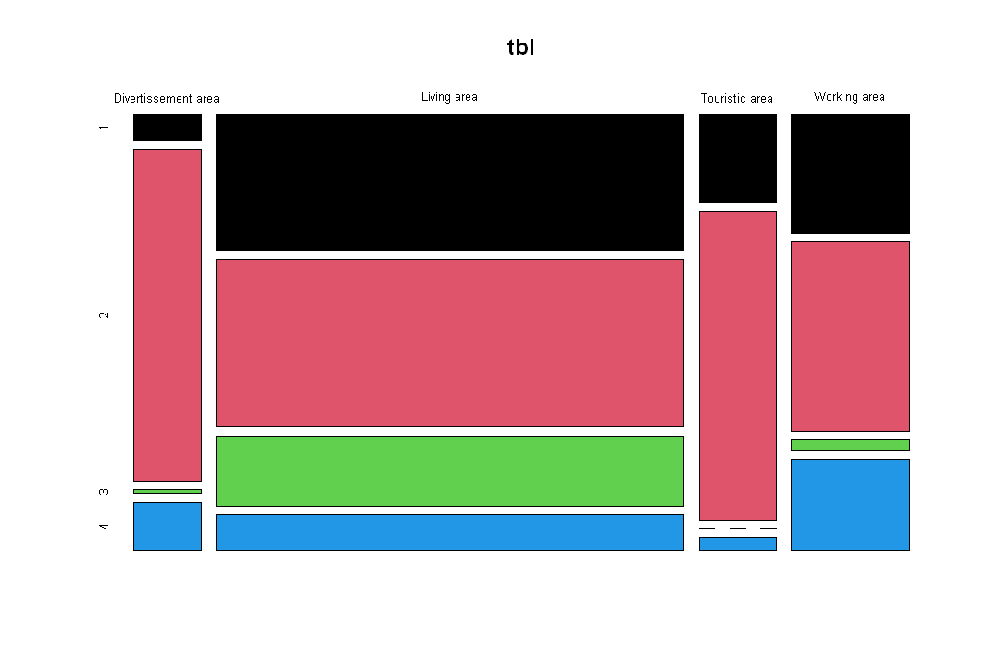

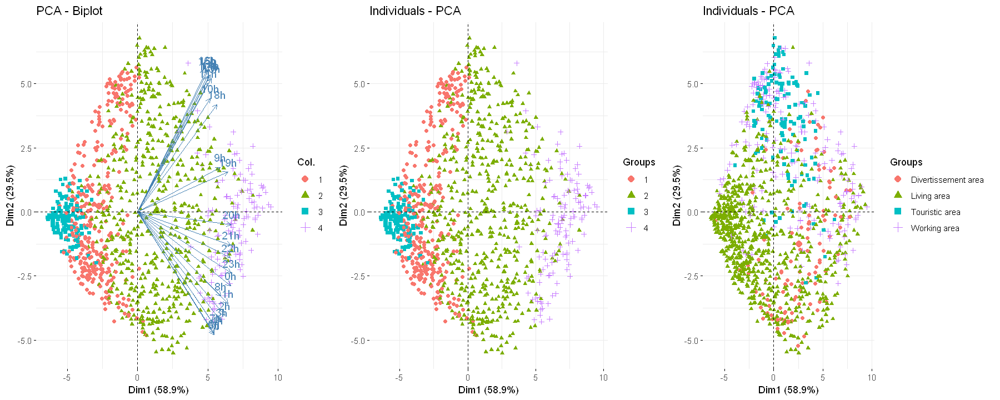

In [34]:
tbl = table(df2$Quartier, resICL$classification)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(1:5))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(resICL$classification)),
    fviz_pca_ind(acp1, axes=c(1,2), geom=c("point"), habillage=as.factor(resICL$classification)),
    fviz_pca_ind(acp1, axes=c(1,2), geom=c("point"), habillage=df2$Quartier),
    ncol=3
)

In [35]:
cluster_palette <- colorFactor(viridis(n=4,option="D"), domain = unique(resICL$classification))
leaflet(velib$position) %>% addTiles() %>%
addCircleMarkers(radius=3,
color =  ~cluster_palette(resICL$classification),
stroke = FALSE, fillOpacity = 0.9) %>%
addLegend(position = "bottomright",  # Position de la légende
            pal = cluster_palette,  # Palette de couleurs
            values = ~resICL$classification,  # Valeurs à afficher dans la légende
            title = "Clusters")  # Titre de la légende

HTML widgets cannot be represented in plain text (need html)

Warning message:
"The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as of ggplot2 3.3.4.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>."


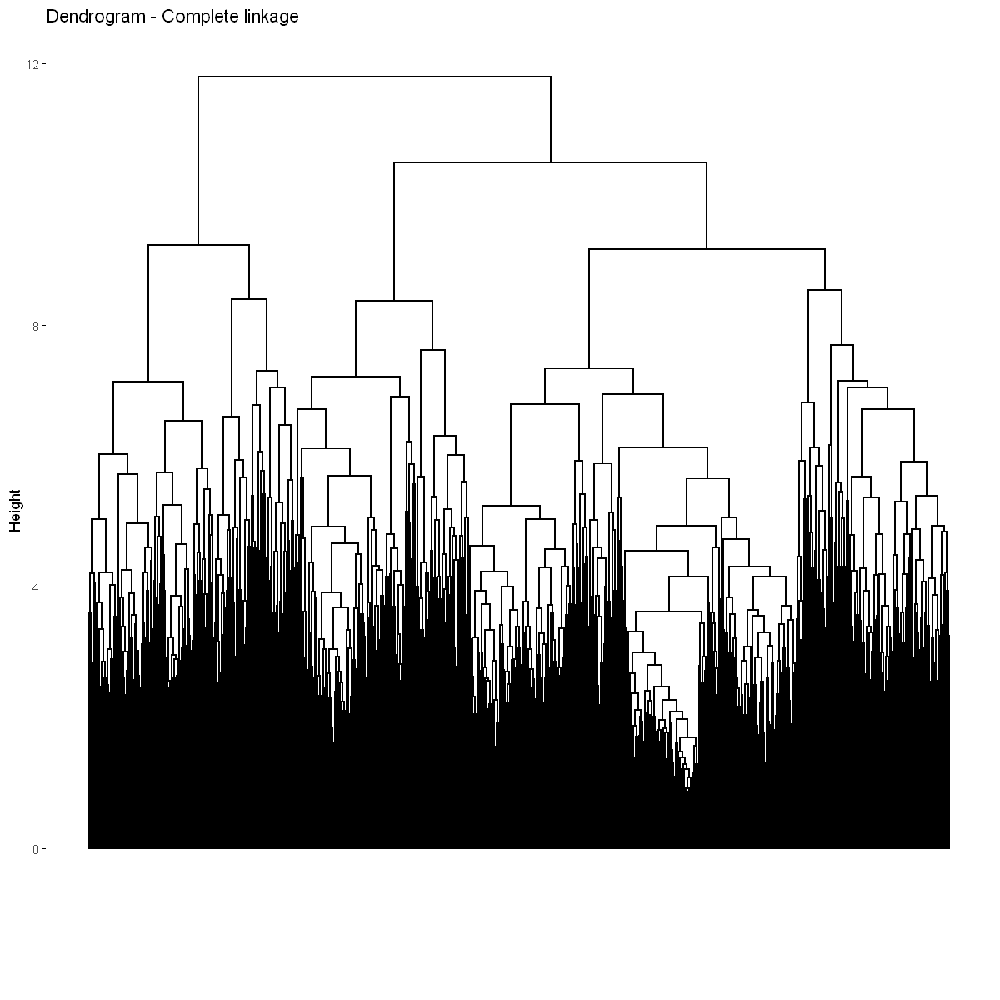

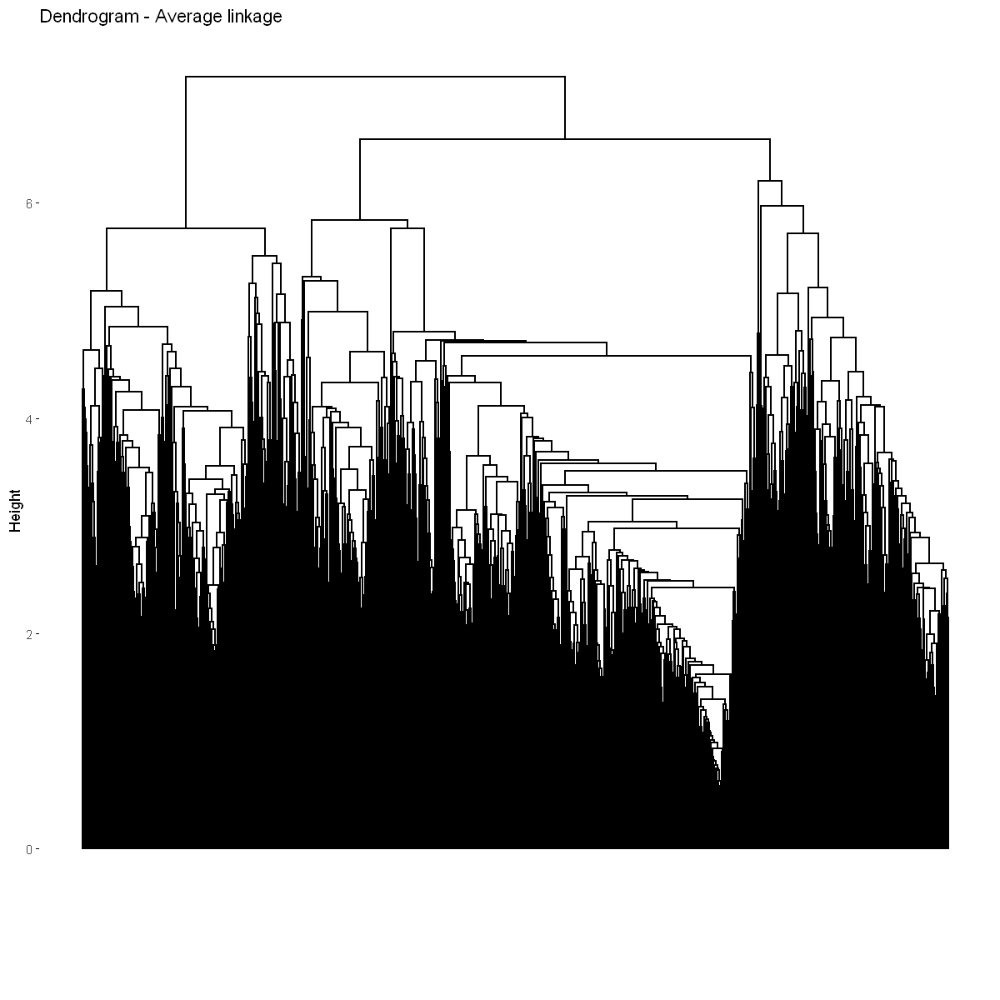

In [16]:
### TO BE COMPLETED ### 
d = dist(loading[,-c(169,170)], method="euclidean")

# Clustering
hclustsingle = hclust(d, method="single")
hclustcomplete = hclust(d, method="complete")
hclustaverage = hclust(d, method="average")

# --- #
#Dendograms visualization
options(repr.plot.width=10, repr.plot.height=10)

fviz_dend(hclustsingle, show_labels=FALSE, main='Dendrogram - Single linkage')
fviz_dend(hclustcomplete, show_labels=FALSE, main='Dendrogram - Complete linkage')
fviz_dend(hclustaverage, show_labels=FALSE, main='Dendrogram - Average linkage')

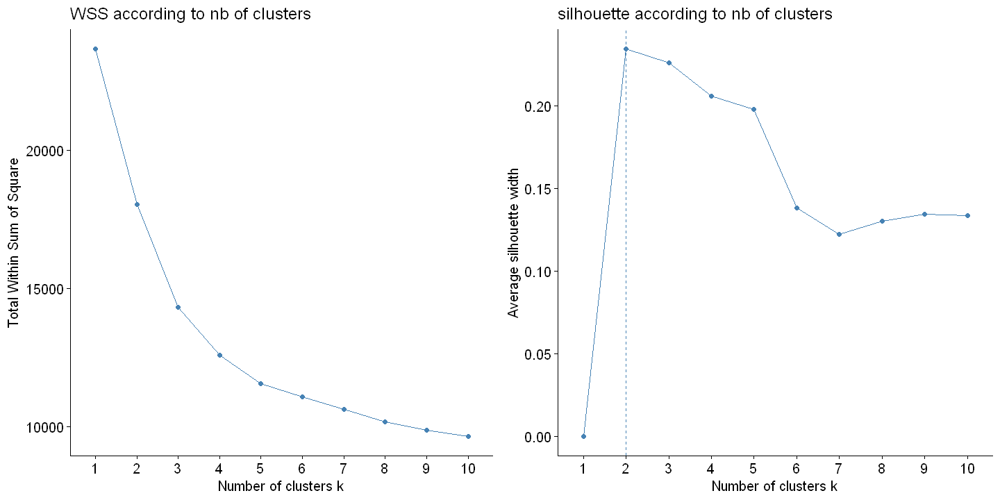

In [17]:
options(repr.plot.width = 12, repr.plot.height = 6)

grid.arrange(
    fviz_nbclust(loading[,-c(169,170)], FUNcluster=hcut, method="wss") + ggtitle("WSS according to nb of clusters"),
    fviz_nbclust(loading[,-c(169,170)], FUNcluster=hcut, method="silhouette") + ggtitle("silhouette according to nb of clusters"),
    ncol=2
)

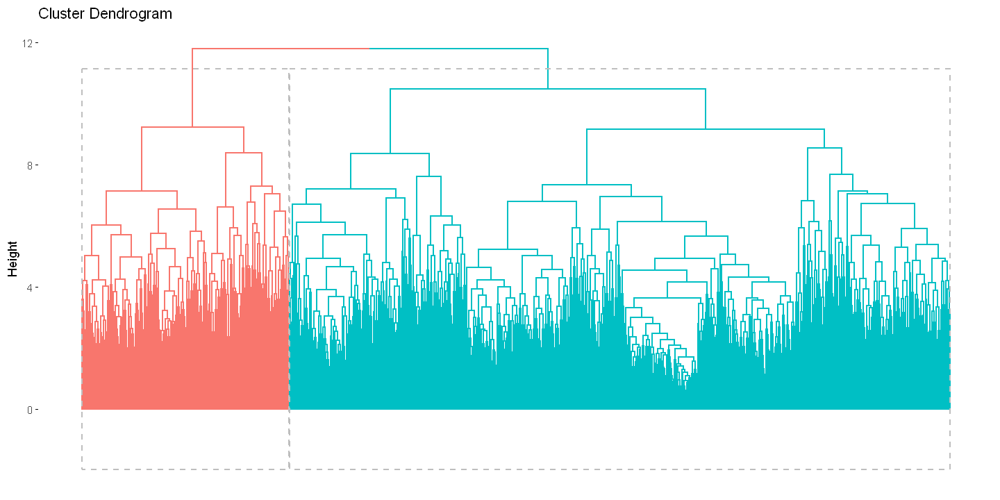

In [18]:
reshclust = cutree(hclustcomplete, 2)

# --- #

fviz_dend(hclustcomplete, k=2, show_labels=FALSE, rect=TRUE)

                     reshclust
                        1   2
  Divertissement area  55  55
  Living area         630 131
  Touristic area      105  20
  Working area        115  78


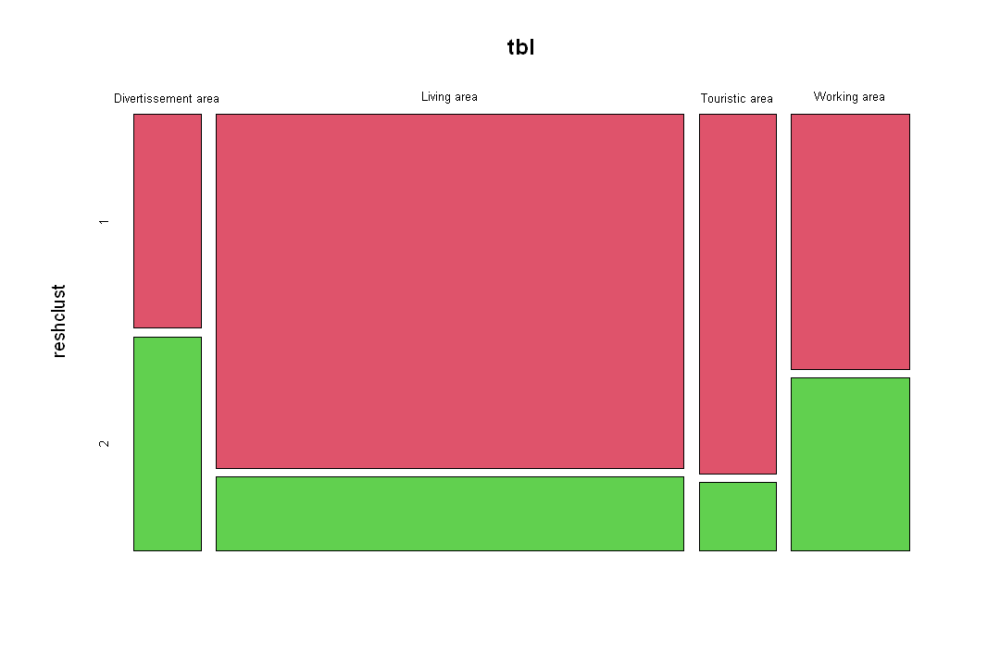

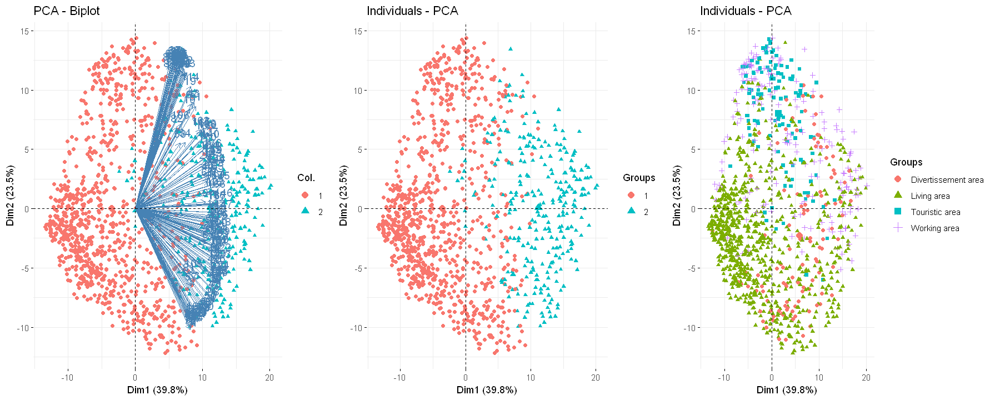

In [20]:
tbl = table(loading$Quartier, reshclust)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:3))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp, axes=c(1,2), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=as.factor(reshclust)),
    fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=loading$Quartier),
    ncol=3
)

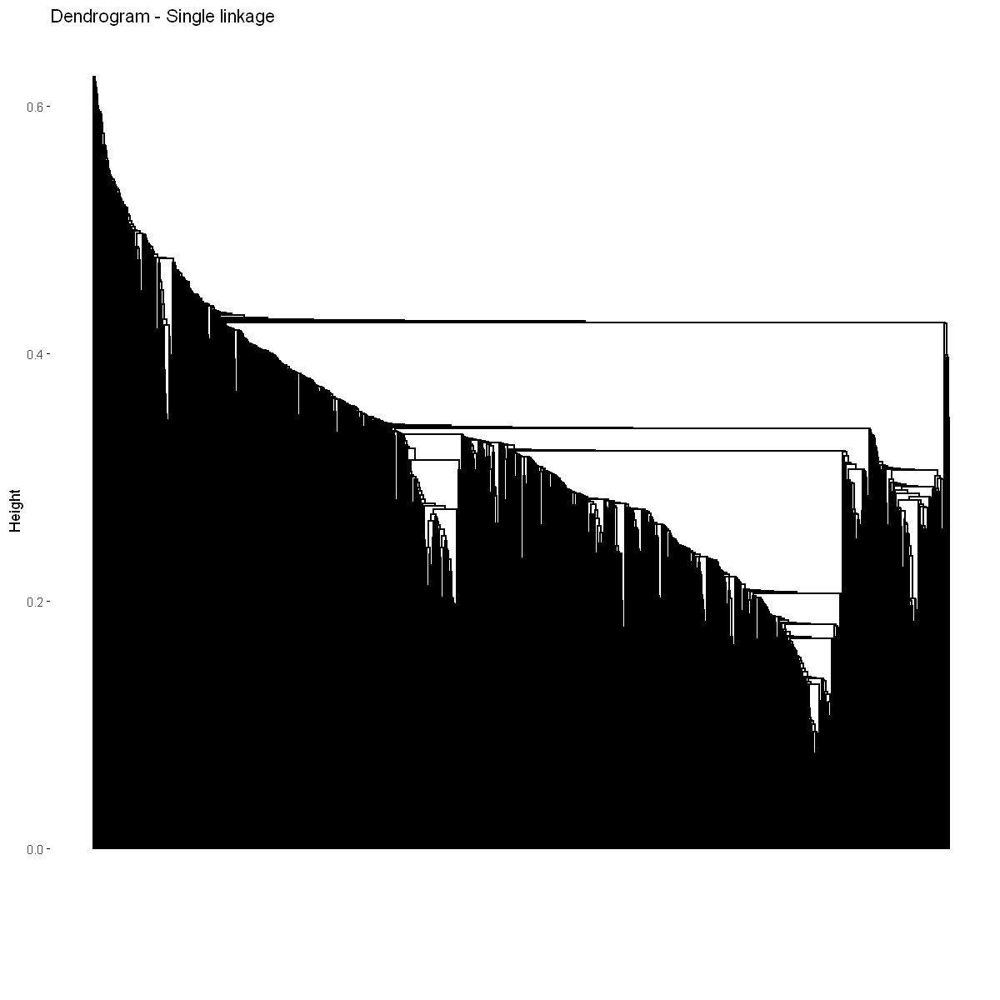

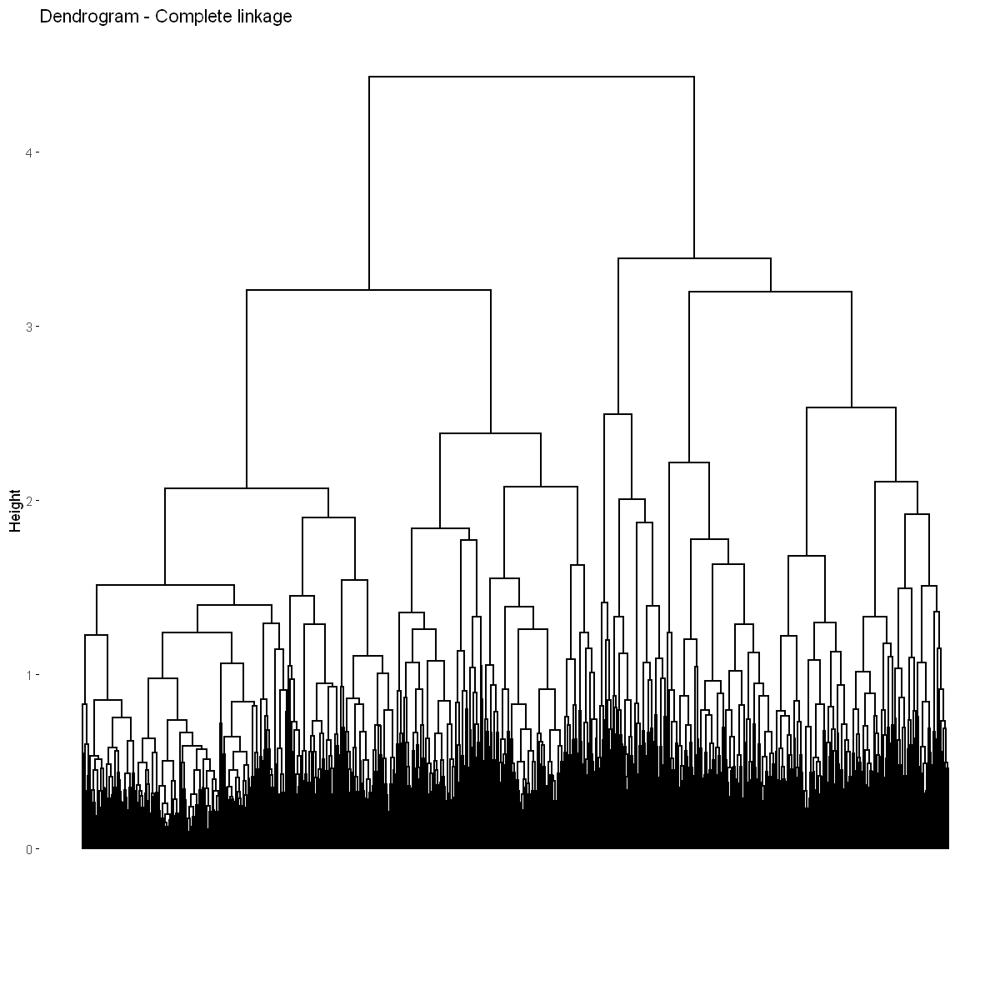

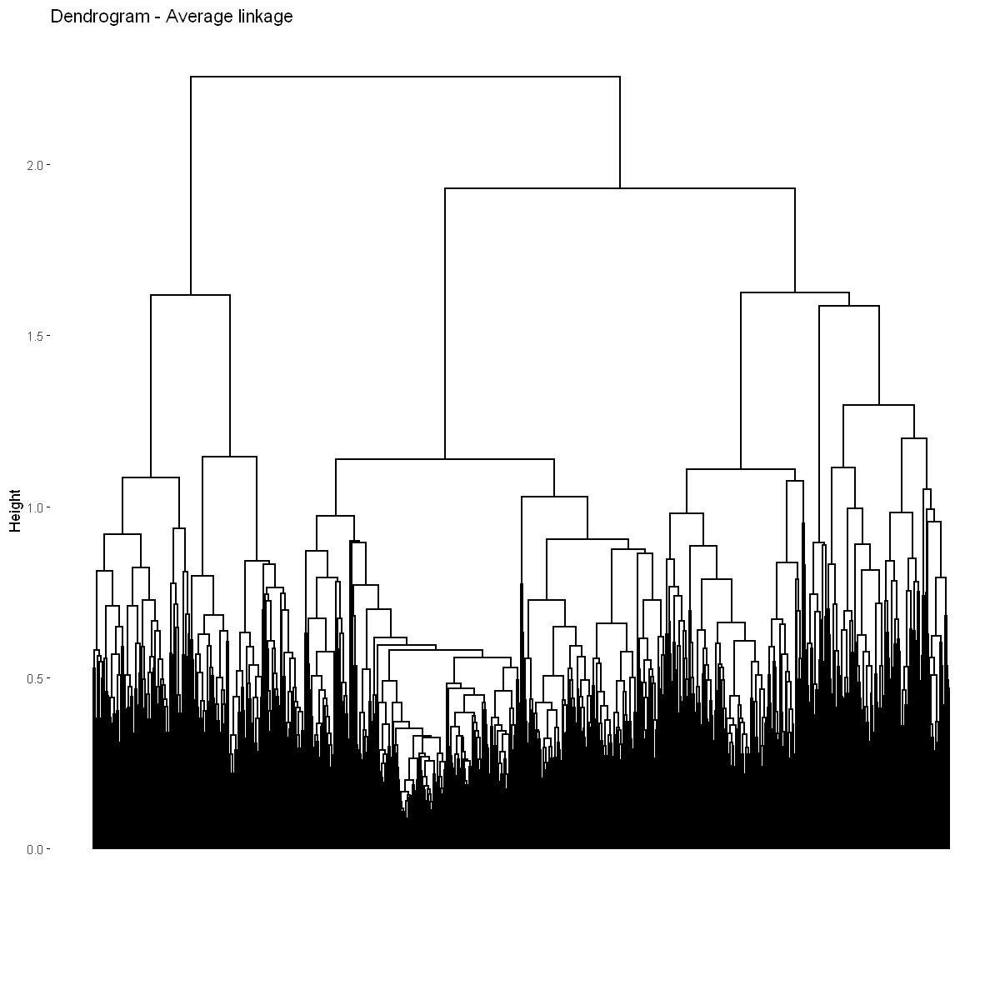

In [21]:
d = dist(df1[,-c(25,26,27)], method="euclidean")

# Clustering
hclustsingle = hclust(d, method="single")
hclustcomplete = hclust(d, method="complete")
hclustaverage = hclust(d, method="average")

# --- #
#Dendograms visualization
options(repr.plot.width=10, repr.plot.height=10)

fviz_dend(hclustsingle, show_labels=FALSE, main='Dendrogram - Single linkage')
fviz_dend(hclustcomplete, show_labels=FALSE, main='Dendrogram - Complete linkage')
fviz_dend(hclustaverage, show_labels=FALSE, main='Dendrogram - Average linkage')

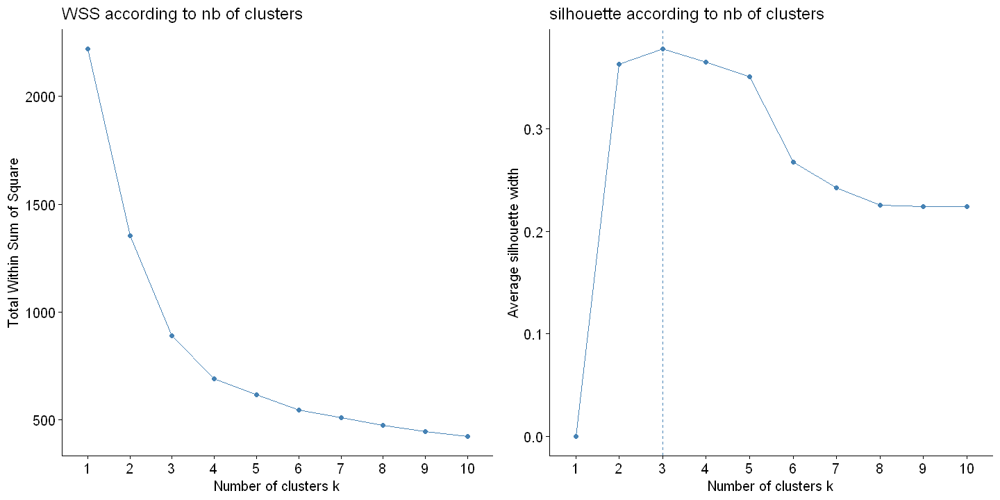

In [22]:
options(repr.plot.width = 12, repr.plot.height = 6)

grid.arrange(
    fviz_nbclust(df1[,-c(25,26,27)], FUNcluster=hcut, method="wss") + ggtitle("WSS according to nb of clusters"),
    fviz_nbclust(df1[,-c(25,26,27)], FUNcluster=hcut, method="silhouette") + ggtitle("silhouette according to nb of clusters"),
    ncol=2
)

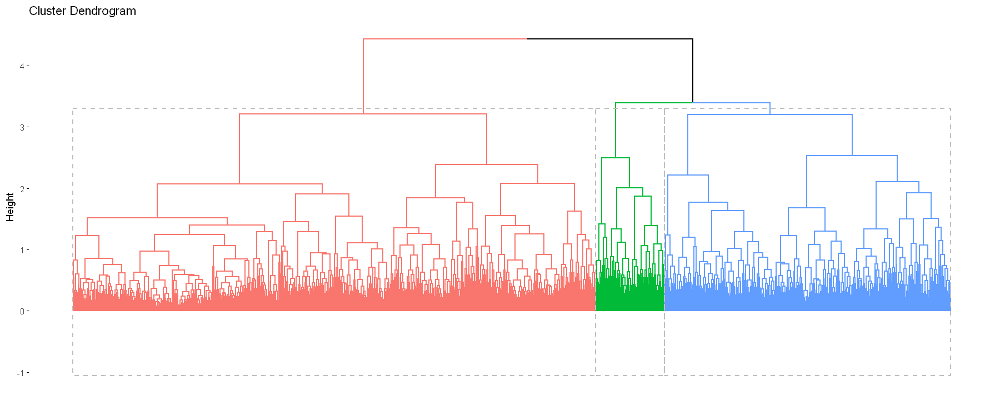

In [24]:
reshclust = cutree(hclustcomplete, 3)

# --- #

fviz_dend(hclustcomplete, k=3, show_labels=FALSE, rect=TRUE)

                     reshclust
                        1   2   3
  Divertissement area  14  75  21
  Living area         512 243   6
  Touristic area       70  14  41
  Working area        112  56  25


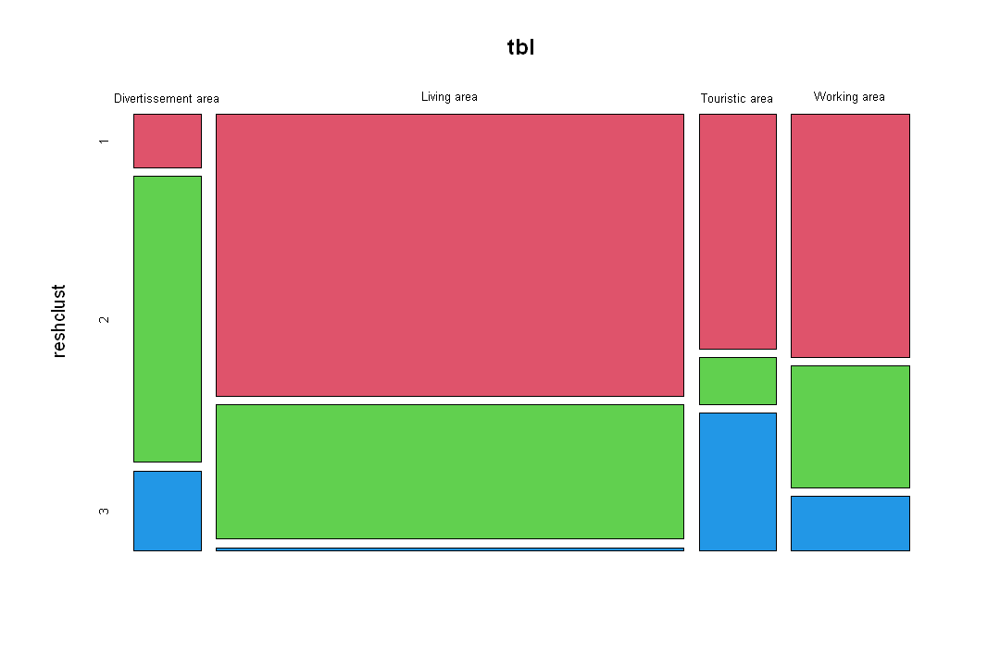

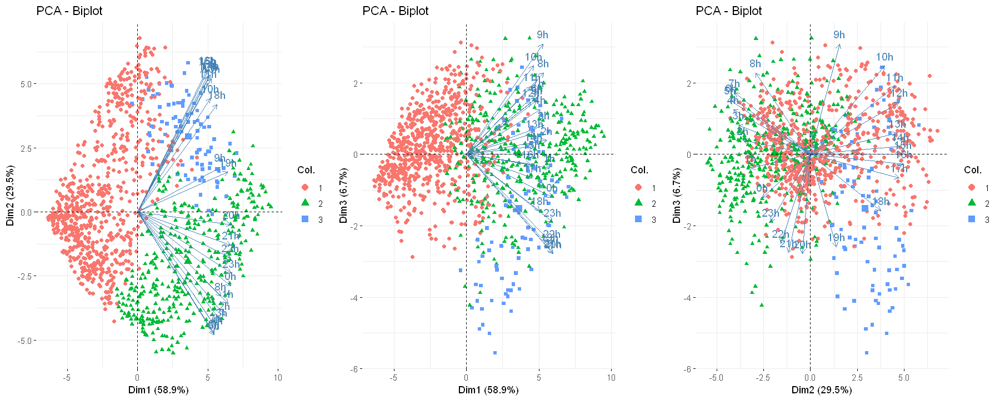

In [28]:
tbl = table(loading$Quartier, reshclust)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:4))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca(acp1, axes=c(1,3), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca(acp1, axes=c(2,3), geom = c("point"), col.ind=as.factor(reshclust)),
    ncol=3
)

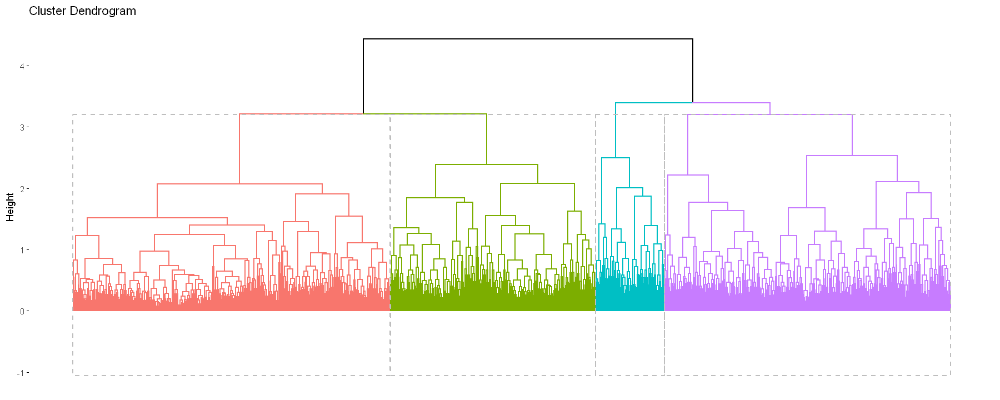

In [29]:
reshclust = cutree(hclustcomplete, 4)

# --- #

fviz_dend(hclustcomplete, k=4, show_labels=FALSE, rect=TRUE)

                     reshclust
                        1   2   3   4
  Divertissement area   9  75   5  21
  Living area         401 243 111   6
  Touristic area        3  14  67  41
  Working area         17  56  95  25


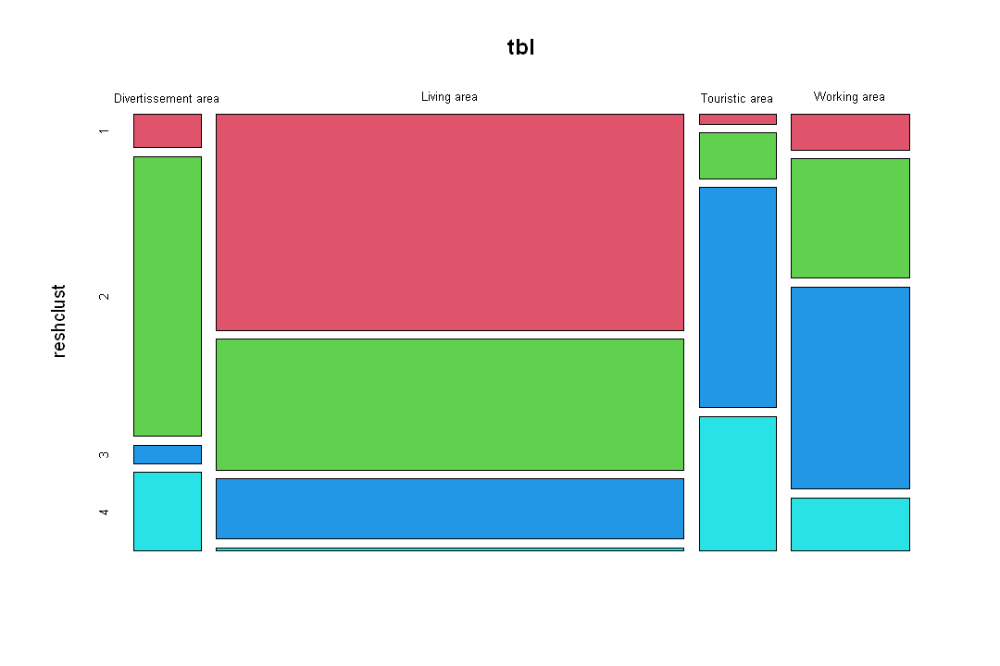

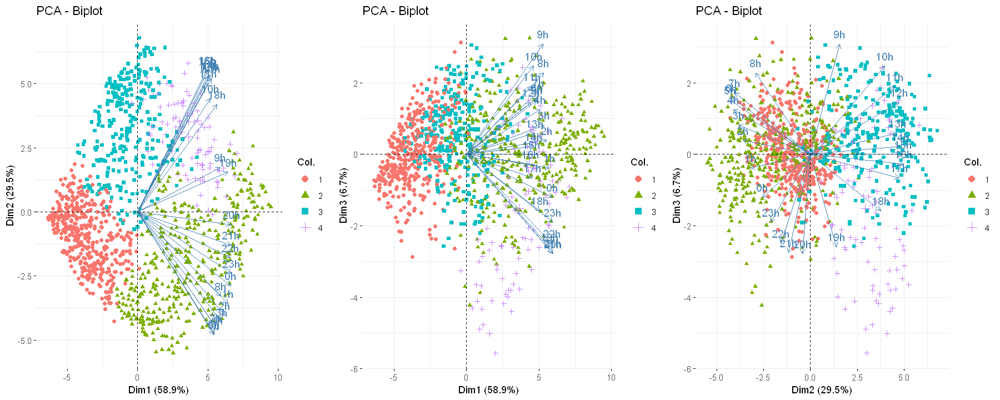

In [30]:
tbl = table(loading$Quartier, reshclust)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:5))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca(acp1, axes=c(1,3), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca(acp1, axes=c(2,3), geom = c("point"), col.ind=as.factor(reshclust)),
    ncol=3
)

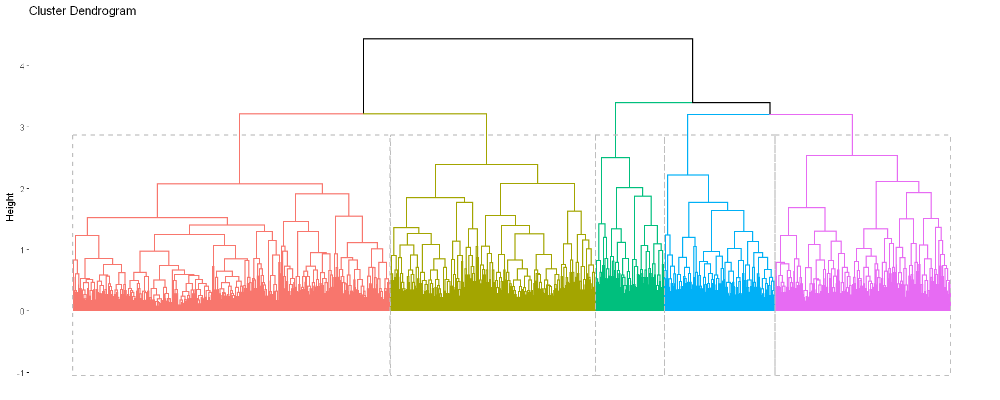

In [31]:
reshclust = cutree(hclustcomplete, 5)

# --- #

fviz_dend(hclustcomplete, k=5, show_labels=FALSE, rect=TRUE)

                     reshclust
                        1   2   3   4   5
  Divertissement area   9  34  41   5  21
  Living area         401 115 128 111   6
  Touristic area        3   1  13  67  41
  Working area         17   0  56  95  25


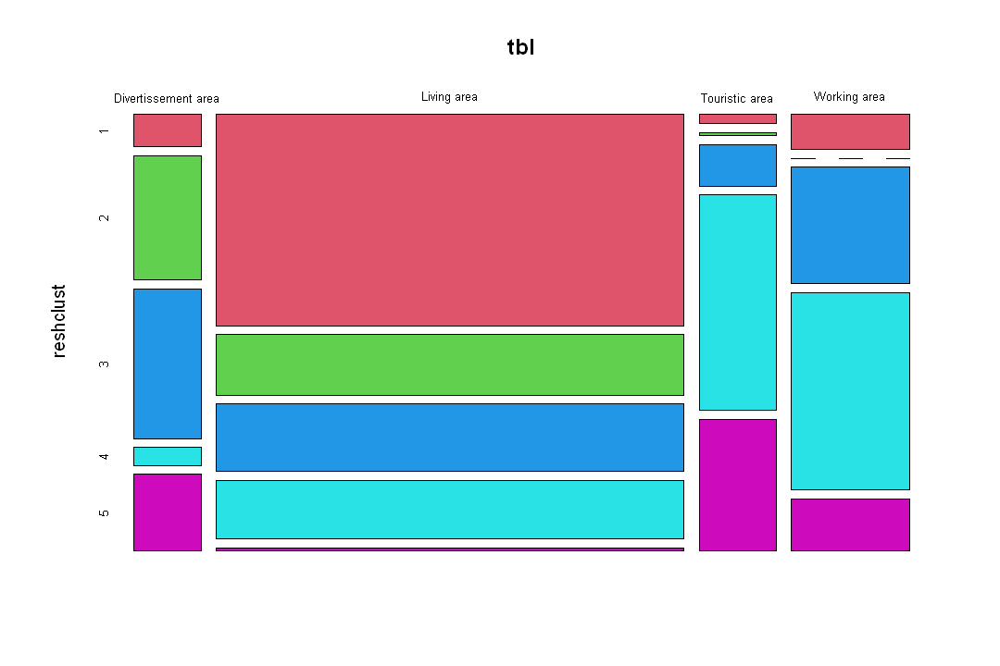

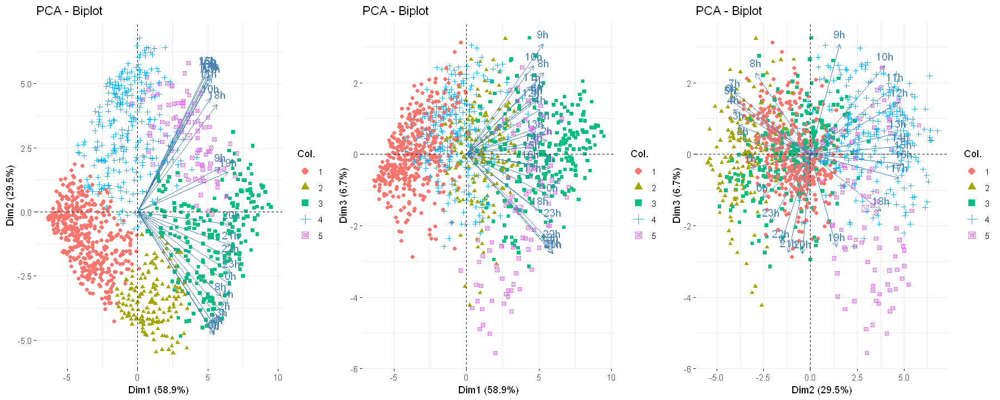

In [32]:
tbl = table(loading$Quartier, reshclust)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:6))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca(acp1, axes=c(1,3), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca(acp1, axes=c(2,3), geom = c("point"), col.ind=as.factor(reshclust)),
    ncol=3
)

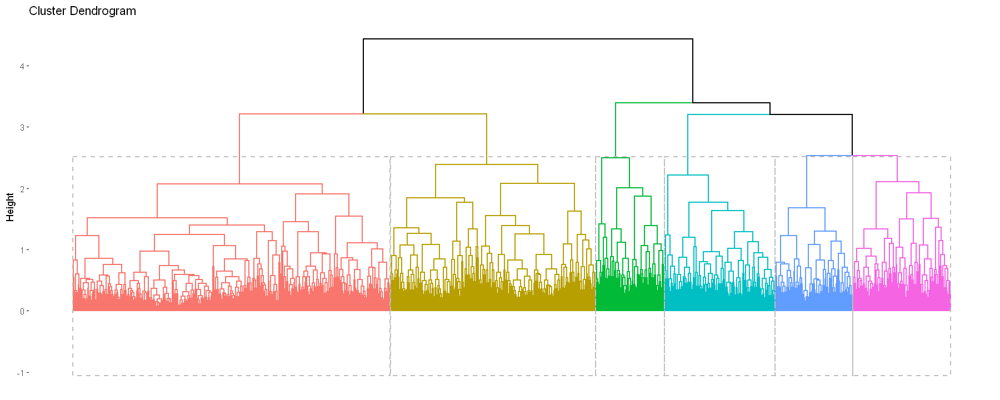

In [33]:
reshclust = cutree(hclustcomplete, 6)

# --- #

fviz_dend(hclustcomplete, k=6, show_labels=FALSE, rect=TRUE)

                     reshclust
                        1   2   3   4   5   6
  Divertissement area   9  34  33   5  21   8
  Living area         401 115  75 111   6  53
  Touristic area        3   1  11  67  41   2
  Working area         17   0  14  95  25  42


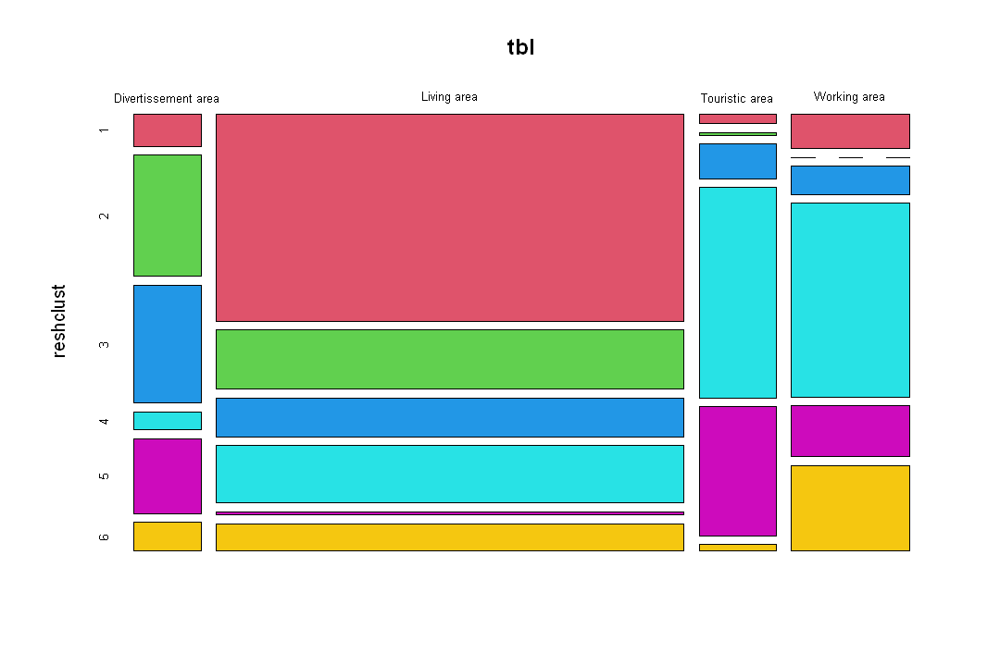

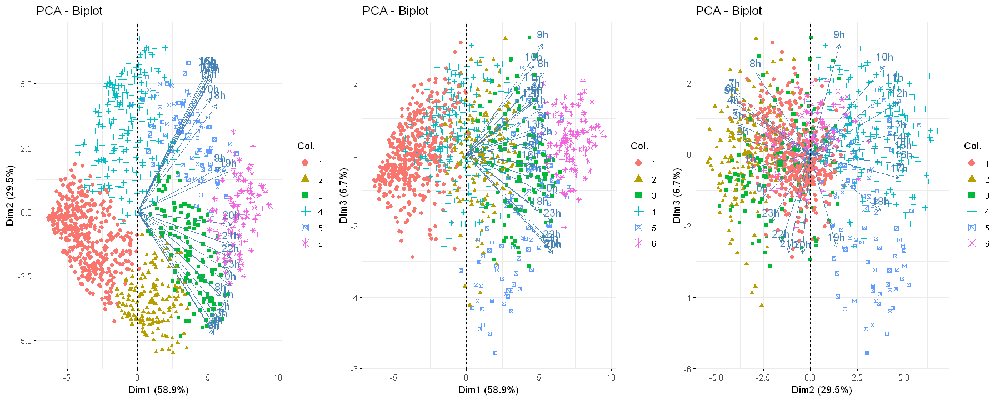

In [34]:
tbl = table(loading$Quartier, reshclust)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:7))

# --- #
options(repr.plot.width = 15, repr.plot.height = 6)

grid.arrange(
    fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca(acp1, axes=c(1,3), geom = c("point"), col.ind=as.factor(reshclust)),
    fviz_pca(acp1, axes=c(2,3), geom = c("point"), col.ind=as.factor(reshclust)),
    ncol=3
)